# Prelims:
## Required Modules

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import tensorflow as tf
from sklearn.metrics import roc_curve

%matplotlib inline

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


## Importing / Formatting Data

In [2]:
df = pd.read_csv("../data/train_2.csv", index_col='Page')
print(df.shape)
df.head()

(145063, 803)


,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2017-09-01,2017-09-02,2017-09-03,2017-09-04,2017-09-05,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10
Page,,,,,,,,,,,,,,,,,,,,,
2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,24.0,...,19.0,33.0,33.0,18.0,16.0,27.0,29.0,23.0,54.0,38.0
2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,4.0,...,32.0,30.0,11.0,19.0,54.0,25.0,26.0,23.0,13.0,81.0
3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,4.0,...,6.0,6.0,7.0,2.0,4.0,7.0,3.0,4.0,7.0,6.0
4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,16.0,...,7.0,19.0,19.0,9.0,6.0,16.0,19.0,30.0,38.0,4.0
52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,16.0,16.0,19.0,9.0,20.0,23.0,28.0,14.0,8.0,7.0


In [3]:
df = df.pct_change(axis=1)
df.head()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2017-09-01,2017-09-02,2017-09-03,2017-09-04,2017-09-05,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10
Page,,,,,,,,,,,,,,,,,,,,,
2NE1_zh.wikipedia.org_all-access_spider,NaN,-0.388889,-0.545455,1.6,0.076923,-0.357143,0.000000,1.444444,0.181818,-0.076923,...,-0.095238,0.736842,0.000000,-0.454545,-0.111111,0.687500,0.074074,-0.206897,1.347826,-0.296296
2PM_zh.wikipedia.org_all-access_spider,NaN,0.272727,0.071429,0.2,-0.388889,0.181818,0.692308,-0.500000,-0.090909,-0.600000,...,0.280000,-0.062500,-0.633333,0.727273,1.842105,-0.537037,0.040000,-0.115385,-0.434783,5.230769
3C_zh.wikipedia.org_all-access_spider,NaN,-1.000000,inf,0.0,-1.000000,inf,-1.000000,inf,0.333333,0.000000,...,-0.333333,0.000000,0.166667,-0.714286,1.000000,0.750000,-0.571429,0.333333,0.750000,-0.142857
4minute_zh.wikipedia.org_all-access_spider,NaN,-0.628571,-0.230769,8.4,-0.957447,5.500000,-0.461538,-0.357143,0.222222,0.454545,...,-0.533333,1.714286,0.000000,-0.526316,-0.333333,1.666667,0.187500,0.578947,0.266667,-0.894737
52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.333333,0.000000,0.187500,-0.526316,1.222222,0.150000,0.217391,-0.500000,-0.428571,-0.125000


In [4]:
df = df.fillna(0)
df[df == np.inf] = 1.0
df.head()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2017-09-01,2017-09-02,2017-09-03,2017-09-04,2017-09-05,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10
Page,,,,,,,,,,,,,,,,,,,,,
2NE1_zh.wikipedia.org_all-access_spider,0.0,-0.388889,-0.545455,1.6,0.076923,-0.357143,0.000000,1.444444,0.181818,-0.076923,...,-0.095238,0.736842,0.000000,-0.454545,-0.111111,0.687500,0.074074,-0.206897,1.347826,-0.296296
2PM_zh.wikipedia.org_all-access_spider,0.0,0.272727,0.071429,0.2,-0.388889,0.181818,0.692308,-0.500000,-0.090909,-0.600000,...,0.280000,-0.062500,-0.633333,0.727273,1.842105,-0.537037,0.040000,-0.115385,-0.434783,5.230769
3C_zh.wikipedia.org_all-access_spider,0.0,-1.000000,1.000000,0.0,-1.000000,1.000000,-1.000000,1.000000,0.333333,0.000000,...,-0.333333,0.000000,0.166667,-0.714286,1.000000,0.750000,-0.571429,0.333333,0.750000,-0.142857
4minute_zh.wikipedia.org_all-access_spider,0.0,-0.628571,-0.230769,8.4,-0.957447,5.500000,-0.461538,-0.357143,0.222222,0.454545,...,-0.533333,1.714286,0.000000,-0.526316,-0.333333,1.666667,0.187500,0.578947,0.266667,-0.894737
52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-0.333333,0.000000,0.187500,-0.526316,1.222222,0.150000,0.217391,-0.500000,-0.428571,-0.125000


In [5]:
val = df.iloc[:,-20:]
trn = df.iloc[:,:-20]

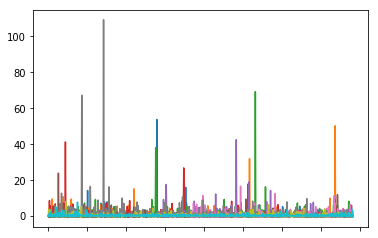

In [6]:
trn.iloc[:10,:].T.plot(legend=False)

# Simple implementation
## Translating [this](https://medium.com/@erikhallstrm/hello-world-rnn-83cd7105b767) article

### Just running his:

Instructions for updating:
Use `tf.global_variables_initializer` instead.


New data, epoch 0
Step 0 Loss 0.708773


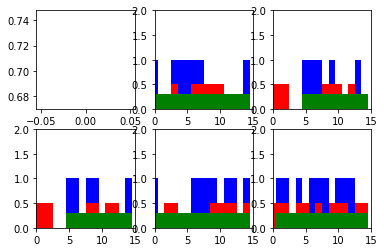

Step 100 Loss 0.02884


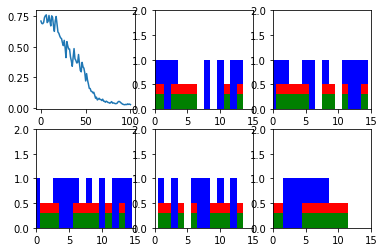

Step 200 Loss 0.0105676


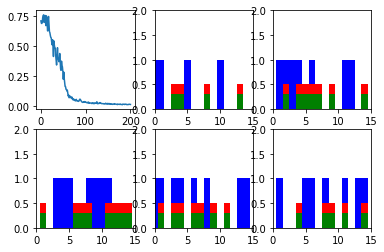

Step 300 Loss 0.00556993


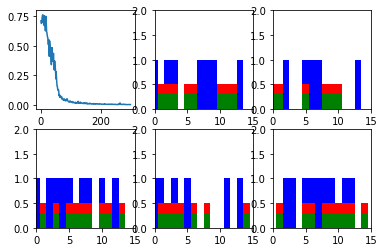

Step 400 Loss 0.00343323


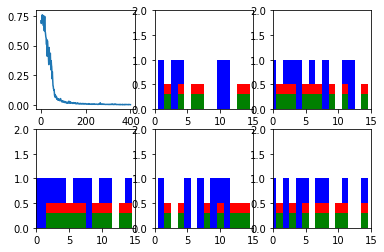

Step 500 Loss 0.0024661


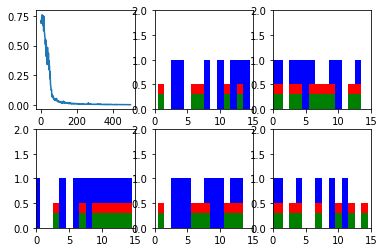

Step 600 Loss 0.00206632


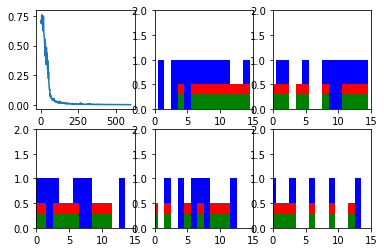

New data, epoch 1
Step 0 Loss 0.17739


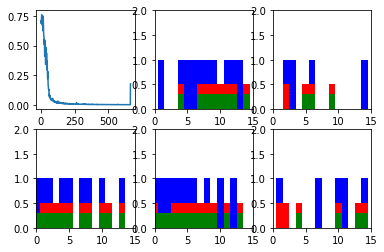

Step 100 Loss 0.00217825


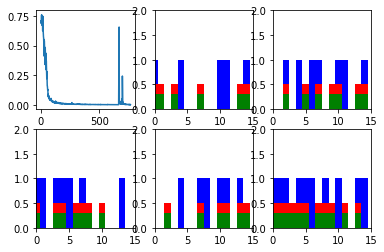

Step 200 Loss 0.00220288


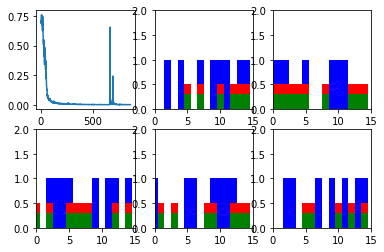

Step 300 Loss 0.00154094


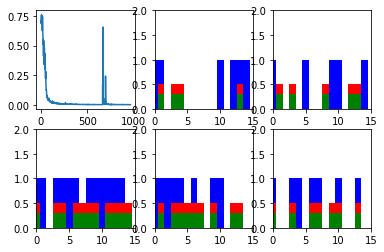

Step 400 Loss 0.00138125


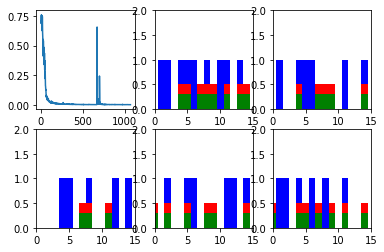

Step 500 Loss 0.00188187


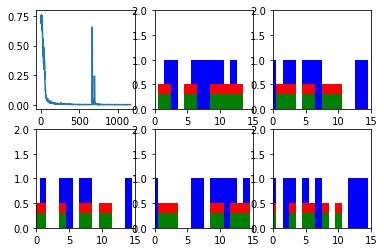

Step 600 Loss 0.00116608


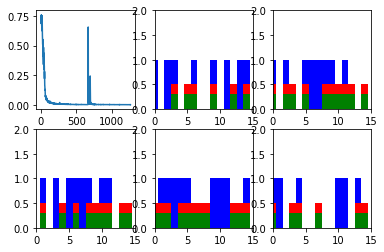

New data, epoch 2
Step 0 Loss 0.224515


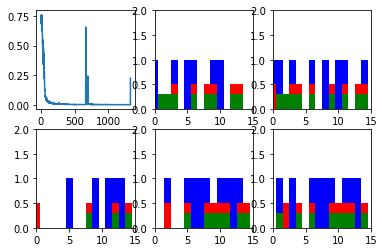

Step 100 Loss 0.00115137


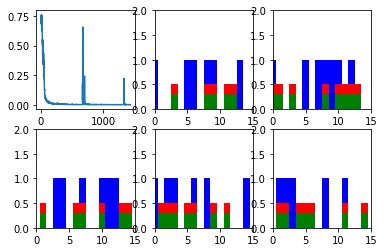

Step 200 Loss 0.000907393


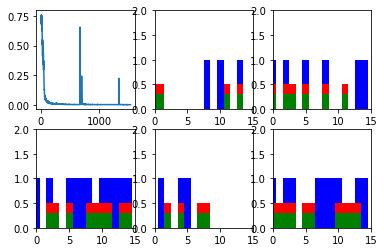

Step 300 Loss 0.000886226


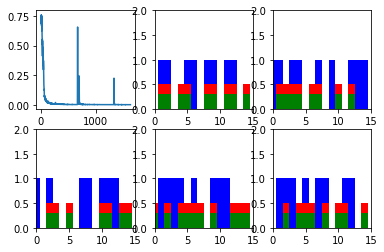

Step 400 Loss 0.000881543


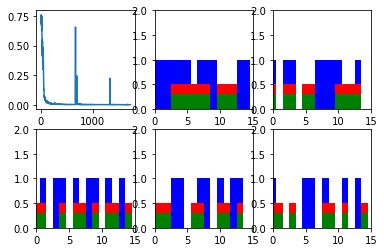

Step 500 Loss 0.000741905


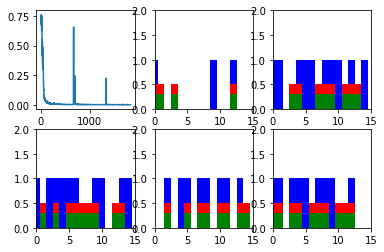

Step 600 Loss 0.000629431


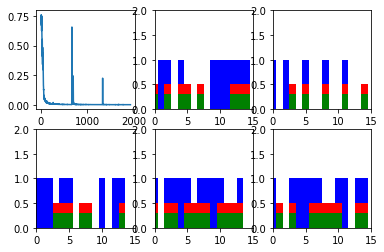

New data, epoch 3
Step 0 Loss 0.205948


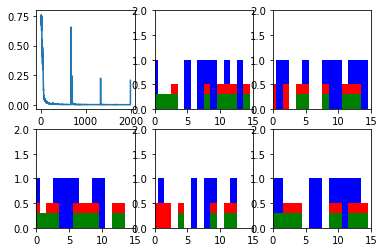

Step 100 Loss 0.000661803


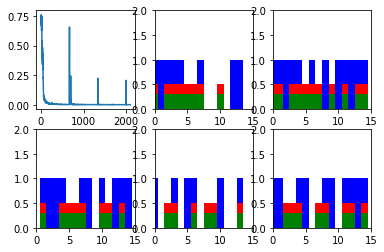

Step 200 Loss 0.000694012


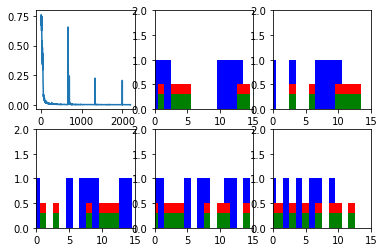

Step 300 Loss 0.000526675


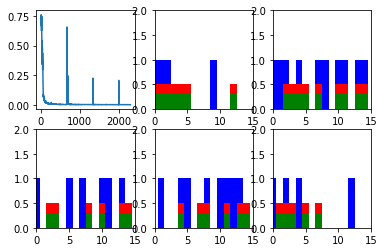

Step 400 Loss 0.000667811


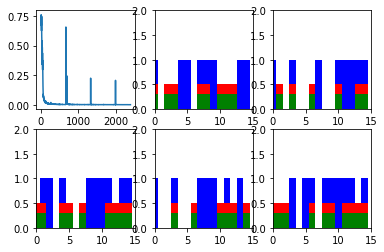

Step 500 Loss 0.000555115


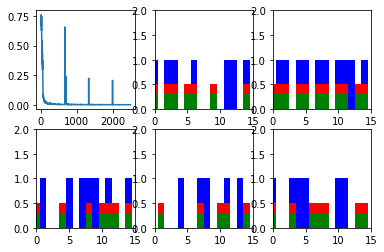

Step 600 Loss 0.00049506


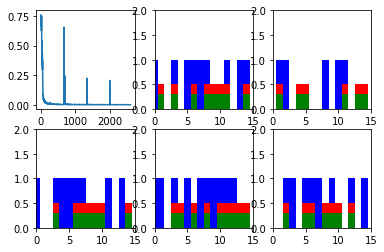

New data, epoch 4
Step 0 Loss 0.188948


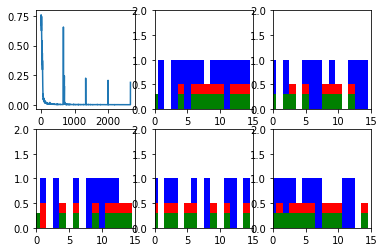

Step 100 Loss 0.0015368


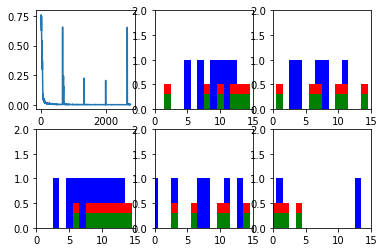

Step 200 Loss 0.00122428


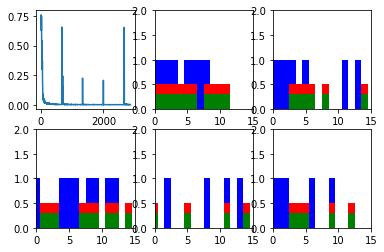

Step 300 Loss 0.00079251


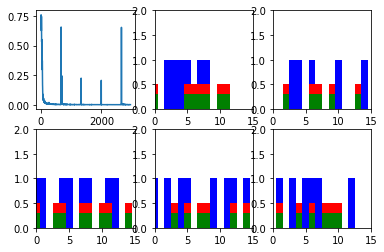

Step 400 Loss 0.000546217


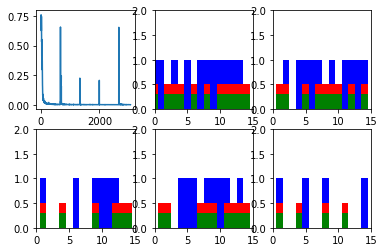

Step 500 Loss 0.000594223


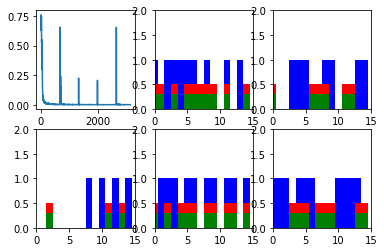

Step 600 Loss 0.000731367


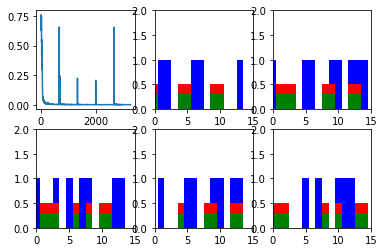

W  =  [[-0.15377016  0.03749551  0.14381976  1.29392457]
 [ 1.58661354 -0.92817008  0.05483262  0.19706956]
 [ 2.7511189  -1.03878939  0.42650431  0.40535229]
 [ 0.44442227  1.43816674 -0.3015621   0.05843608]
 [ 0.05874359  0.05732203  1.21631289 -0.07578219]]

b  =  [[ 0.05440553 -0.05263999 -0.09992398 -0.54225677]]


W2 =  [[-3.33142185  4.29295492]
 [ 2.82968831 -1.75492752]
 [ 0.23598158  1.10546446]
 [-0.07930482  0.90935367]]

b2 =  [[ 0.01019464 -0.01019302]]


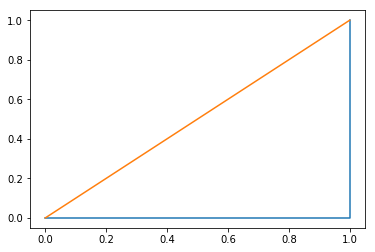

In [7]:
num_epochs = 5
total_series_length = 50000
truncated_backprop_length = 15
state_size = 4
num_classes = 2
echo_step = 3
batch_size = 5
num_batches = total_series_length//batch_size//truncated_backprop_length

def generateData():
    x = np.array(np.random.choice(2, total_series_length, p=[0.5, 0.5]))
    y = np.roll(x, echo_step)
    y[0:echo_step] = 0

    x = x.reshape((batch_size, -1))  # The first index changing slowest, subseries as rows
    y = y.reshape((batch_size, -1))

    return (x, y)

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.int32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
current_state = init_state
states_series = []
for current_input in inputs_series:
    current_input = tf.reshape(current_input, [batch_size, 1])
    input_and_state_concatenated = tf.concat([current_input, current_state], 1)  # Increasing number of columns

    next_state = tf.tanh(tf.matmul(input_and_state_concatenated, W) + b)  # Broadcasted addition
    states_series.append(next_state)
    current_state = next_state

logits_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits, labels=labels) for logits, labels in zip(logits_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdagradOptimizer(0.3).minimize(total_loss)

def plot(loss_list, predictions_series, batchX, batchY):
    plt.subplot(2, 3, 1)
    plt.cla()
    plt.plot(loss_list)

    for batch_series_idx in range(5):
        one_hot_output_series = np.array(predictions_series)[:, batch_series_idx, :]
        single_output_series = np.array([(1 if out[0] < 0.5 else 0) for out in one_hot_output_series])

        plt.subplot(2, 3, batch_series_idx + 2)
        plt.cla()
        plt.axis([0, truncated_backprop_length, 0, 2])
        left_offset = range(truncated_backprop_length)
        plt.bar(left_offset, batchX[batch_series_idx, :], width=1, color="blue")
        plt.bar(left_offset, batchY[batch_series_idx, :] * 0.5, width=1, color="red")
        plt.bar(left_offset, single_output_series * 0.3, width=1, color="green")

    plt.draw()
    plt.pause(0.0001)


with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData()
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx)

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x[:,start_idx:end_idx]
            batchY = y[:,start_idx:end_idx]

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if batch_idx%100 == 0:
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)
    
    print("=====================")
    print("W  = ", W.eval())
    print("")
    print("b  = ", b.eval())
    print("")
    print("=====================")
    print("")
    print("W2 = ", W2.eval())
    print("")
    print("b2 = ", b2.eval())
    print("=====================")
    fpr, tpr, threshs = roc_curve(batchY[-1, :], np.array(_predictions_series)[:, -1, 0])
    plt.plot(fpr, tpr)
    plt.plot([0,1],[0,1])

plt.ioff()
plt.show()


In [9]:
threshs

array([  1.99975038e+00,   9.99750316e-01,   9.98384714e-01,
         1.56381473e-04], dtype=float32)

In [10]:
tpr, fpr

(array([ 0.,  0.,  0.,  1.]),
 array([ 0.        ,  0.14285714,  1.        ,  1.        ]))

New data, epoch 0
Step 0 Loss 0.833186


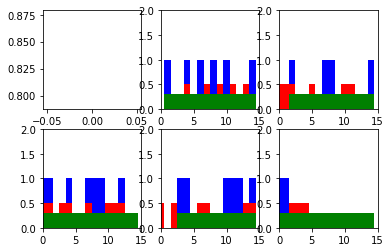

Step 100 Loss 0.698736


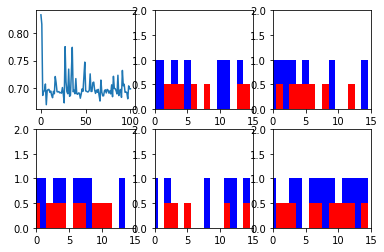

Step 200 Loss 0.690476


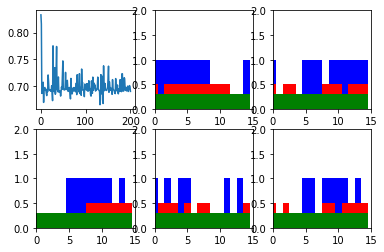

Step 300 Loss 0.693395


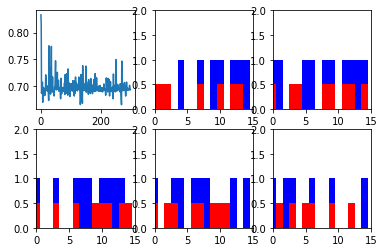

Step 400 Loss 0.696019


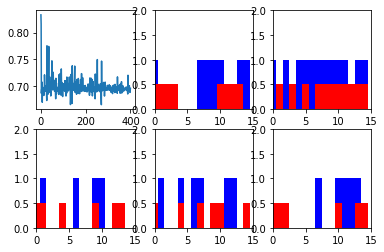

Step 500 Loss 0.697225


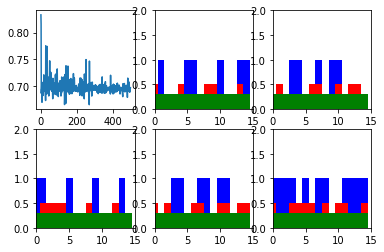

Step 600 Loss 0.692874


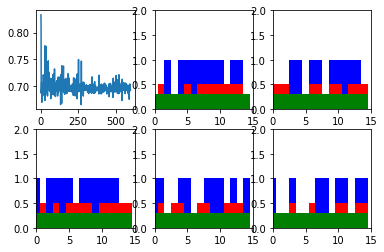

New data, epoch 1
Step 0 Loss 0.695552


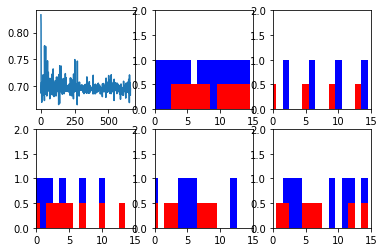

Step 100 Loss 0.688878


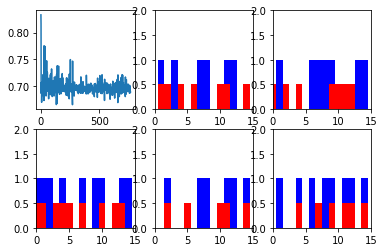

Step 200 Loss 0.692674


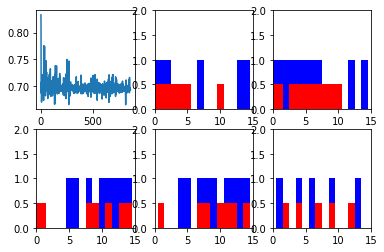

Step 300 Loss 0.695285


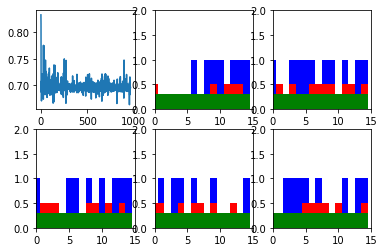

Step 400 Loss 0.69307


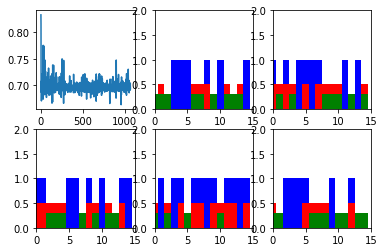

Step 500 Loss 0.693909


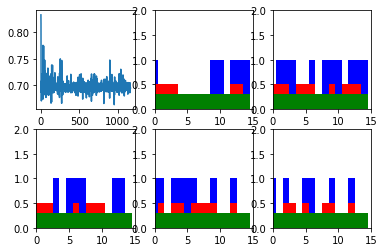

Step 600 Loss 0.694046


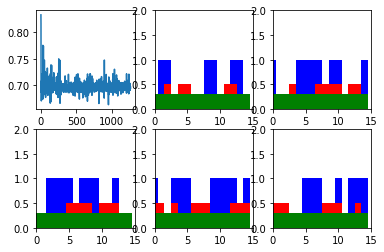

New data, epoch 2
Step 0 Loss 0.686952


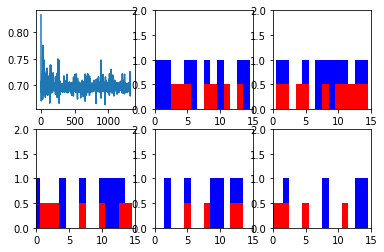

Step 100 Loss 0.694237


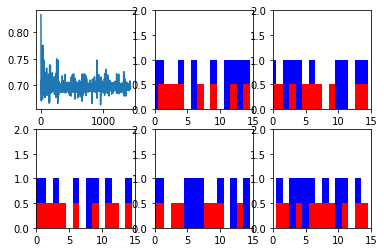

Step 200 Loss 0.68908


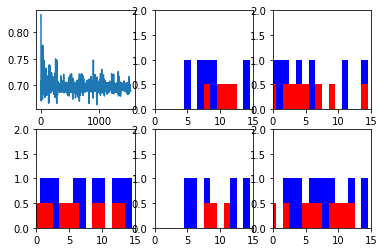

Step 300 Loss 0.693093


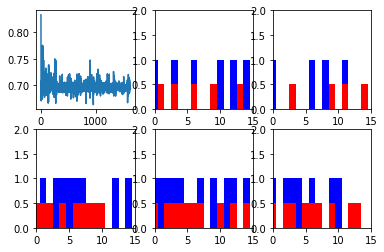

Step 400 Loss 0.693043


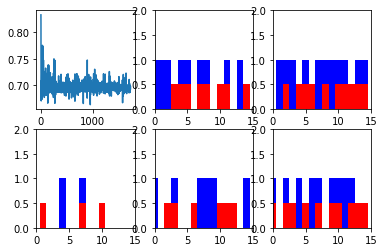

Step 500 Loss 0.691284


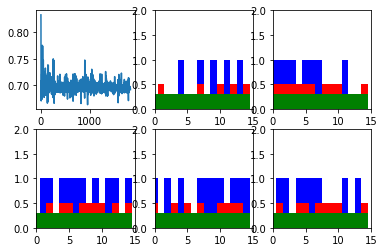

Step 600 Loss 0.696328


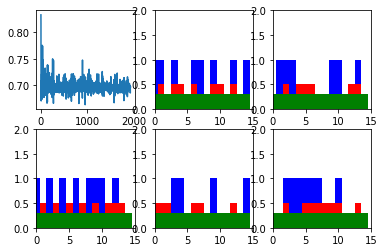

New data, epoch 3
Step 0 Loss 0.545995


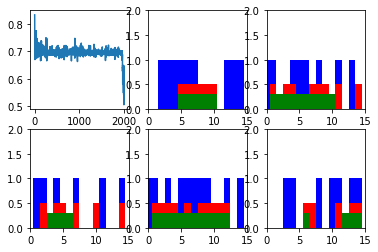

Step 100 Loss 0.391039


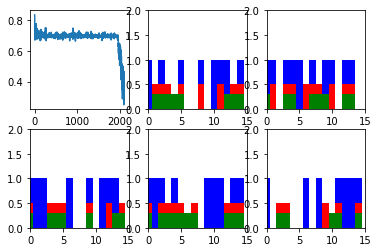

Step 200 Loss 0.055676


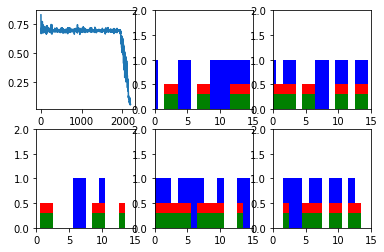

Step 300 Loss 0.0293658


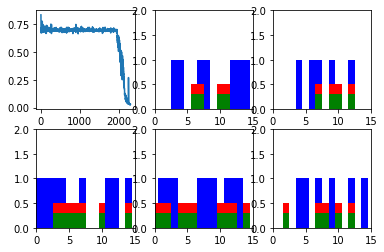

Step 400 Loss 0.0184639


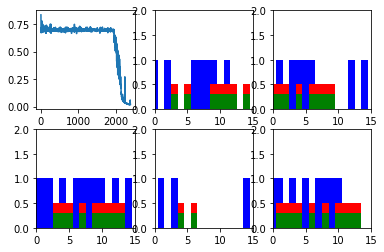

Step 500 Loss 0.0122102


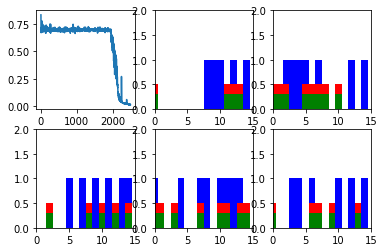

Step 600 Loss 0.00922285


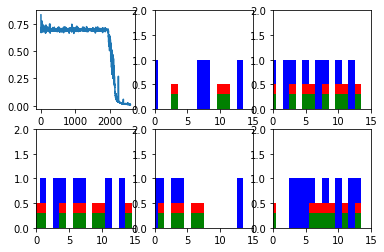

New data, epoch 4
Step 0 Loss 0.253117


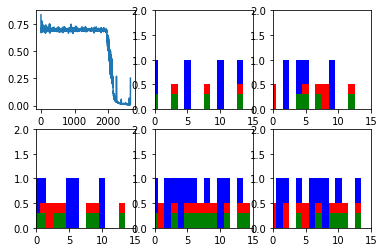

Step 100 Loss 0.00797259


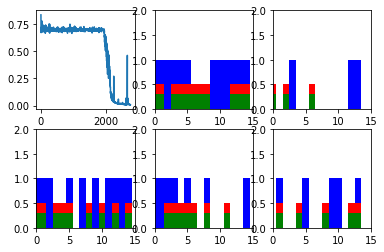

Step 200 Loss 0.00735836


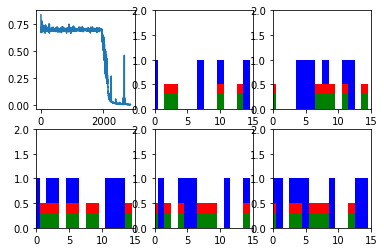

Step 300 Loss 0.00622508


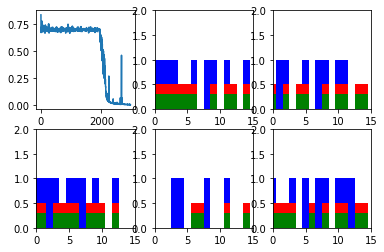

Step 400 Loss 0.00596645


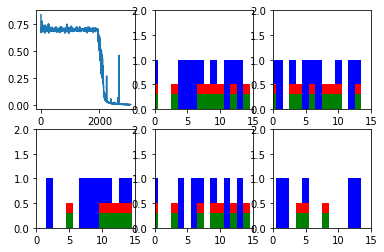

Step 500 Loss 0.00507437


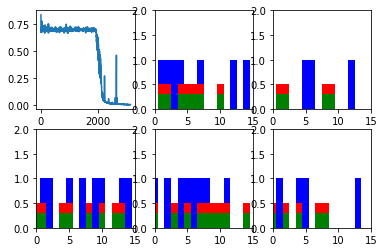

Step 600 Loss 0.00472048


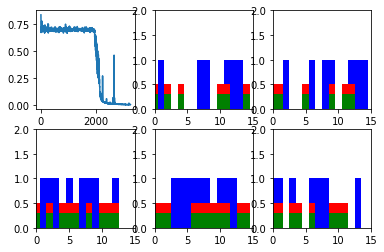

New data, epoch 5
Step 0 Loss 0.223027


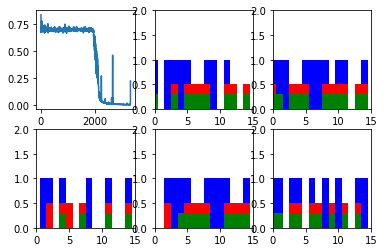

Step 100 Loss 0.00367397


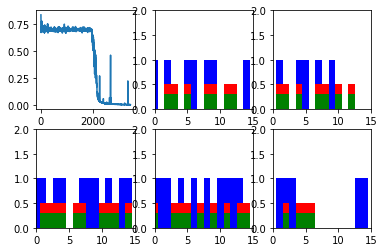

Step 200 Loss 0.00351665


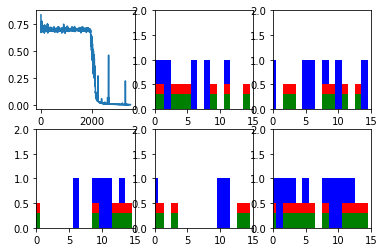

Step 300 Loss 0.00372528


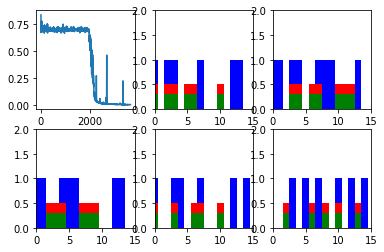

Step 400 Loss 0.00297721


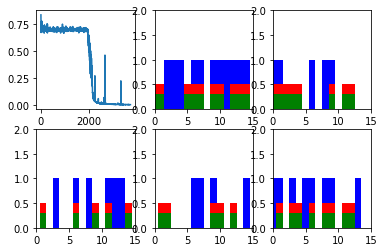

Step 500 Loss 0.00308435


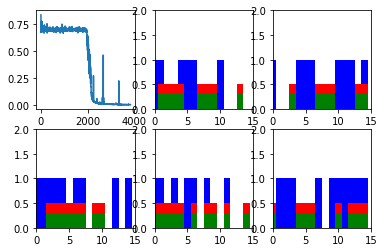

Step 600 Loss 0.00325436


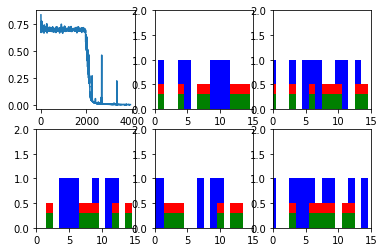

New data, epoch 6
Step 0 Loss 0.392334


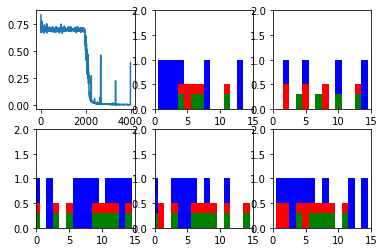

Step 100 Loss 0.00293372


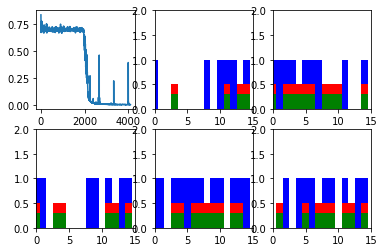

Step 200 Loss 0.00253871


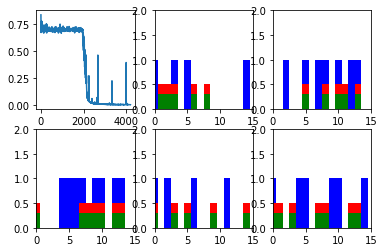

Step 300 Loss 0.00272455


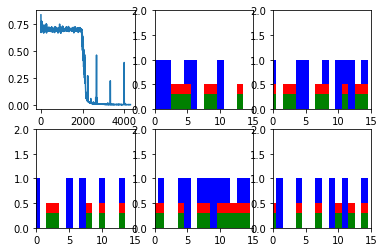

Step 400 Loss 0.00226463


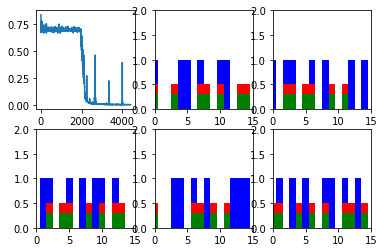

Step 500 Loss 0.002249


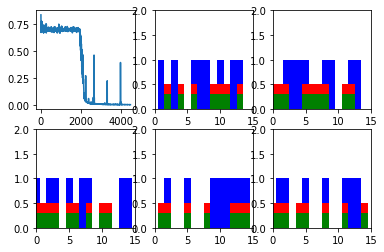

Step 600 Loss 0.00239082


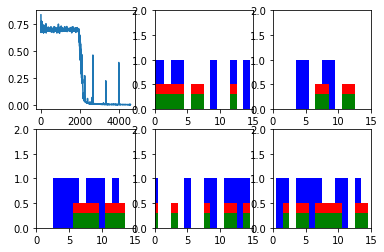

New data, epoch 7
Step 0 Loss 0.207349


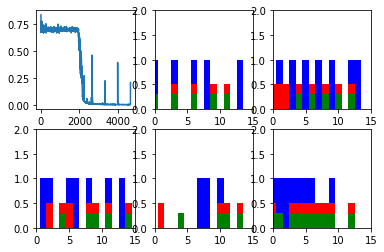

Step 100 Loss 0.00259612


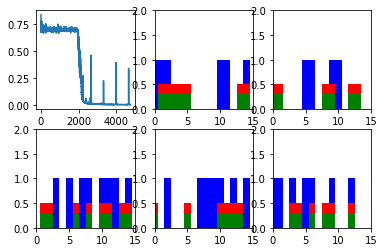

Step 200 Loss 0.00205334


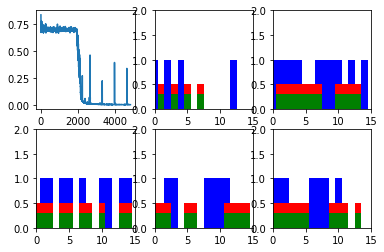

Step 300 Loss 0.00206077


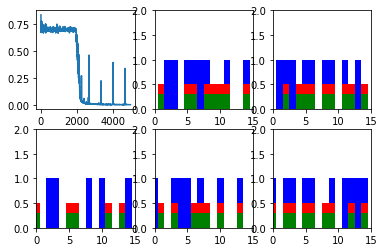

Step 400 Loss 0.00171516


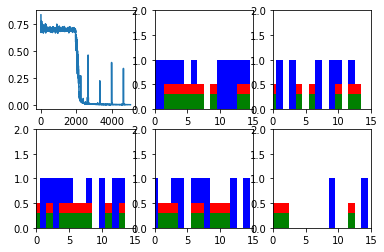

Step 500 Loss 0.00186041


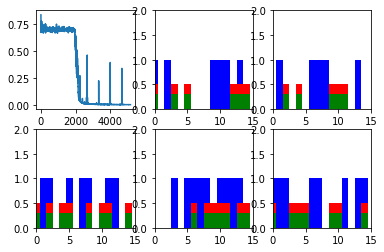

Step 600 Loss 0.00160512


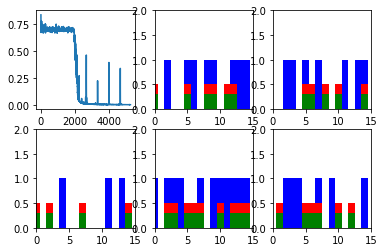

New data, epoch 8
Step 0 Loss 0.210279


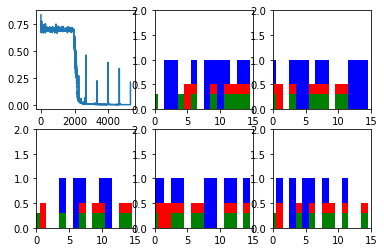

Step 100 Loss 0.00181164


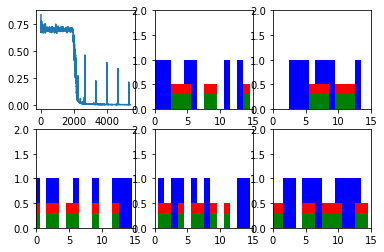

Step 200 Loss 0.00161816


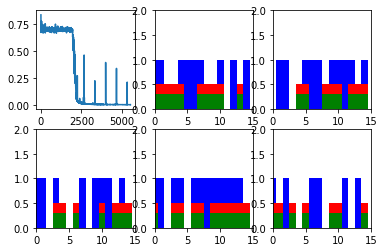

Step 300 Loss 0.00156301


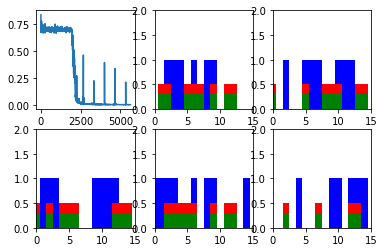

Step 400 Loss 0.00133344


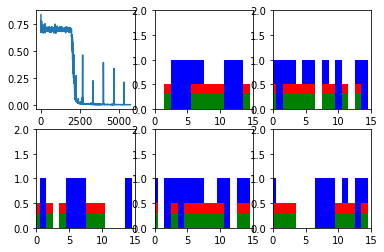

Step 500 Loss 0.00145607


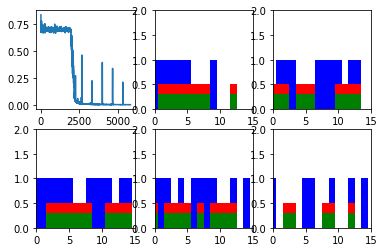

Step 600 Loss 0.00141694


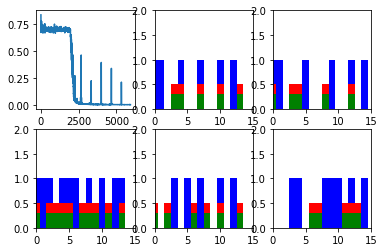

New data, epoch 9
Step 0 Loss 0.279209


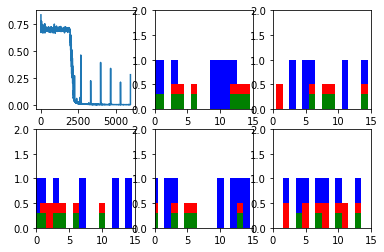

Step 100 Loss 0.00207083


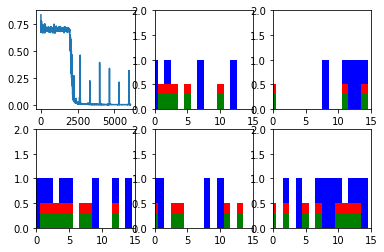

Step 200 Loss 0.00160738


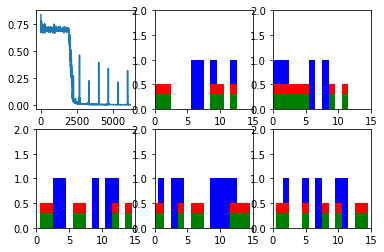

Step 300 Loss 0.00142098


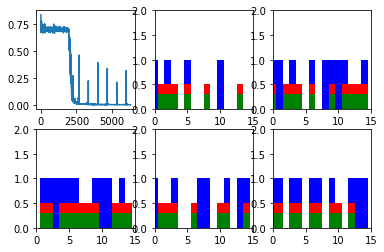

Step 400 Loss 0.00142407


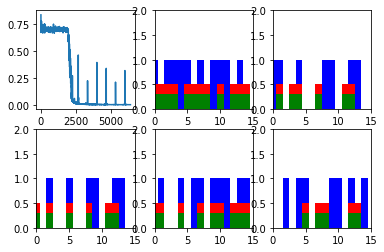

Step 500 Loss 0.00131081


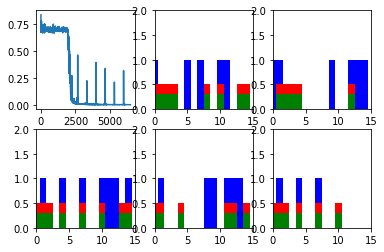

Step 600 Loss 0.00126607


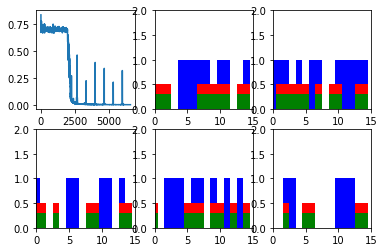

New data, epoch 10
Step 0 Loss 0.110424


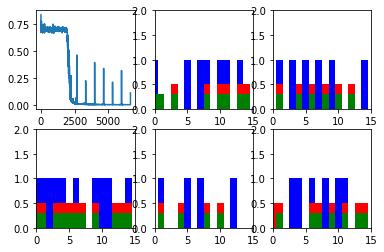

Step 100 Loss 0.00124108


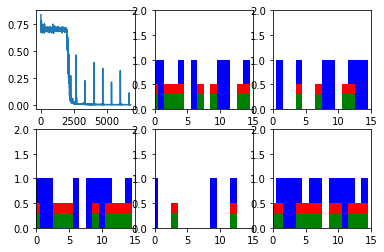

Step 200 Loss 0.00125167


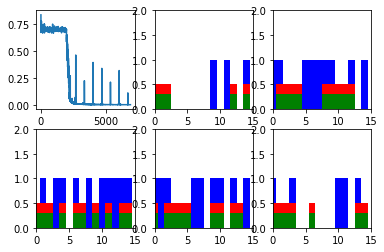

Step 300 Loss 0.000999939


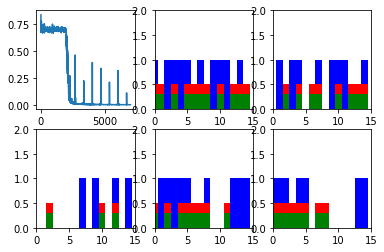

Step 400 Loss 0.000972863


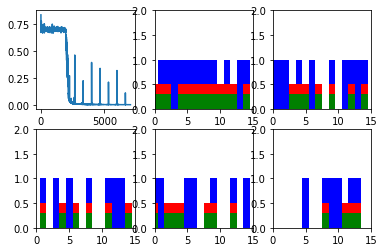

Step 500 Loss 0.00104158


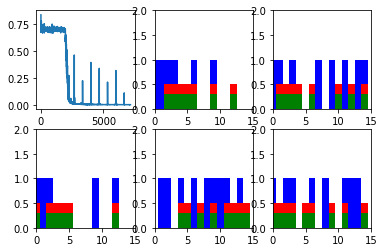

Step 600 Loss 0.00108863


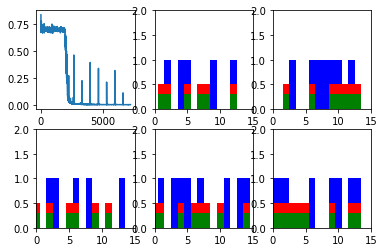

New data, epoch 11
Step 0 Loss 0.17288


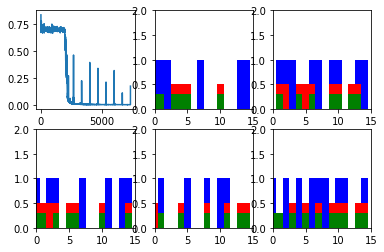

Step 100 Loss 0.000997083


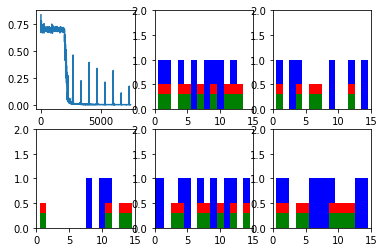

Step 200 Loss 0.000843853


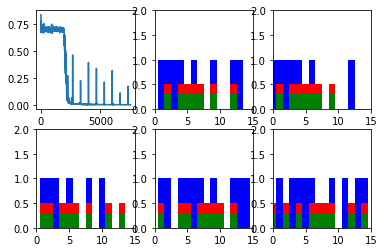

Step 300 Loss 0.00094897


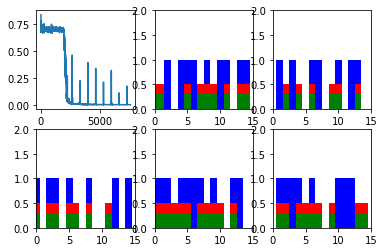

Step 400 Loss 0.000893846


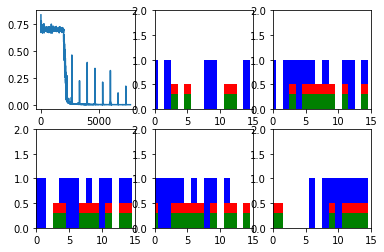

Step 500 Loss 0.000929097


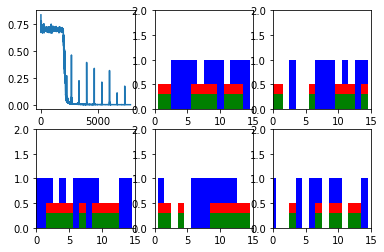

Step 600 Loss 0.000873176


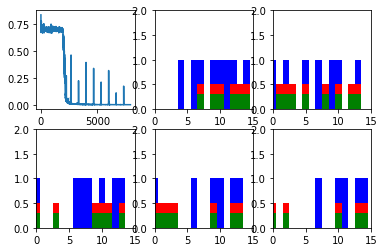

New data, epoch 12
Step 0 Loss 0.191607


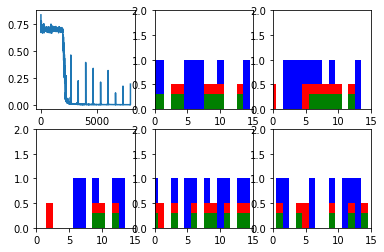

Step 100 Loss 0.00109863


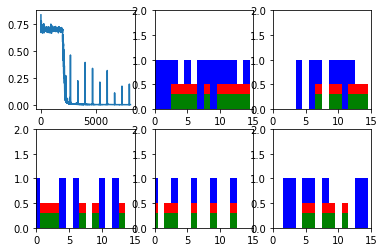

Step 200 Loss 0.000973744


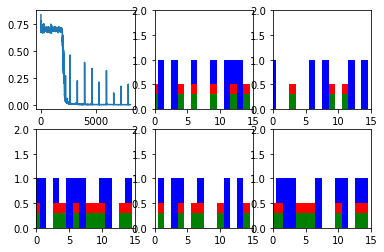

Step 300 Loss 0.000773879


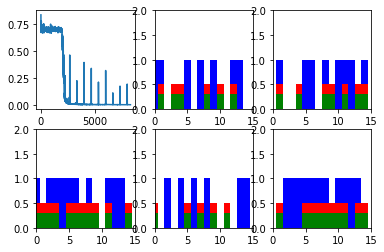

Step 400 Loss 0.000936053


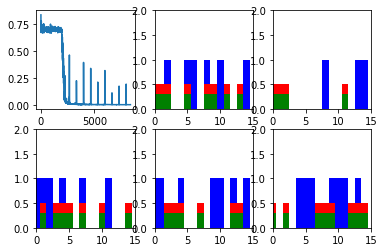

Step 500 Loss 0.000877519


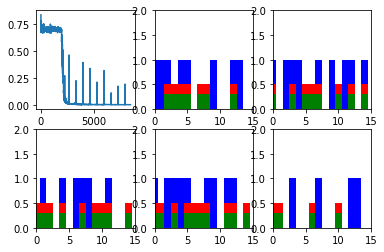

Step 600 Loss 0.000802637


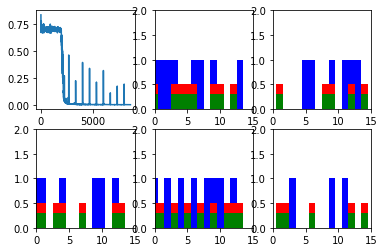

New data, epoch 13
Step 0 Loss 0.164364


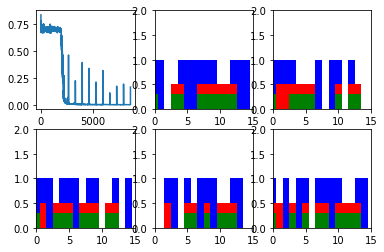

Step 100 Loss 0.000959283


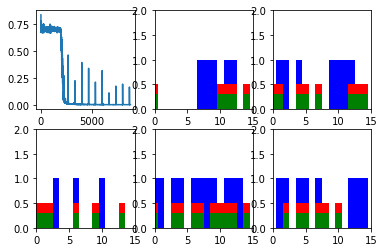

Step 200 Loss 0.000830652


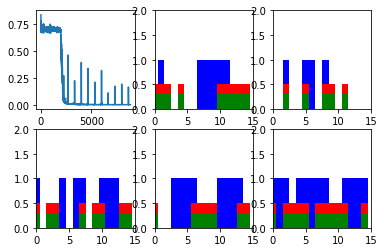

Step 300 Loss 0.000801114


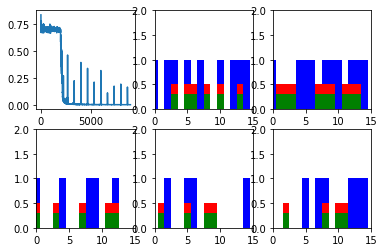

Step 400 Loss 0.000842678


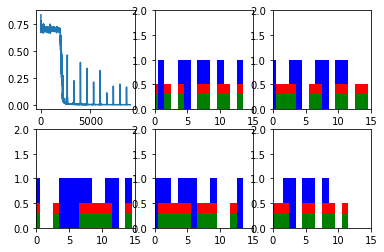

Step 500 Loss 0.000859659


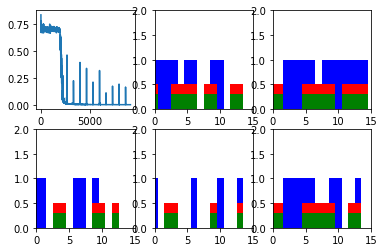

Step 600 Loss 0.000739185


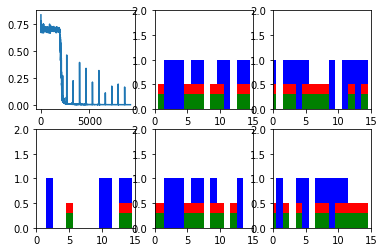

New data, epoch 14
Step 0 Loss 0.126494


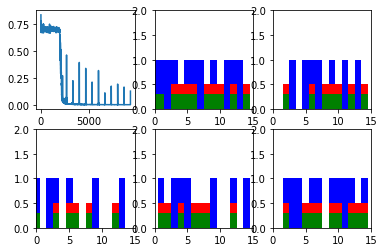

Step 100 Loss 0.000741062


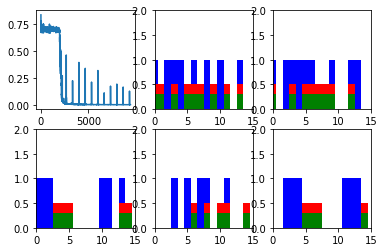

Step 200 Loss 0.000777115


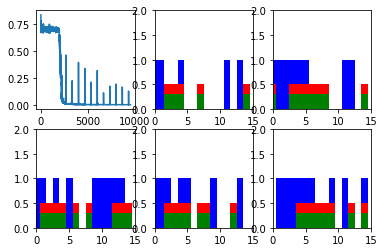

Step 300 Loss 0.000681101


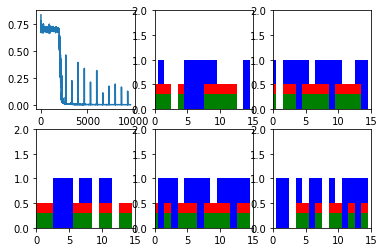

Step 400 Loss 0.000735982


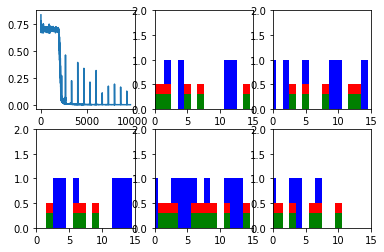

Step 500 Loss 0.000709457


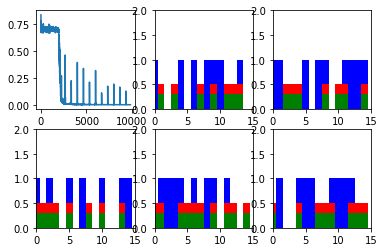

Step 600 Loss 0.000632596


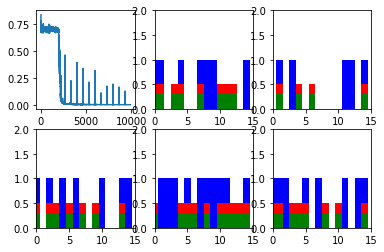

New data, epoch 15
Step 0 Loss 0.184813


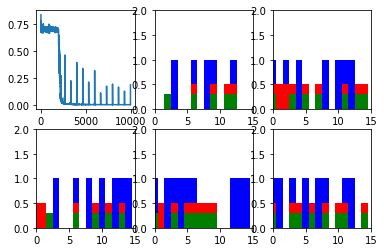

Step 100 Loss 0.000788565


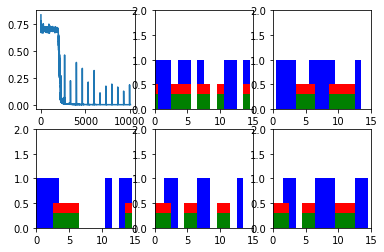

Step 200 Loss 0.00059176


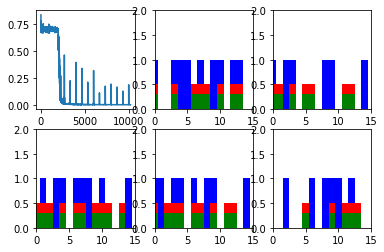

Step 300 Loss 0.000670183


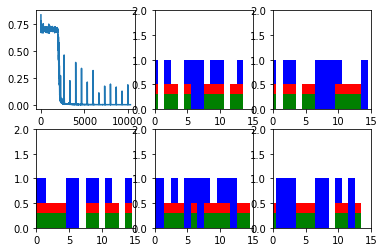

Step 400 Loss 0.000612567


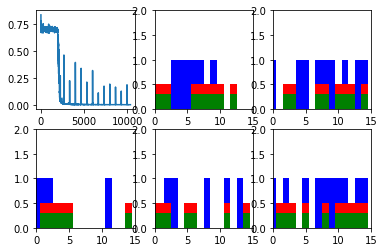

Step 500 Loss 0.000614289


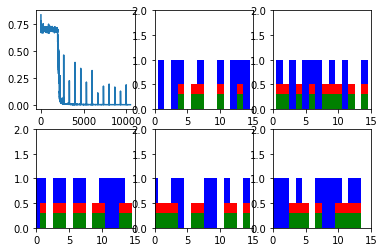

Step 600 Loss 0.000570961


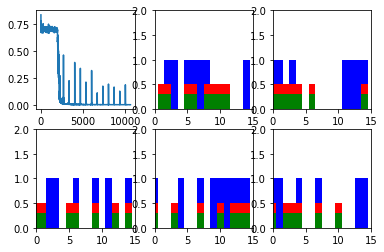

New data, epoch 16
Step 0 Loss 0.182258


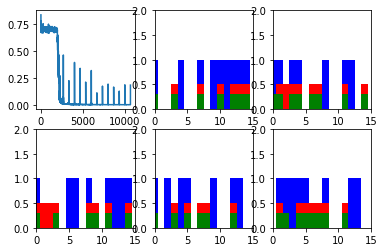

Step 100 Loss 0.000644679


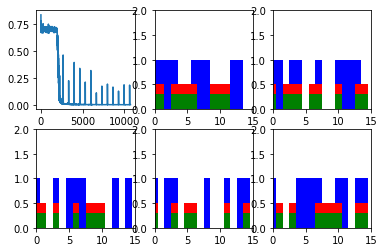

Step 200 Loss 0.000581479


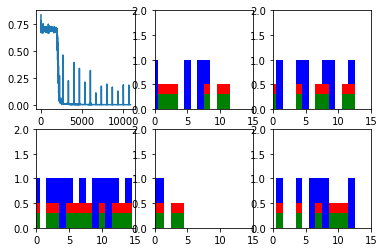

Step 300 Loss 0.000528391


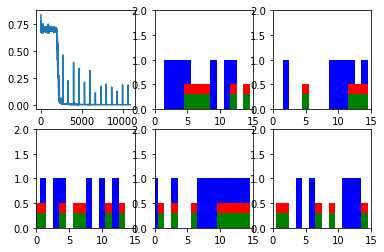

Step 400 Loss 0.00057411


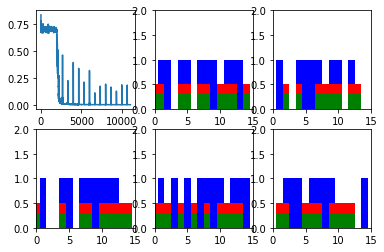

Step 500 Loss 0.000558224


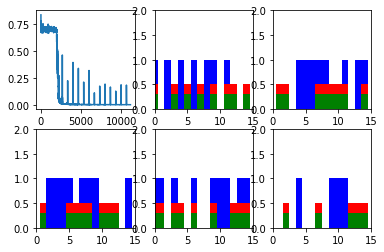

Step 600 Loss 0.000550278


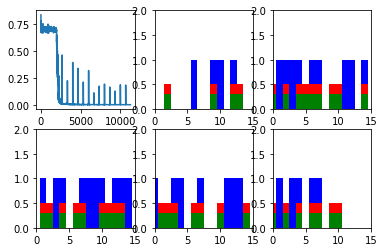

New data, epoch 17
Step 0 Loss 0.149928


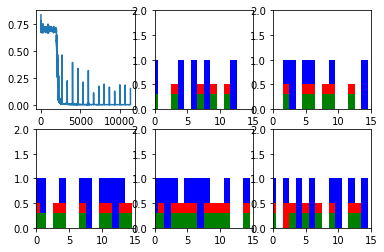

Step 100 Loss 0.000624864


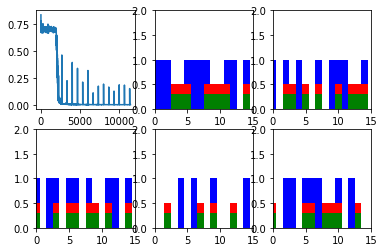

Step 200 Loss 0.000596547


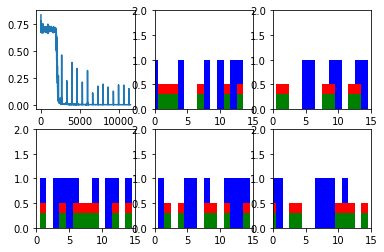

Step 300 Loss 0.000552058


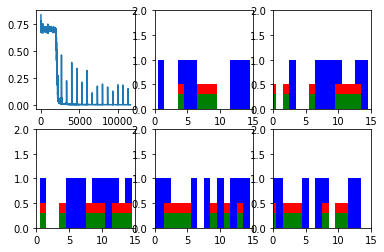

Step 400 Loss 0.000489434


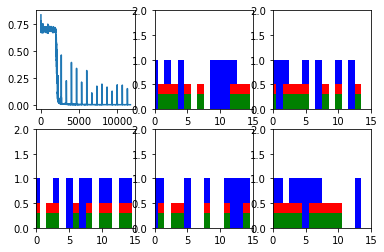

Step 500 Loss 0.000528982


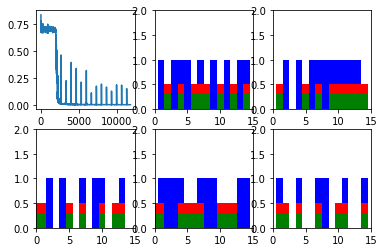

Step 600 Loss 0.000498479


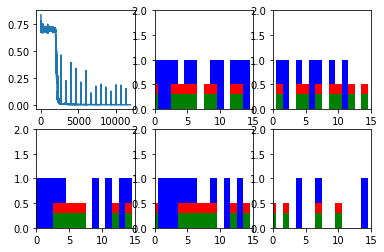

New data, epoch 18
Step 0 Loss 0.183194


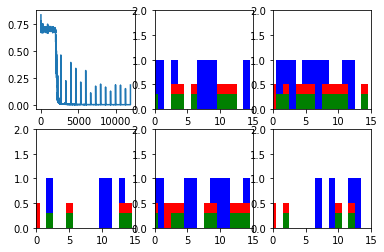

Step 100 Loss 0.000551609


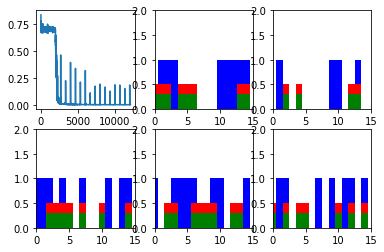

Step 200 Loss 0.000498068


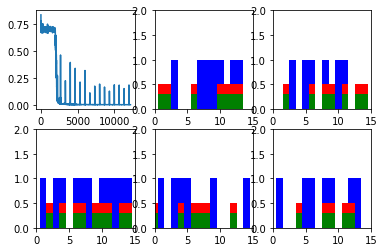

Step 300 Loss 0.000479884


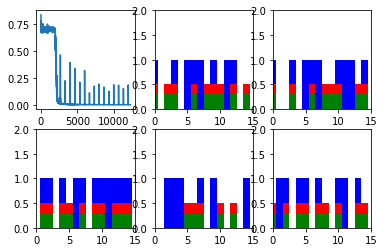

Step 400 Loss 0.000436374


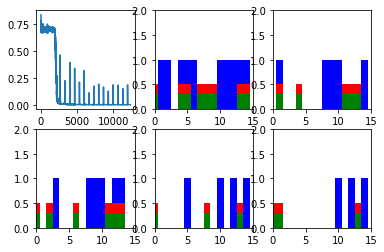

Step 500 Loss 0.000472006


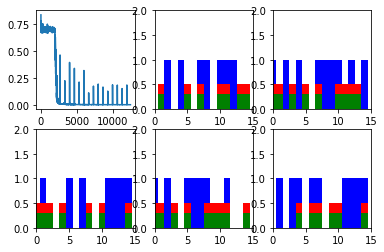

Step 600 Loss 0.000484818


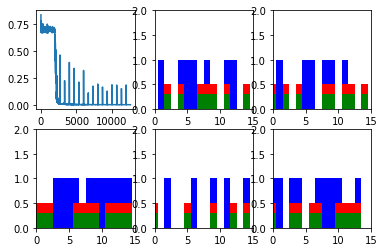

New data, epoch 19
Step 0 Loss 0.229335


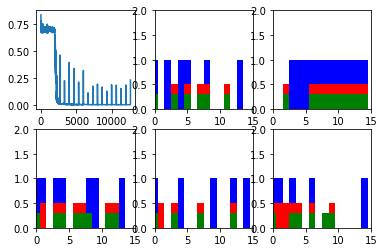

Step 100 Loss 0.0014718


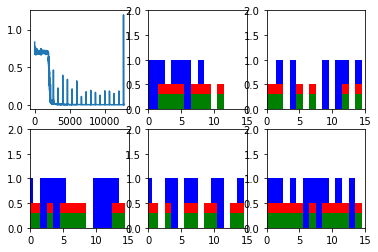

Step 200 Loss 0.000979593


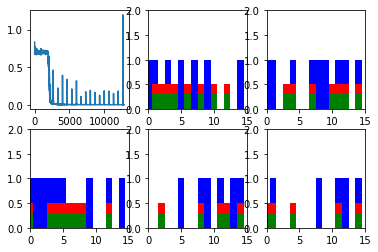

Step 300 Loss 0.000811323


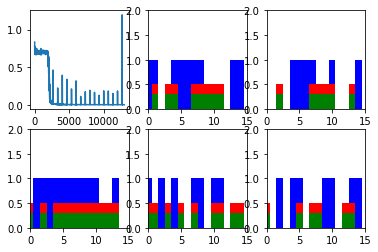

Step 400 Loss 0.000756875


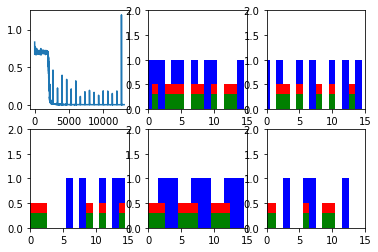

Step 500 Loss 0.000669792


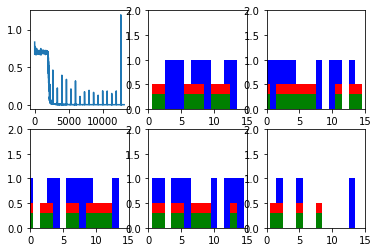

Step 600 Loss 0.000613379


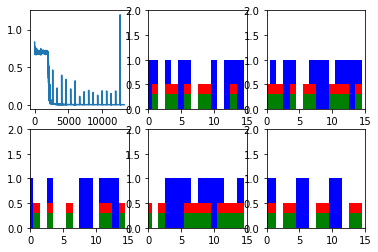

W  =  [[ 0.09504473  1.49712217 -0.01247695 -0.03867882]
 [ 1.18746006  0.05307867 -1.42957604  0.441513  ]
 [-0.53025573 -0.0825763  -0.08006115  0.9245041 ]
 [ 2.75533509  0.16863121 -1.58638287  0.97074956]
 [ 1.38768899  0.13603345  1.05152893  0.29289061]]

b  =  [[-0.00785969 -0.69826752  0.03285271 -0.0256467 ]]


W2 =  [[-2.76589131  4.14337969]
 [ 0.46960288  0.44546717]
 [ 2.29524064 -0.92805928]
 [-0.78689623  1.60006666]]

b2 =  [[-0.02714169  0.02714176]]


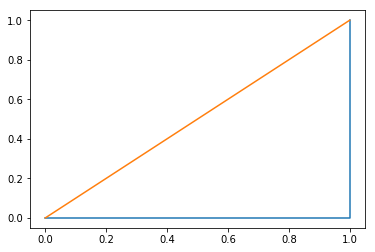

In [8]:
num_epochs = 20
total_series_length = 50000
truncated_backprop_length = 15
state_size = 4
num_classes = 2
echo_step = 3
batch_size = 5
num_batches = total_series_length//batch_size//truncated_backprop_length

def generateData():
    x = np.array(np.random.choice(2, total_series_length, p=[0.5, 0.5]))
    y = np.roll(x, echo_step)
    y[0:echo_step] = 0

    x = x.reshape((batch_size, -1))  # The first index changing slowest, subseries as rows
    y = y.reshape((batch_size, -1))

    return (x, y)

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.int32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
current_state = init_state
states_series = []
for current_input in inputs_series:
    current_input = tf.reshape(current_input, [batch_size, 1])
    input_and_state_concatenated = tf.concat([current_input, current_state], 1)  # Increasing number of columns

    next_state = tf.tanh(tf.matmul(input_and_state_concatenated, W) + b)  # Broadcasted addition
    states_series.append(next_state)
    current_state = next_state

logits_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits, labels=labels) for logits, labels in zip(logits_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdagradOptimizer(0.3).minimize(total_loss)

def plot(loss_list, predictions_series, batchX, batchY):
    plt.subplot(2, 3, 1)
    plt.cla()
    plt.plot(loss_list)

    for batch_series_idx in range(5):
        one_hot_output_series = np.array(predictions_series)[:, batch_series_idx, :]
        single_output_series = np.array([(1 if out[0] < 0.5 else 0) for out in one_hot_output_series])

        plt.subplot(2, 3, batch_series_idx + 2)
        plt.cla()
        plt.axis([0, truncated_backprop_length, 0, 2])
        left_offset = range(truncated_backprop_length)
        plt.bar(left_offset, batchX[batch_series_idx, :], width=1, color="blue")
        plt.bar(left_offset, batchY[batch_series_idx, :] * 0.5, width=1, color="red")
        plt.bar(left_offset, single_output_series * 0.3, width=1, color="green")

    plt.draw()
    plt.pause(0.0001)


with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData()
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx)

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x[:,start_idx:end_idx]
            batchY = y[:,start_idx:end_idx]

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if batch_idx%100 == 0:
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)
    
    print("=====================")
    print("W  = ", W.eval())
    print("")
    print("b  = ", b.eval())
    print("")
    print("=====================")
    print("")
    print("W2 = ", W2.eval())
    print("")
    print("b2 = ", b2.eval())
    print("=====================")
    fpr, tpr, threshs = roc_curve(batchY[-1, :], np.array(_predictions_series)[:, -1, 0])
    plt.plot(fpr, tpr)
    plt.plot([0,1],[0,1])

plt.ioff()
plt.show()


Instructions for updating:
Use `tf.global_variables_initializer` instead.


New data, epoch 0
Step 0 Loss 0.867981


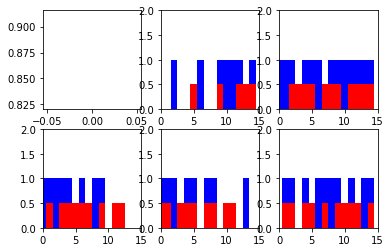

Step 100 Loss 0.706848


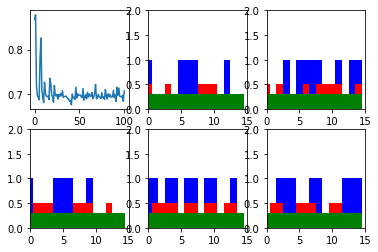

Step 200 Loss 0.688557


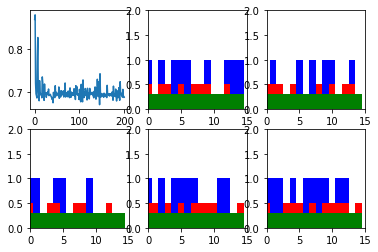

Step 300 Loss 0.703153


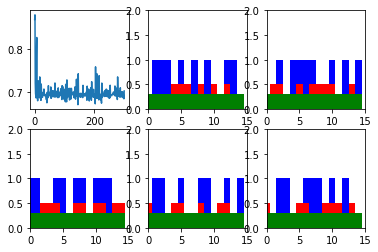

Step 400 Loss 0.690424


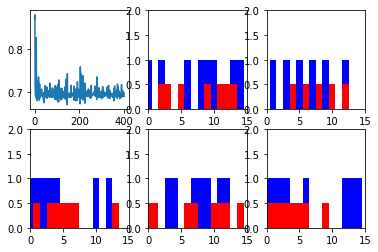

Step 500 Loss 0.689674


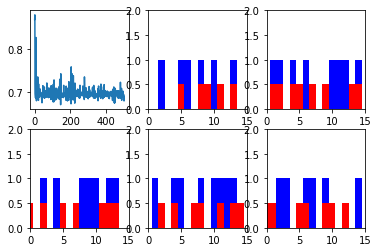

Step 600 Loss 0.692587


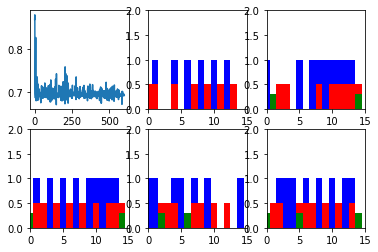

New data, epoch 1
Step 0 Loss 0.609871


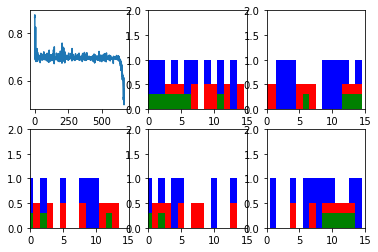

Step 100 Loss 0.258913


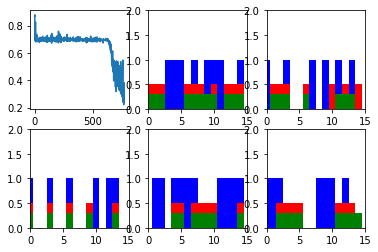

Step 200 Loss 0.0246718


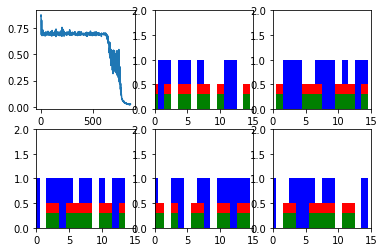

Step 300 Loss 0.0101092


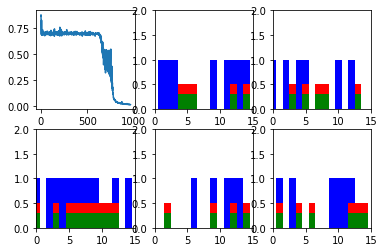

Step 400 Loss 0.0102735


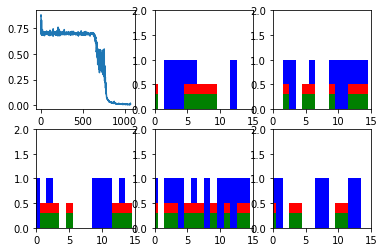

Step 500 Loss 0.030237


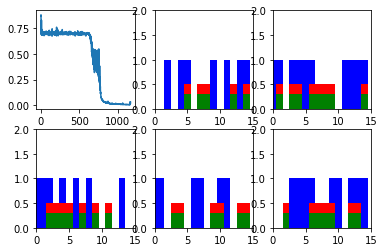

Step 600 Loss 0.00521955


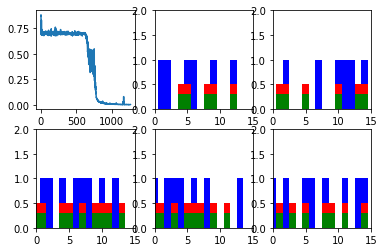

New data, epoch 2
Step 0 Loss 0.17967


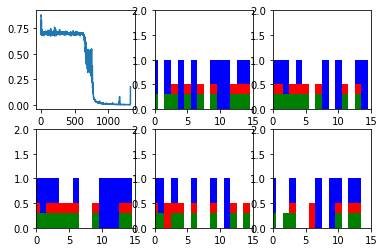

Step 100 Loss 0.00310408


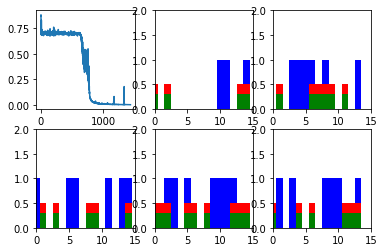

Step 200 Loss 0.0028789


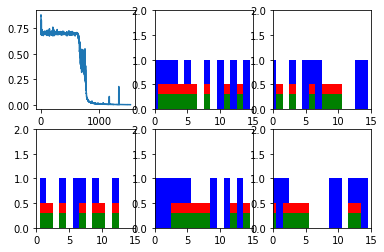

Step 300 Loss 0.00259902


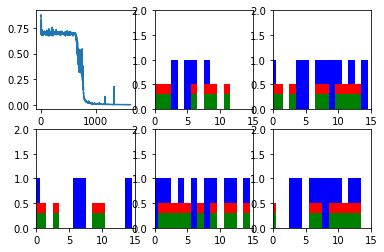

Step 400 Loss 0.00210937


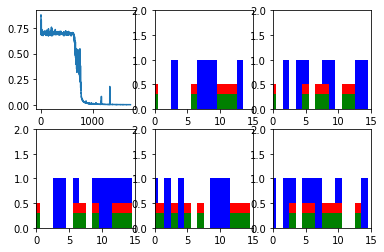

Step 500 Loss 0.00219229


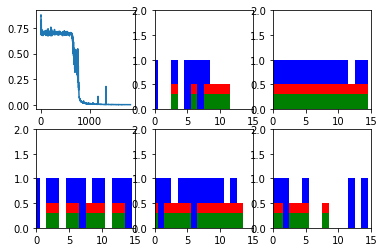

Step 600 Loss 0.00170286


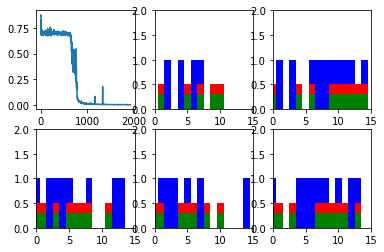

New data, epoch 3
Step 0 Loss 0.139923


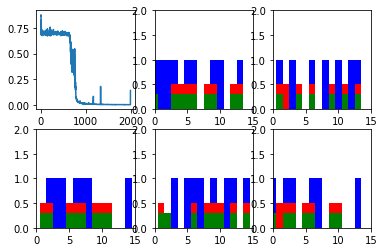

Step 100 Loss 0.00166959


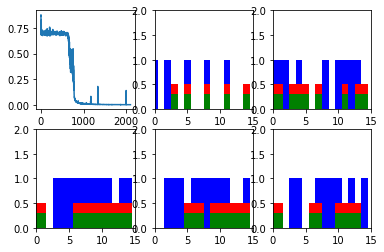

Step 200 Loss 0.00144829


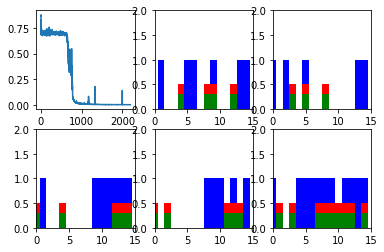

Step 300 Loss 0.00144581


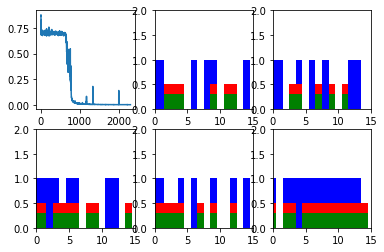

Step 400 Loss 0.00126126


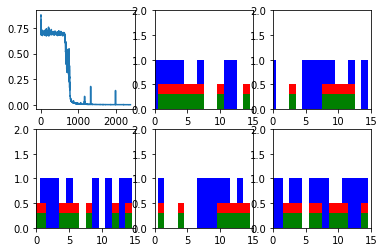

Step 500 Loss 0.00116274


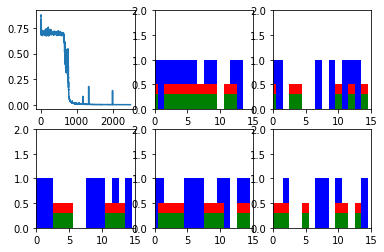

Step 600 Loss 0.0012041


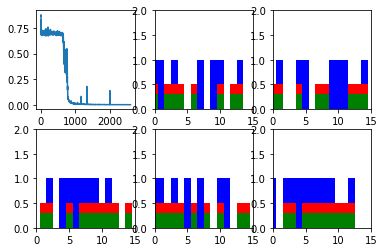

New data, epoch 4
Step 0 Loss 0.169893


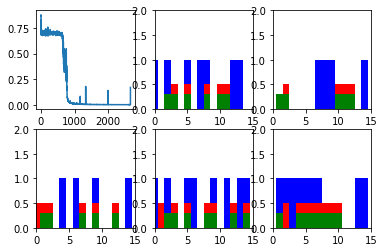

Step 100 Loss 0.00135744


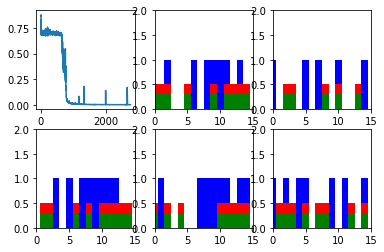

Step 200 Loss 0.0010806


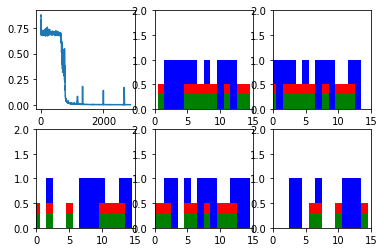

Step 300 Loss 0.00109412


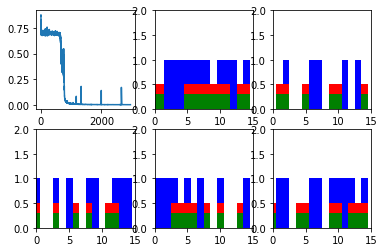

Step 400 Loss 0.0010888


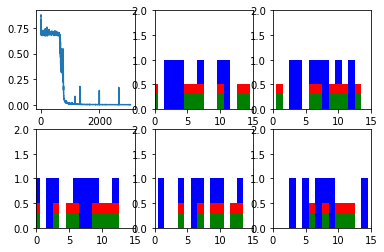

Step 500 Loss 0.00101047


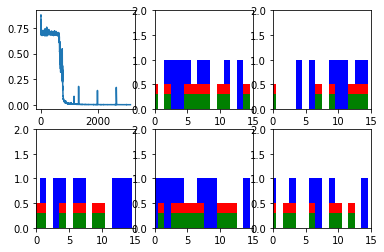

Step 600 Loss 0.000981901


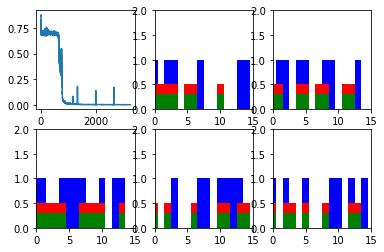

New data, epoch 5
Step 0 Loss 0.154444


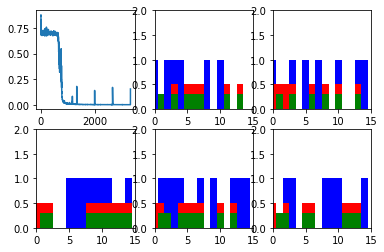

Step 100 Loss 0.000886192


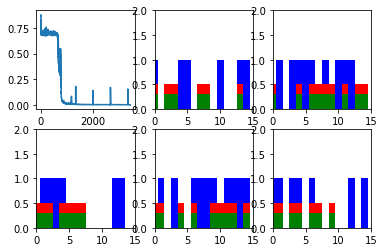

Step 200 Loss 0.000834088


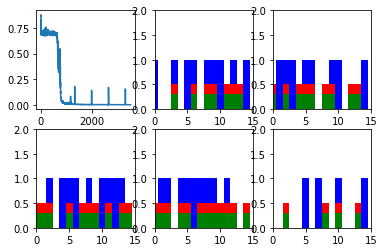

Step 300 Loss 0.000749544


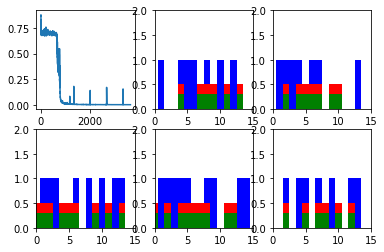

Step 400 Loss 0.000721782


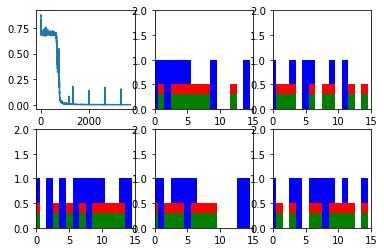

Step 500 Loss 0.000751511


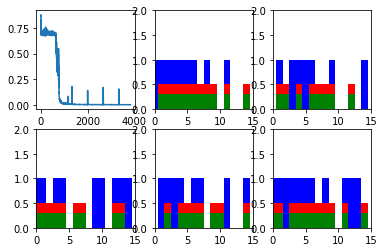

Step 600 Loss 0.000757063


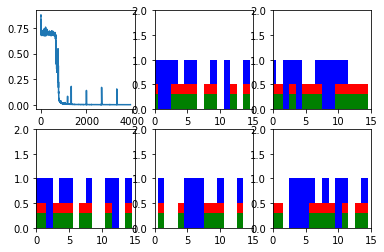

New data, epoch 6
Step 0 Loss 0.15994


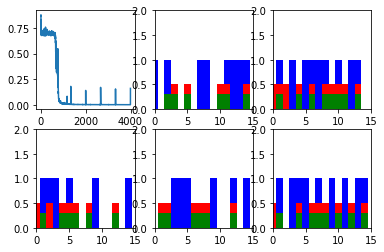

Step 100 Loss 0.000745565


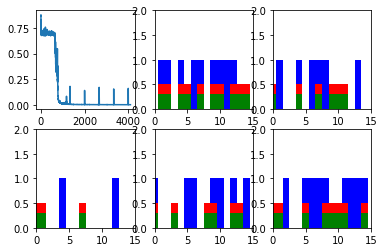

Step 200 Loss 0.000758633


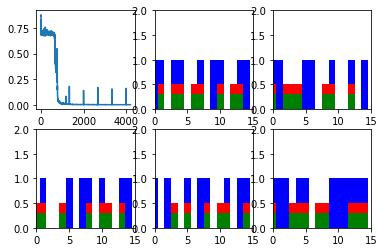

Step 300 Loss 0.000621063


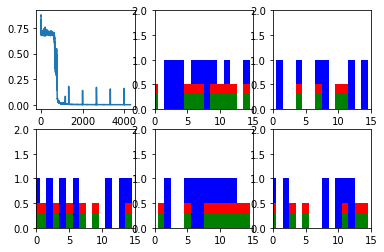

Step 400 Loss 0.000652684


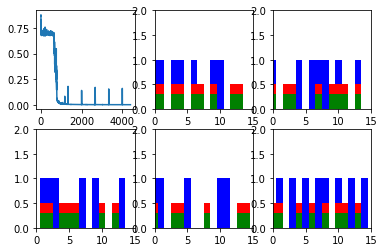

Step 500 Loss 0.000564616


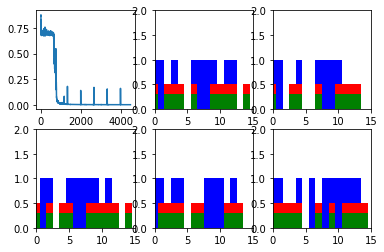

Step 600 Loss 0.000533138


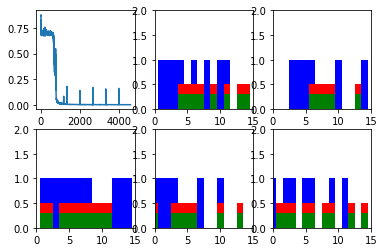

New data, epoch 7
Step 0 Loss 0.149486


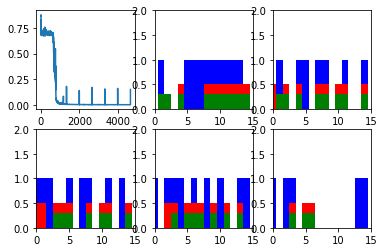

Step 100 Loss 0.000543614


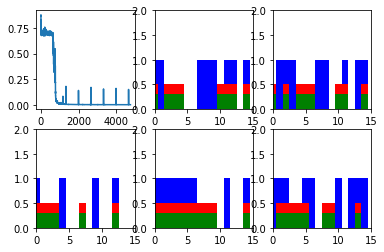

Step 200 Loss 0.000547385


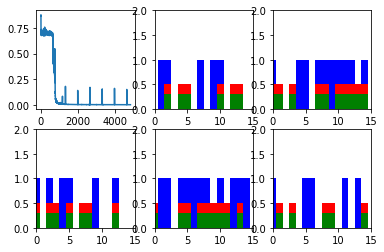

Step 300 Loss 0.000534667


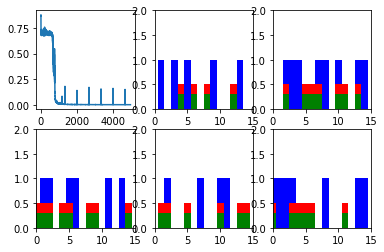

Step 400 Loss 0.000560728


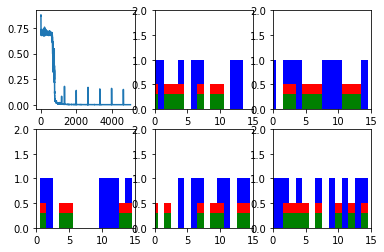

Step 500 Loss 0.000465948


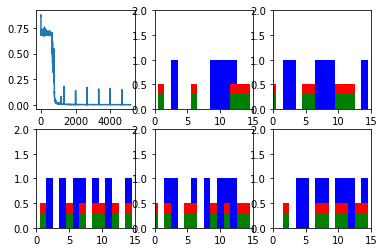

Step 600 Loss 0.000489475


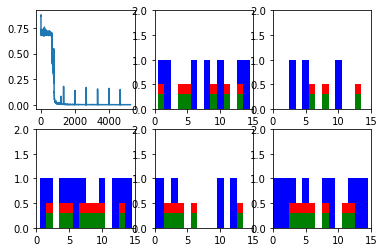

New data, epoch 8
Step 0 Loss 0.168088


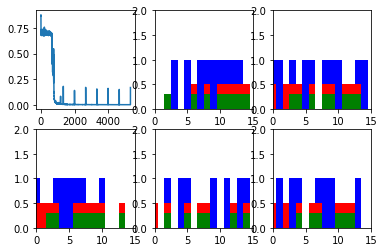

Step 100 Loss 0.000918615


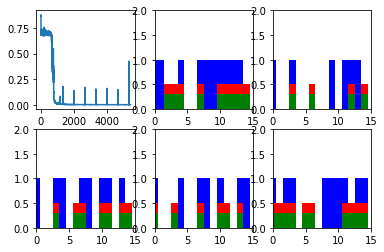

Step 200 Loss 0.000754642


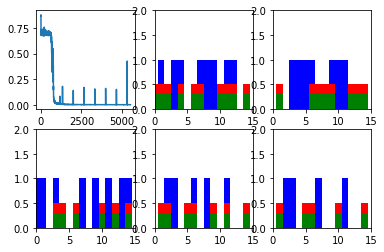

Step 300 Loss 0.000619534


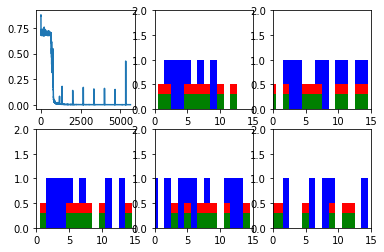

Step 400 Loss 0.000701597


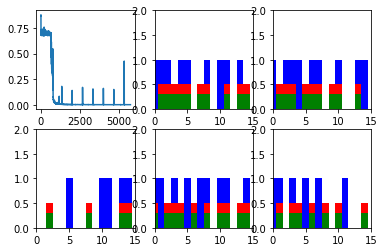

Step 500 Loss 0.00053147


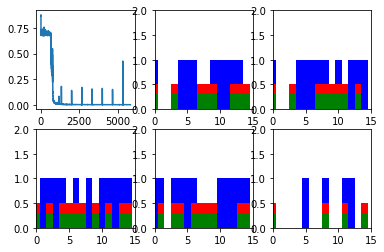

Step 600 Loss 0.00046148


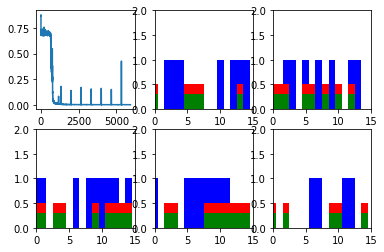

New data, epoch 9
Step 0 Loss 0.150916


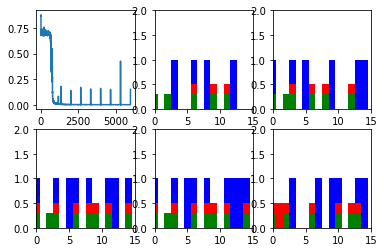

Step 100 Loss 0.000672636


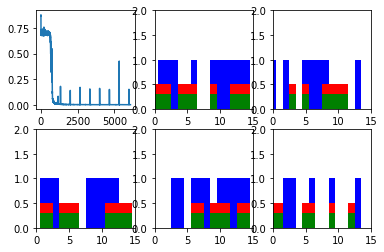

Step 200 Loss 0.000574011


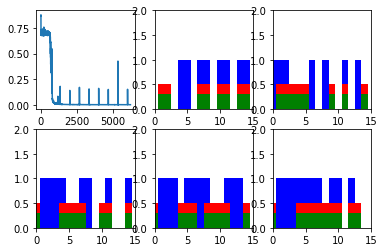

Step 300 Loss 0.000639989


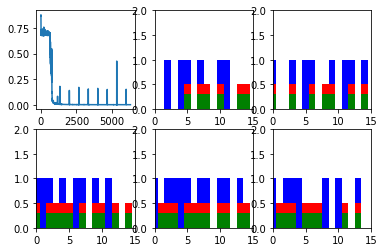

Step 400 Loss 0.0004378


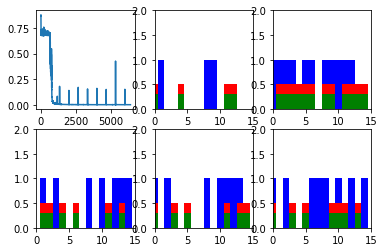

Step 500 Loss 0.000444476


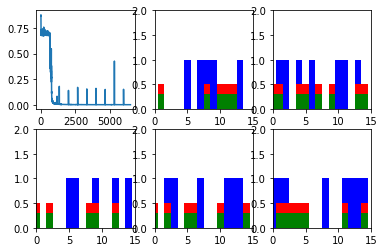

Step 600 Loss 0.00048394


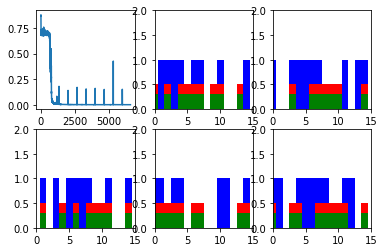

New data, epoch 10
Step 0 Loss 0.304048


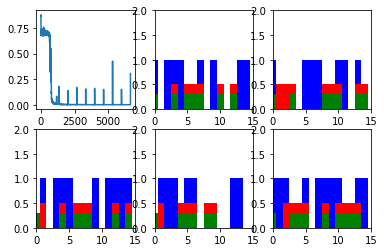

Step 100 Loss 0.000427078


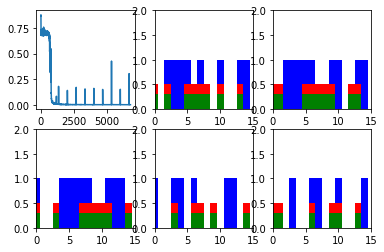

Step 200 Loss 0.00040881


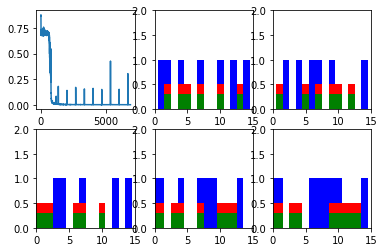

Step 300 Loss 0.000364546


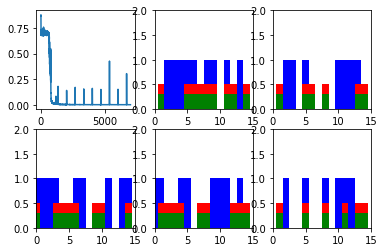

Step 400 Loss 0.000428935


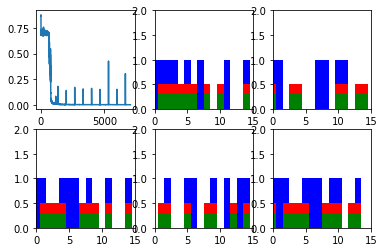

Step 500 Loss 0.000346921


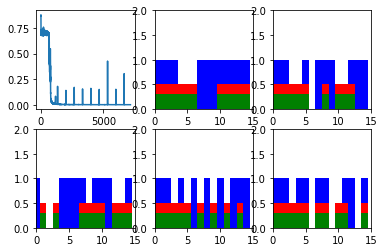

Step 600 Loss 0.00038918


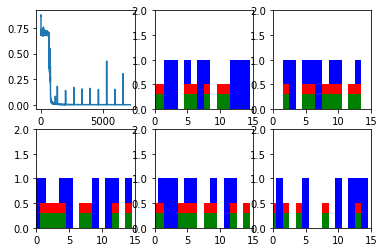

New data, epoch 11
Step 0 Loss 0.14601


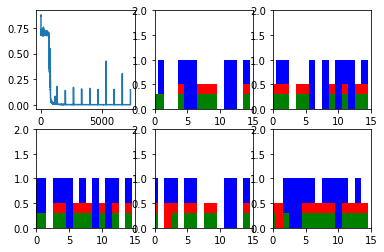

Step 100 Loss 0.000357059


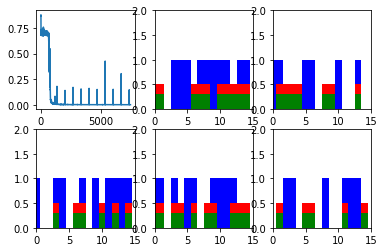

Step 200 Loss 0.000382881


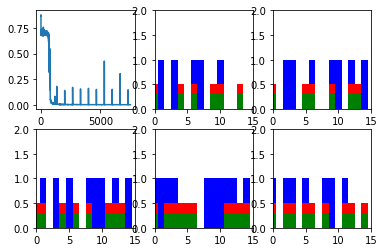

Step 300 Loss 0.000299142


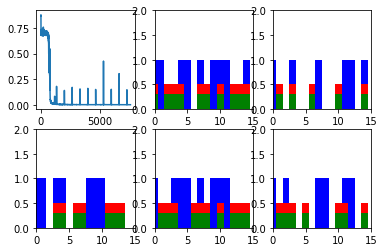

Step 400 Loss 0.000335503


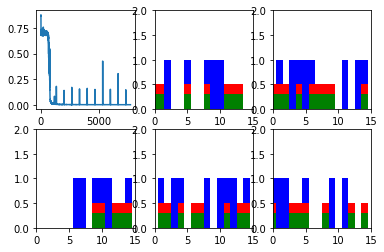

Step 500 Loss 0.000285168


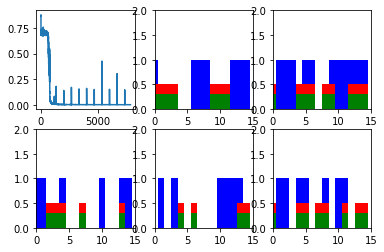

Step 600 Loss 0.000302796


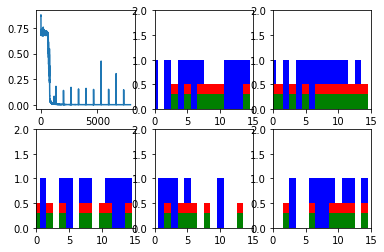

New data, epoch 12
Step 0 Loss 0.174628


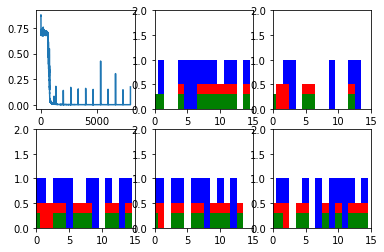

Step 100 Loss 0.000438233


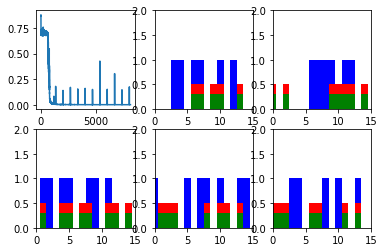

Step 200 Loss 0.000336581


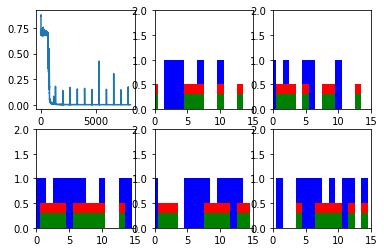

Step 300 Loss 0.000270795


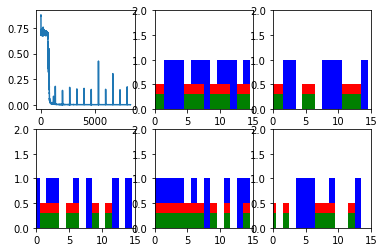

Step 400 Loss 0.00032943


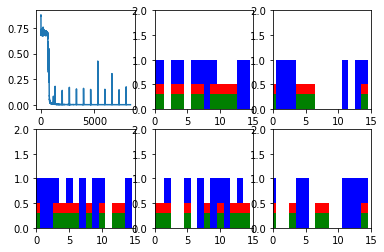

Step 500 Loss 0.000346915


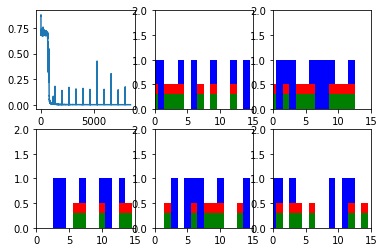

Step 600 Loss 0.000328883


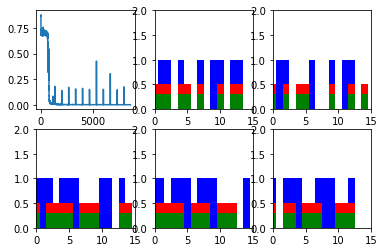

New data, epoch 13
Step 0 Loss 0.310628


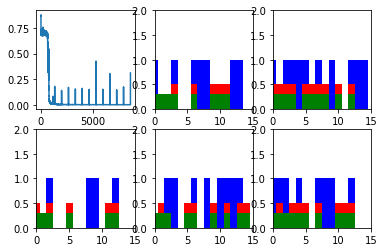

Step 100 Loss 0.000279435


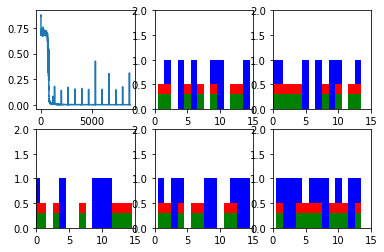

Step 200 Loss 0.000324084


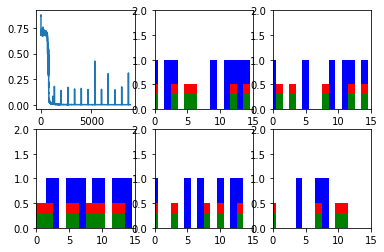

Step 300 Loss 0.00033899


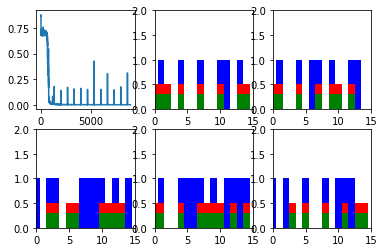

Step 400 Loss 0.000382287


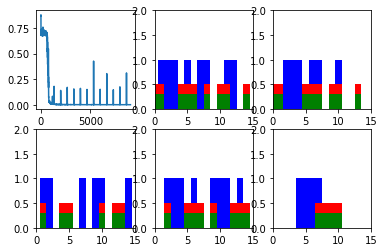

Step 500 Loss 0.000288605


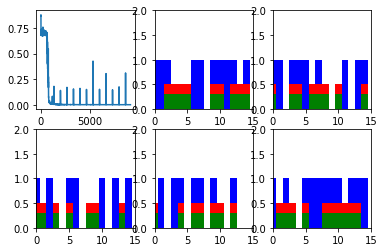

Step 600 Loss 0.000299717


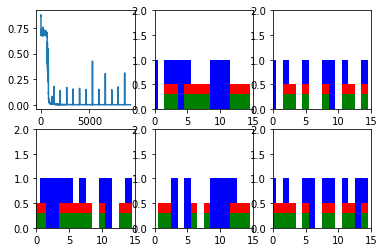

New data, epoch 14
Step 0 Loss 0.179515


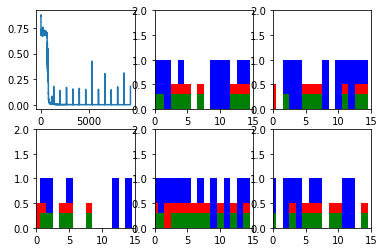

Step 100 Loss 0.000242033


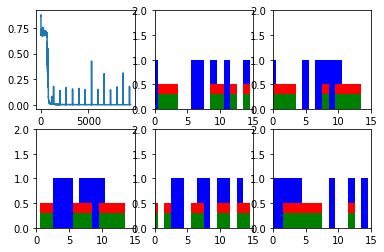

Step 200 Loss 0.000286234


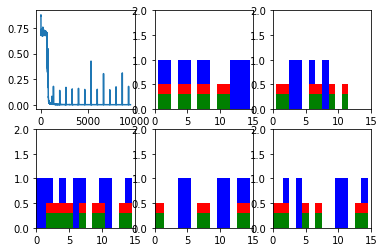

Step 300 Loss 0.000279645


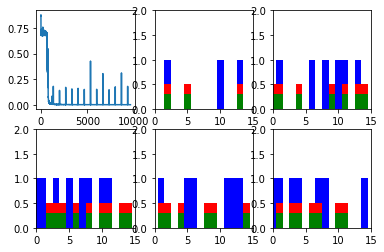

Step 400 Loss 0.000275405


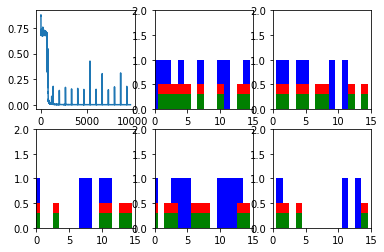

Step 500 Loss 0.000241629


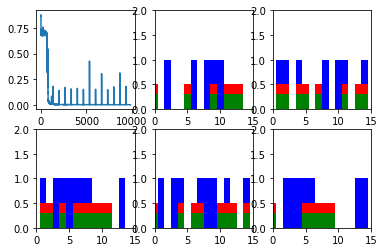

Step 600 Loss 0.000248249


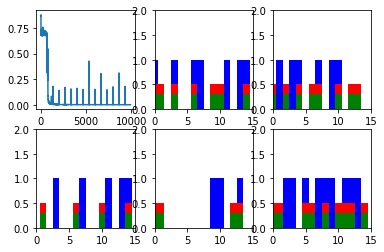

New data, epoch 15
Step 0 Loss 0.161155


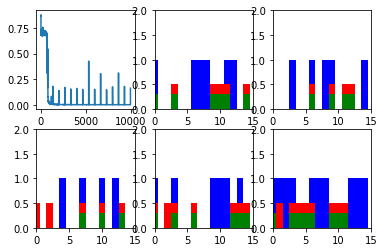

Step 100 Loss 0.00034865


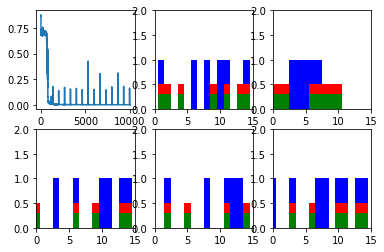

Step 200 Loss 0.00032433


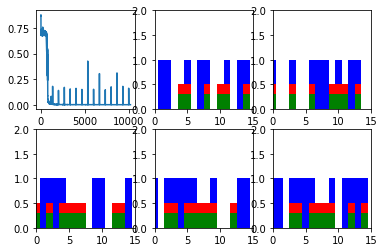

Step 300 Loss 0.000237659


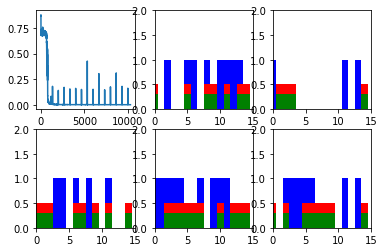

Step 400 Loss 0.000293107


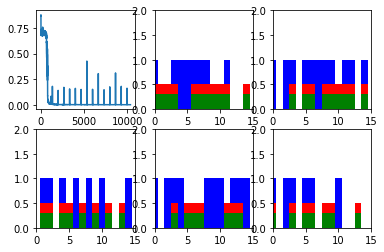

Step 500 Loss 0.0002275


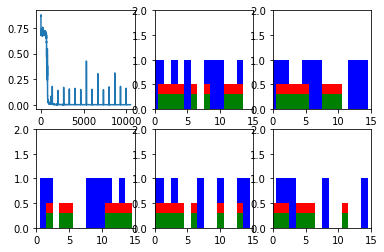

Step 600 Loss 0.000241114


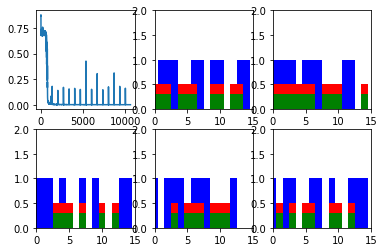

New data, epoch 16
Step 0 Loss 0.115328


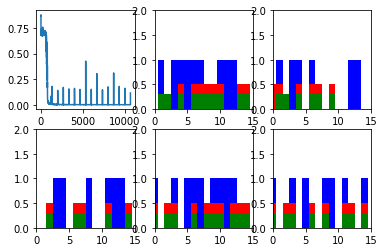

Step 100 Loss 0.000228868


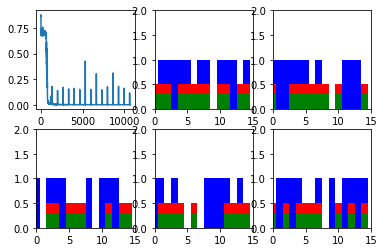

Step 200 Loss 0.00021406


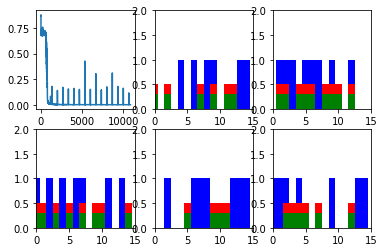

Step 300 Loss 0.000199314


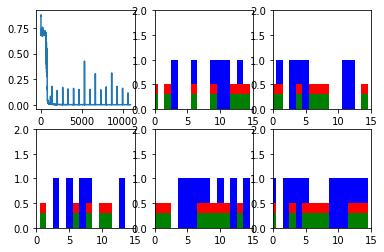

Step 400 Loss 0.000224175


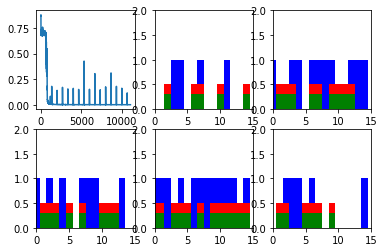

Step 500 Loss 0.000228321


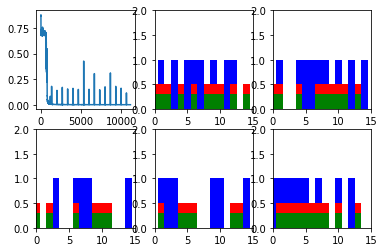

Step 600 Loss 0.000247708


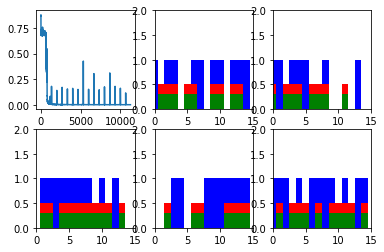

New data, epoch 17
Step 0 Loss 0.215407


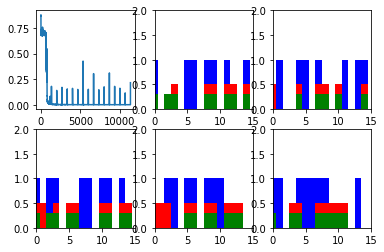

Step 100 Loss 0.000256558


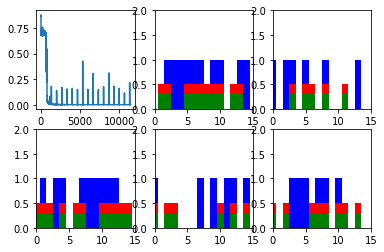

Step 200 Loss 0.000217428


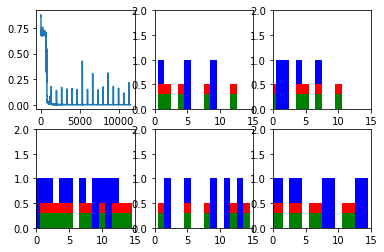

Step 300 Loss 0.000196017


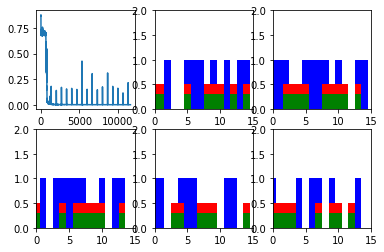

Step 400 Loss 0.000200063


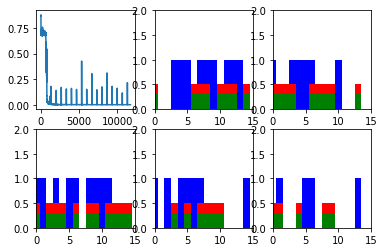

Step 500 Loss 0.000183442


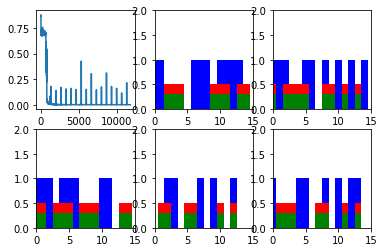

Step 600 Loss 0.000222645


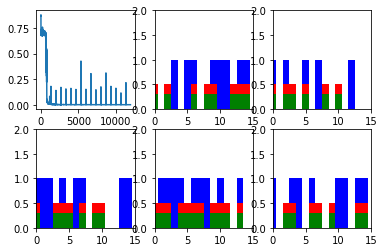

New data, epoch 18
Step 0 Loss 0.270752


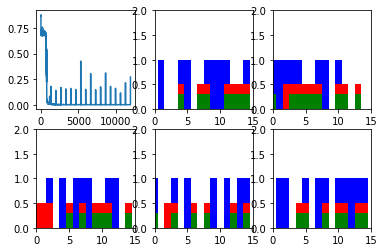

Step 100 Loss 0.000207718


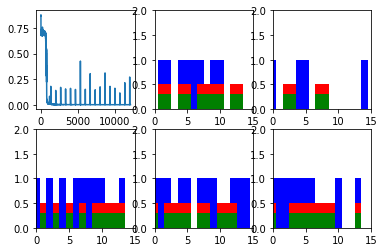

Step 200 Loss 0.000214091


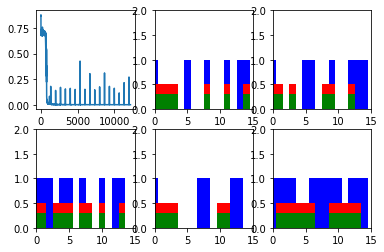

Step 300 Loss 0.000222672


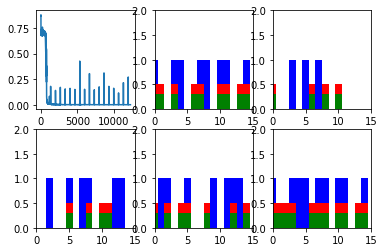

Step 400 Loss 0.000189046


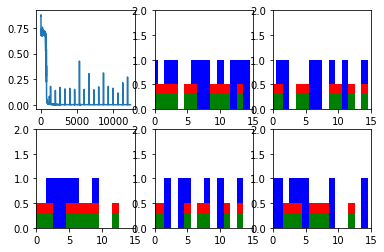

Step 500 Loss 0.000194551


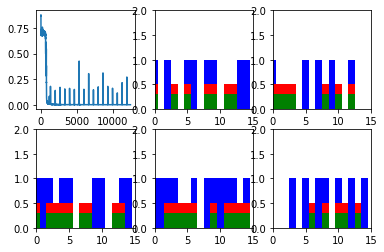

Step 600 Loss 0.000203248


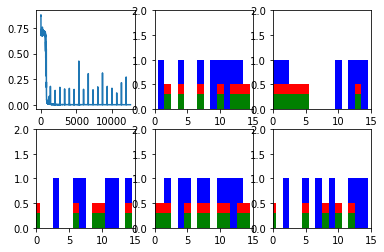

New data, epoch 19
Step 0 Loss 0.223366


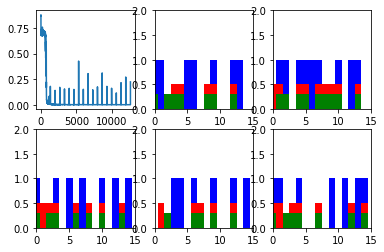

Step 100 Loss 0.000243218


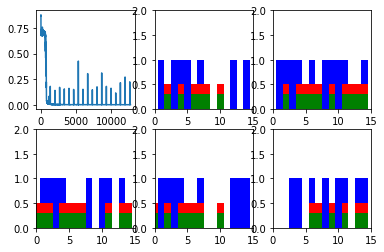

Step 200 Loss 0.00026616


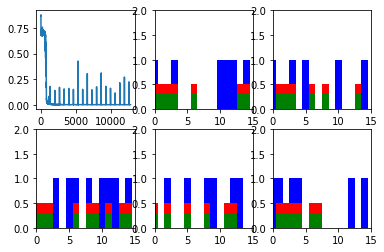

Step 300 Loss 0.0002254


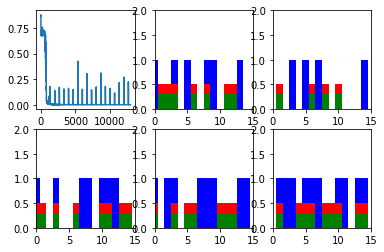

Step 400 Loss 0.0002536


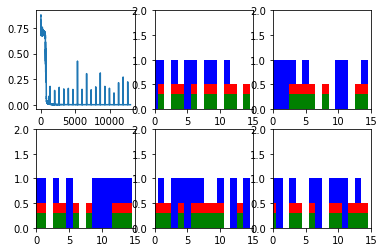

Step 500 Loss 0.000205225


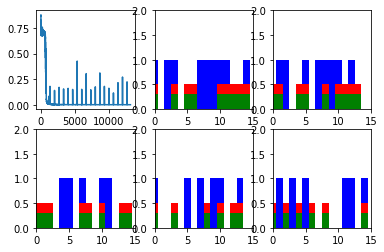

Step 600 Loss 0.000205945


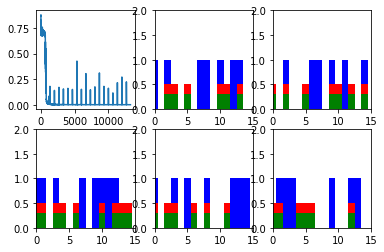

New data, epoch 20
Step 0 Loss 0.358369


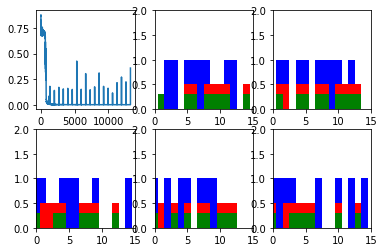

Step 100 Loss 0.000191439


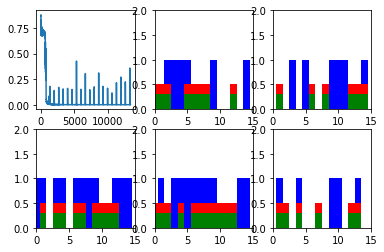

Step 200 Loss 0.000218379


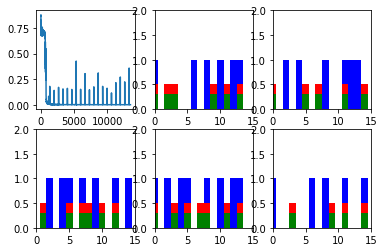

Step 300 Loss 0.000193152


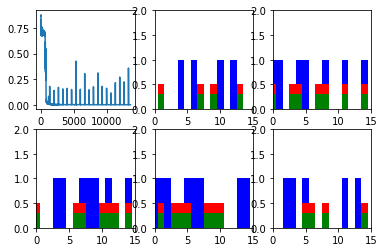

Step 400 Loss 0.000200182


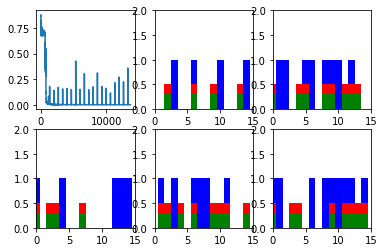

Step 500 Loss 0.000179771


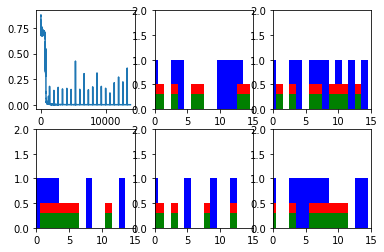

Step 600 Loss 0.000171381


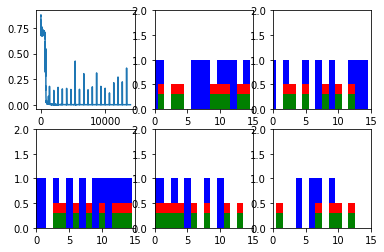

New data, epoch 21
Step 0 Loss 0.138193


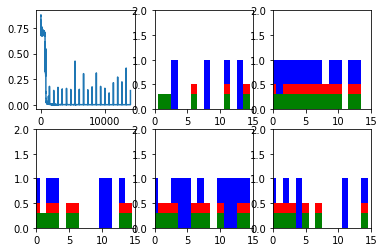

Step 100 Loss 0.000179019


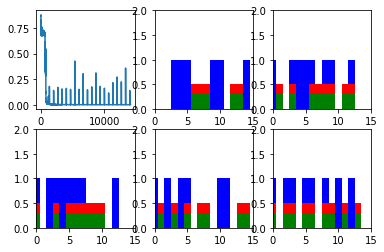

Step 200 Loss 0.000161601


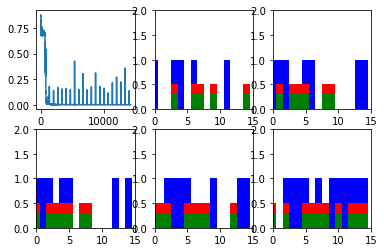

Step 300 Loss 0.0001848


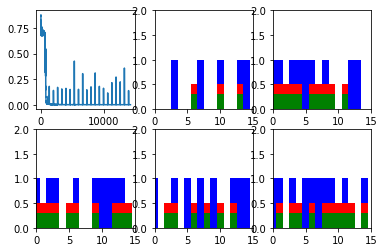

Step 400 Loss 0.000150893


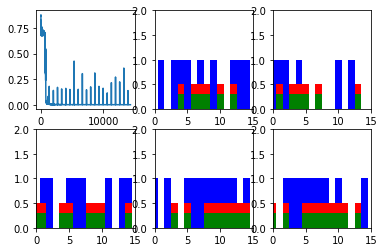

Step 500 Loss 0.000159908


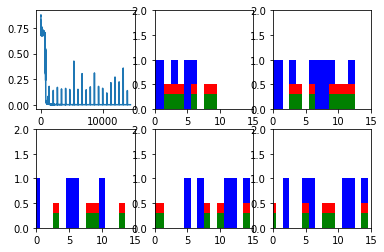

Step 600 Loss 0.000172357


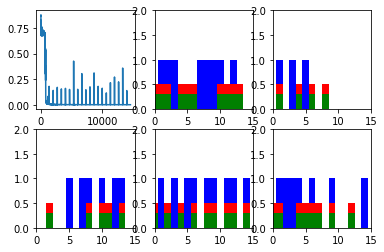

New data, epoch 22
Step 0 Loss 0.116704


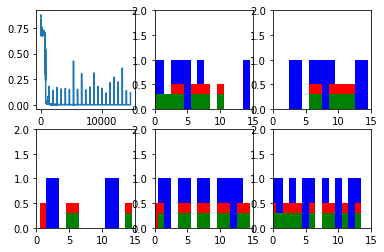

Step 100 Loss 0.000179405


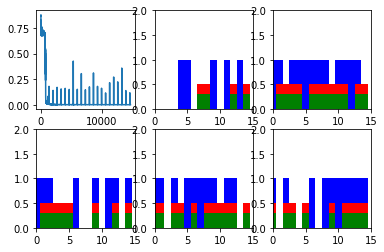

Step 200 Loss 0.000158257


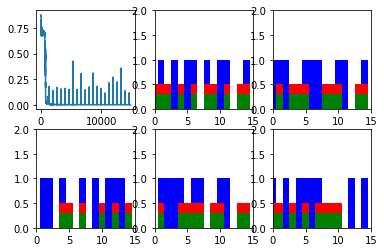

Step 300 Loss 0.00014532


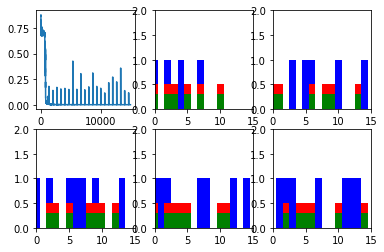

Step 400 Loss 0.000137812


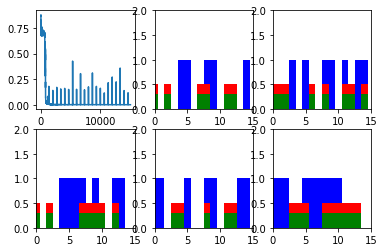

Step 500 Loss 0.000137839


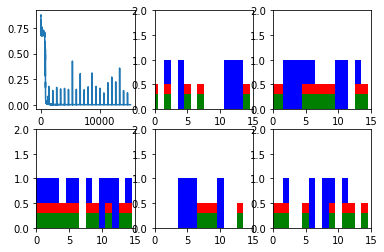

Step 600 Loss 0.00016514


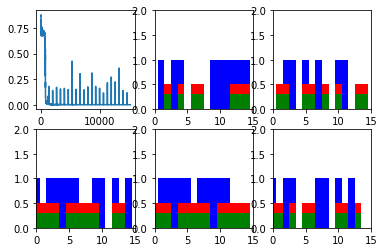

New data, epoch 23
Step 0 Loss 0.171475


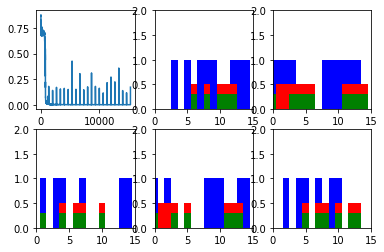

Step 100 Loss 0.000203523


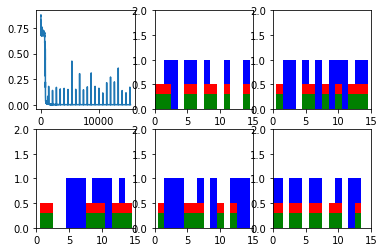

Step 200 Loss 0.000152613


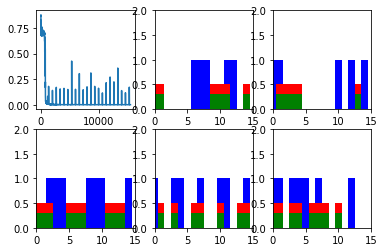

Step 300 Loss 0.000154322


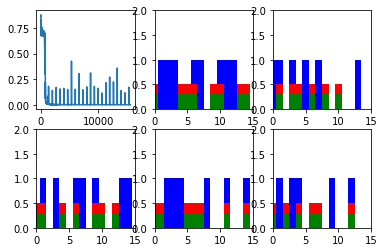

Step 400 Loss 0.0001915


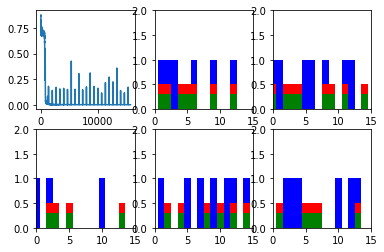

Step 500 Loss 0.000154963


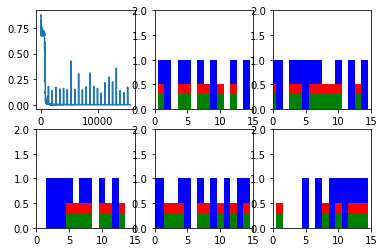

Step 600 Loss 0.000145342


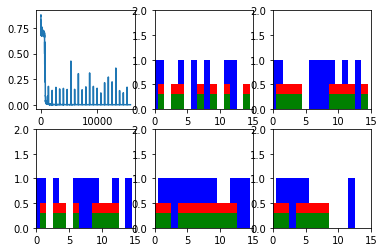

New data, epoch 24
Step 0 Loss 0.294869


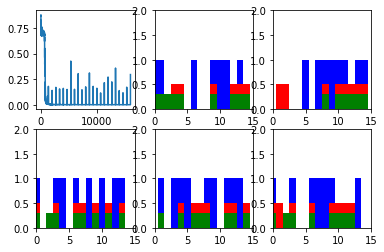

Step 100 Loss 0.000164908


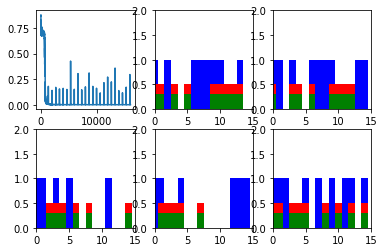

Step 200 Loss 0.000207515


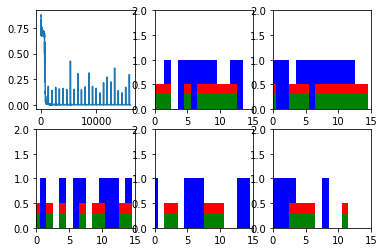

Step 300 Loss 0.000177862


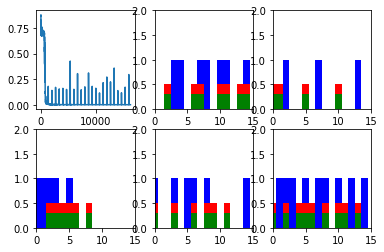

Step 400 Loss 0.000178693


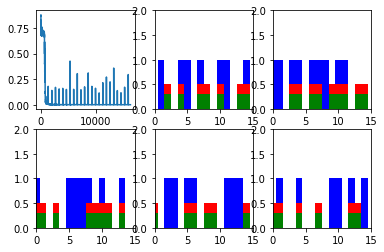

Step 500 Loss 0.000157214


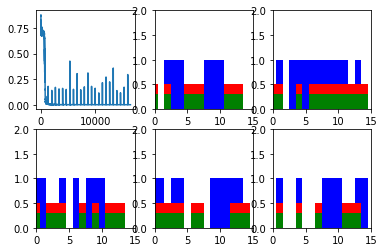

Step 600 Loss 0.000161414


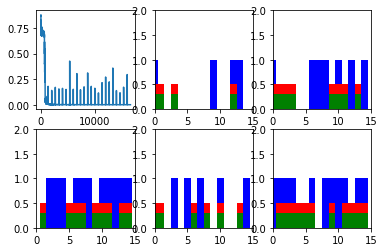

New data, epoch 25
Step 0 Loss 0.219422


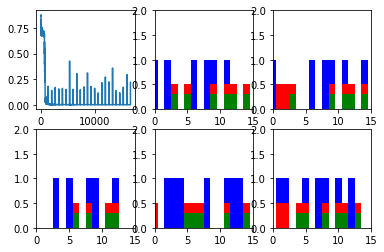

Step 100 Loss 0.000126488


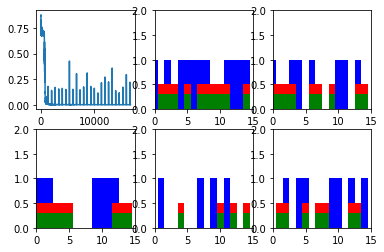

Step 200 Loss 0.000123683


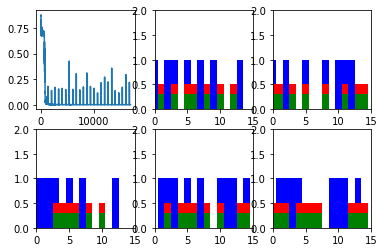

Step 300 Loss 0.00013212


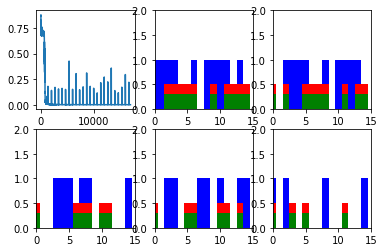

Step 400 Loss 0.000148024


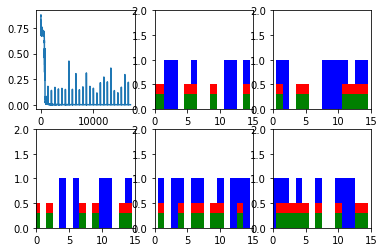

Step 500 Loss 0.000133311


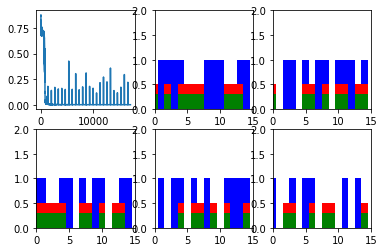

Step 600 Loss 0.000133359


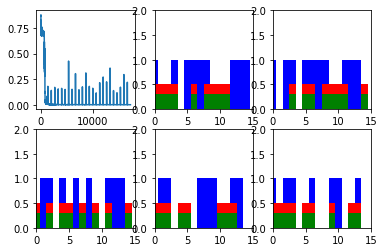

New data, epoch 26
Step 0 Loss 0.134863


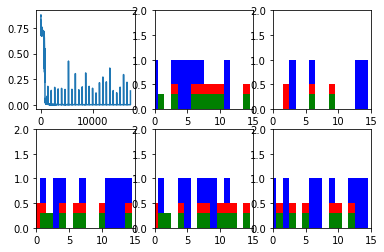

Step 100 Loss 0.000135644


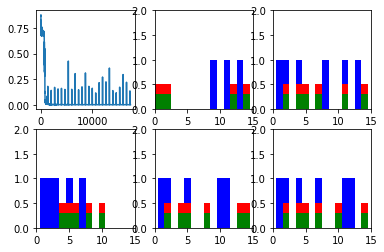

Step 200 Loss 0.00014963


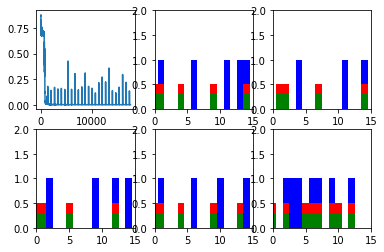

Step 300 Loss 0.000128614


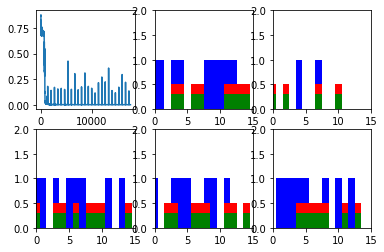

Step 400 Loss 0.000128477


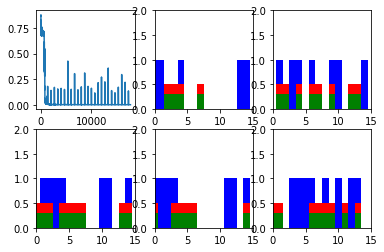

Step 500 Loss 0.000135068


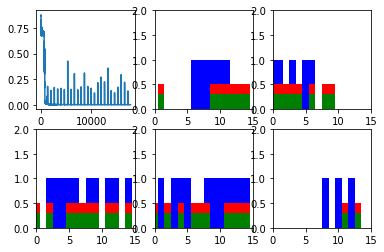

Step 600 Loss 0.000129641


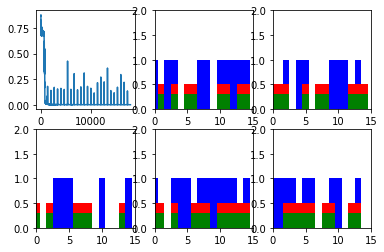

New data, epoch 27
Step 0 Loss 0.197676


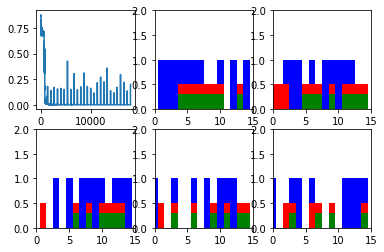

Step 100 Loss 0.000229744


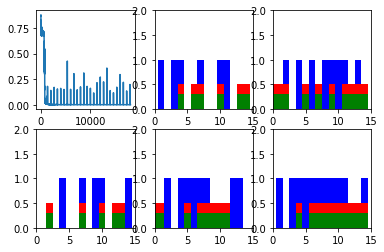

Step 200 Loss 0.000152694


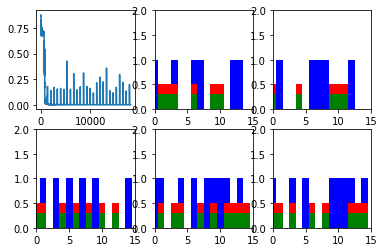

Step 300 Loss 0.000195683


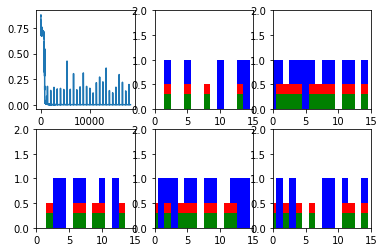

Step 400 Loss 0.000157195


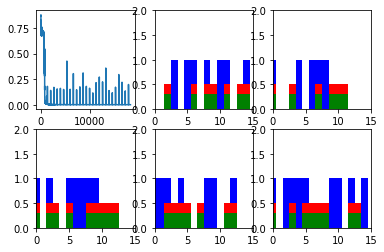

Step 500 Loss 0.000145569


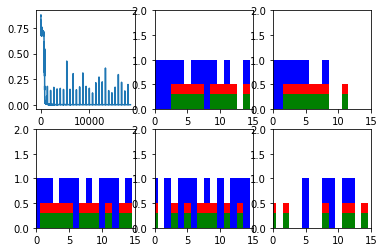

Step 600 Loss 0.000178272


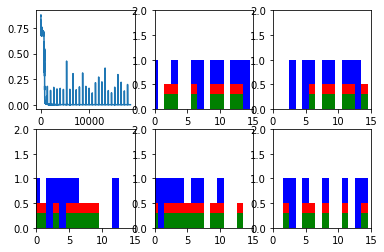

New data, epoch 28
Step 0 Loss 0.180182


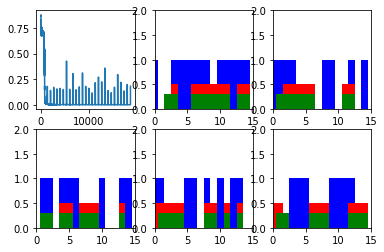

Step 100 Loss 0.000137917


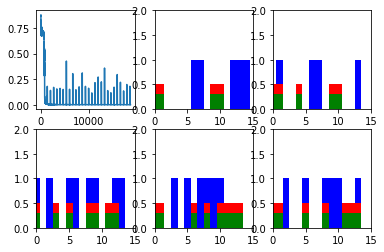

Step 200 Loss 0.000141522


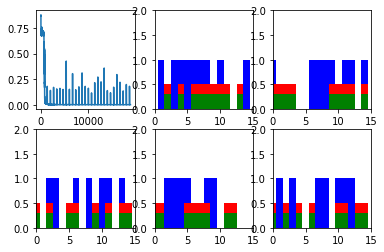

Step 300 Loss 0.000127349


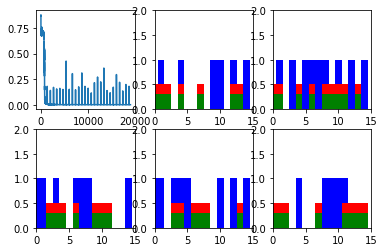

Step 400 Loss 0.000140511


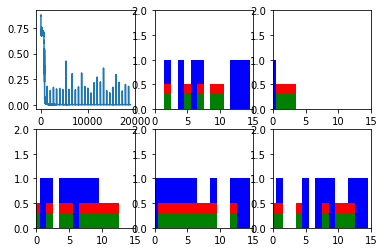

Step 500 Loss 0.000136839


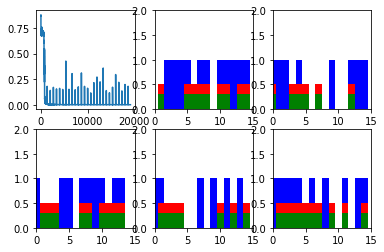

Step 600 Loss 0.000149843


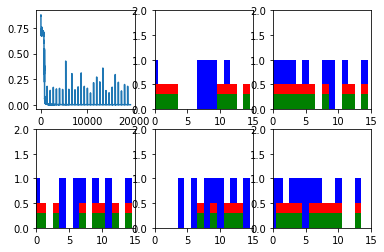

New data, epoch 29
Step 0 Loss 0.190534


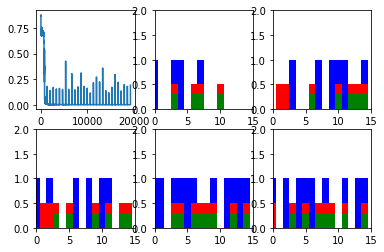

Step 100 Loss 0.000142726


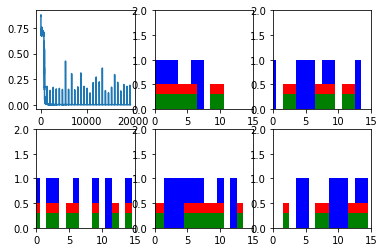

Step 200 Loss 0.000149664


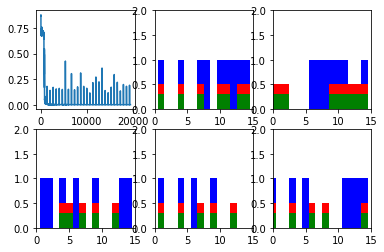

Step 300 Loss 0.000118877


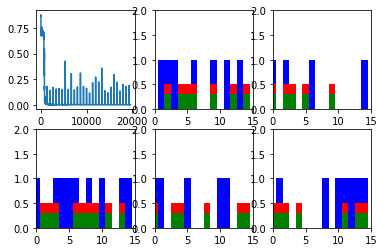

Step 400 Loss 0.000124163


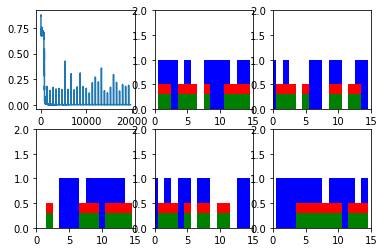

Step 500 Loss 0.000134648


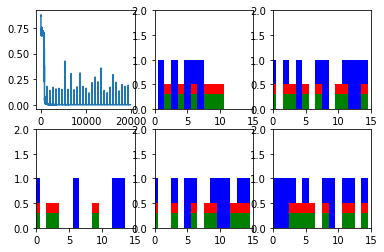

Step 600 Loss 0.000107544


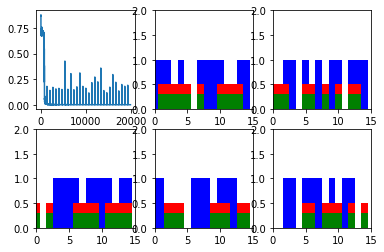

New data, epoch 30
Step 0 Loss 0.228347


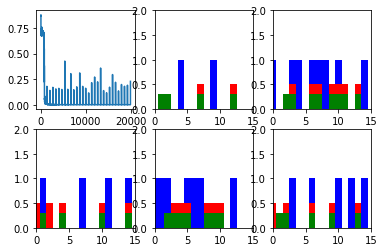

Step 100 Loss 0.000116731


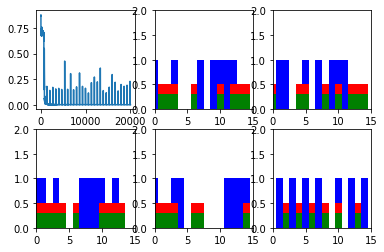

Step 200 Loss 0.000119832


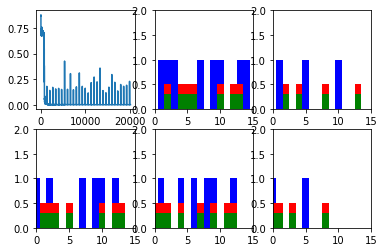

Step 300 Loss 0.000131177


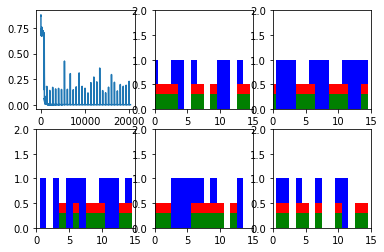

Step 400 Loss 0.000127605


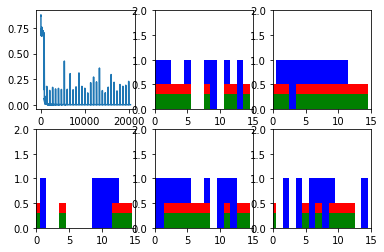

Step 500 Loss 0.000132007


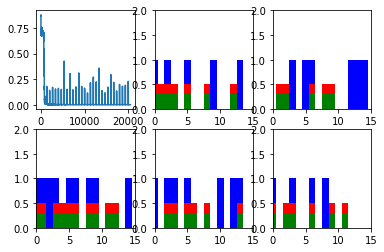

Step 600 Loss 0.000114938


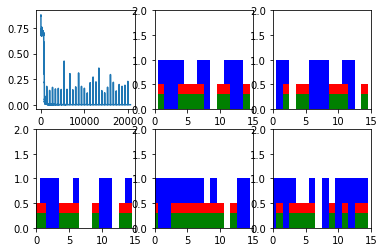

New data, epoch 31
Step 0 Loss 0.393173


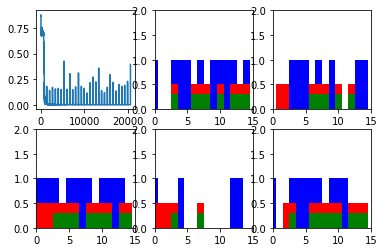

Step 100 Loss 0.00023448


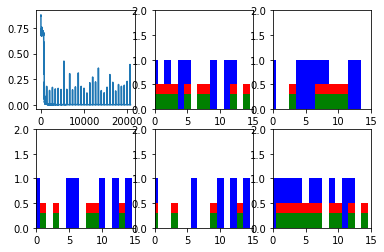

Step 200 Loss 0.000124245


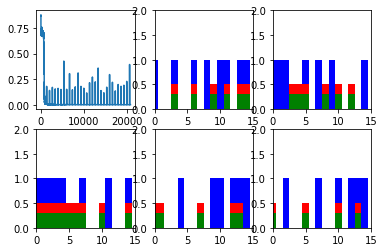

Step 300 Loss 0.000114844


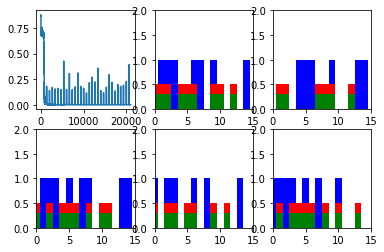

Step 400 Loss 0.000119517


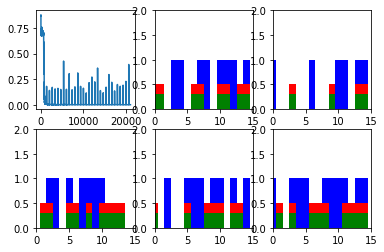

Step 500 Loss 0.000111101


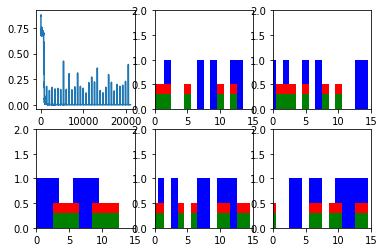

Step 600 Loss 0.000108722


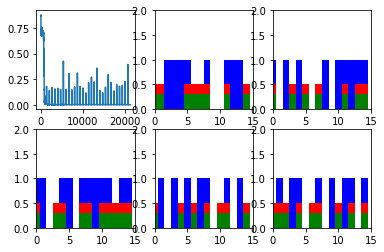

New data, epoch 32
Step 0 Loss 0.251992


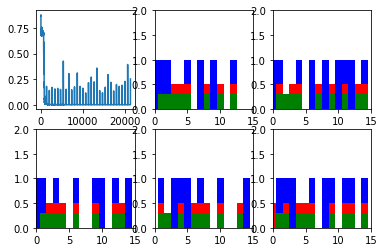

Step 100 Loss 0.00015378


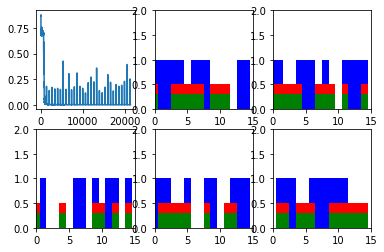

Step 200 Loss 0.000123108


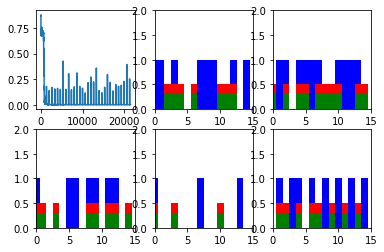

Step 300 Loss 0.000154495


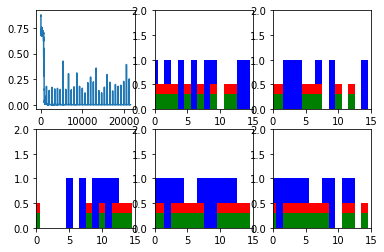

Step 400 Loss 0.000142527


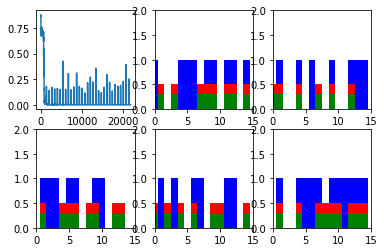

Step 500 Loss 0.000114162


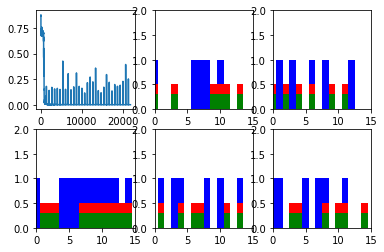

Step 600 Loss 0.000120238


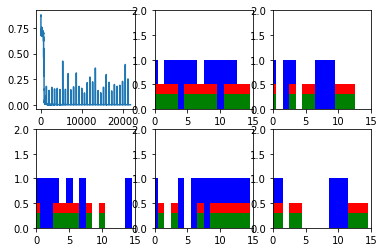

New data, epoch 33
Step 0 Loss 0.319014


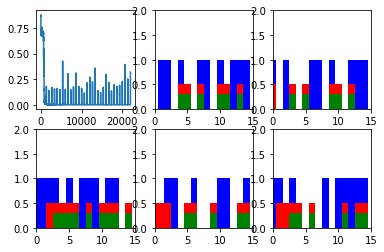

Step 100 Loss 0.000112071


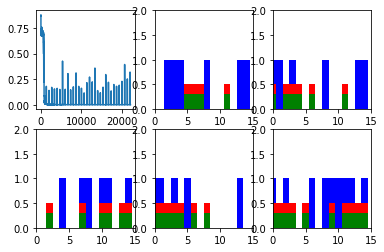

Step 200 Loss 0.000109539


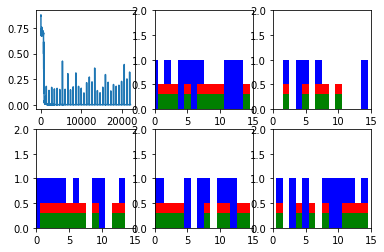

Step 300 Loss 9.75092e-05


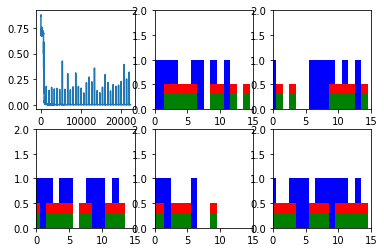

Step 400 Loss 9.22484e-05


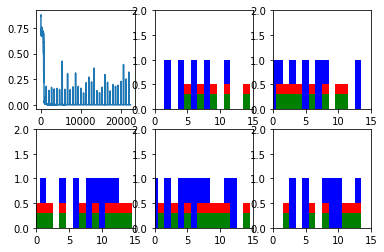

Step 500 Loss 0.000111933


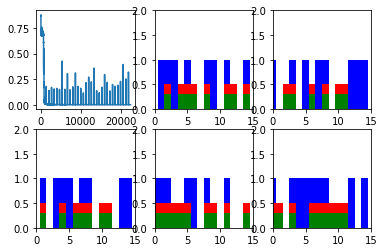

Step 600 Loss 0.000102617


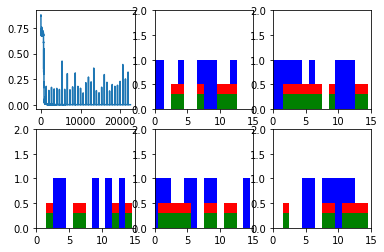

New data, epoch 34
Step 0 Loss 0.143947


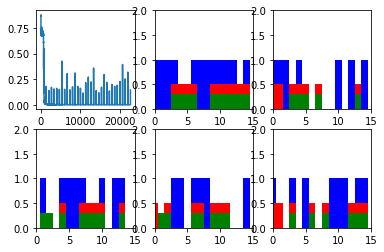

Step 100 Loss 0.000101086


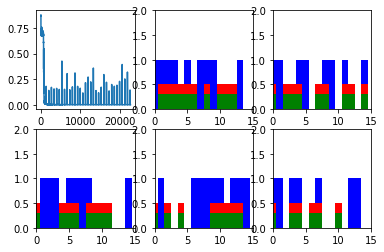

Step 200 Loss 0.000104349


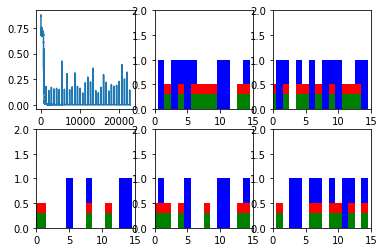

Step 300 Loss 0.000106933


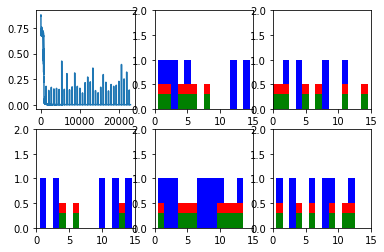

Step 400 Loss 0.000108227


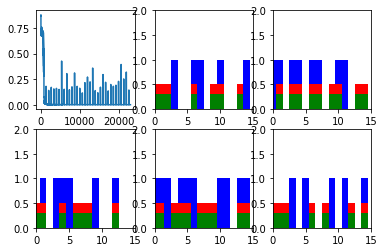

Step 500 Loss 9.90744e-05


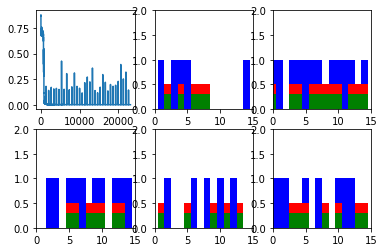

Step 600 Loss 0.000108014


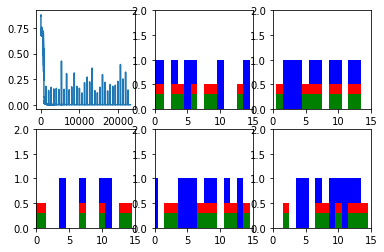

New data, epoch 35
Step 0 Loss 0.176659


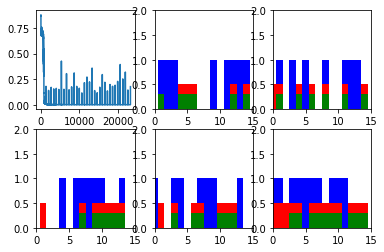

Step 100 Loss 0.000125272


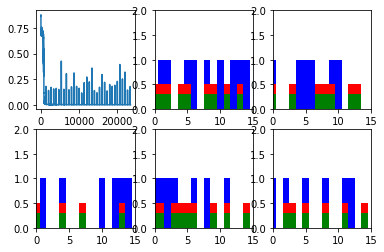

Step 200 Loss 0.000113886


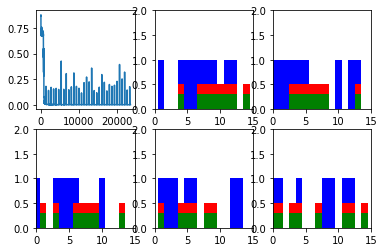

Step 300 Loss 9.5909e-05


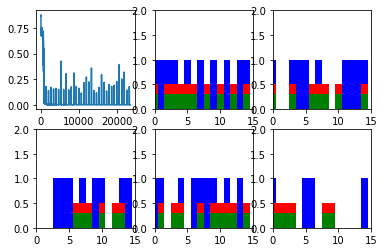

Step 400 Loss 0.000113499


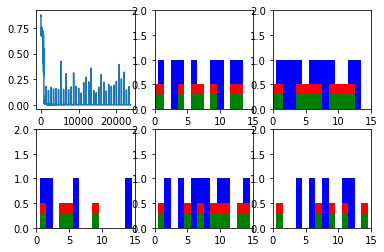

Step 500 Loss 0.000100476


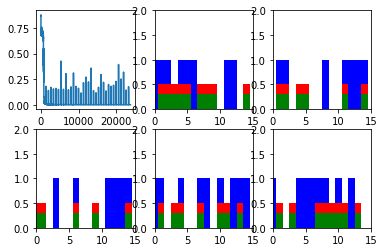

Step 600 Loss 0.000103834


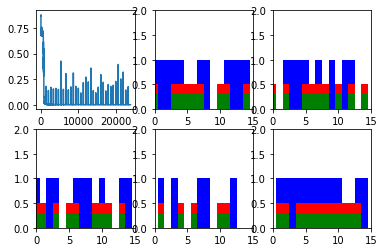

New data, epoch 36
Step 0 Loss 0.202489


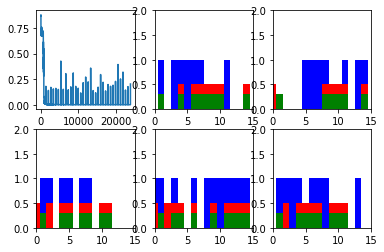

Step 100 Loss 0.000115448


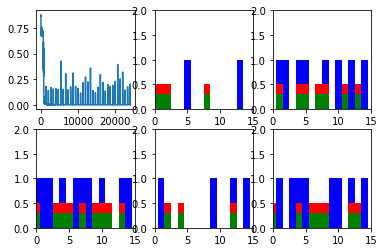

Step 200 Loss 0.000101603


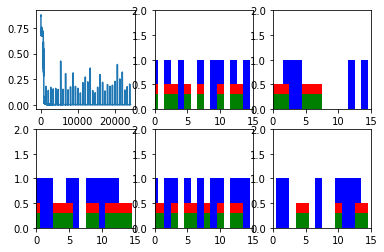

Step 300 Loss 9.45405e-05


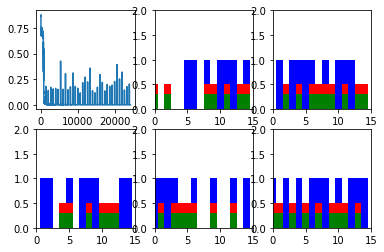

Step 400 Loss 0.000115912


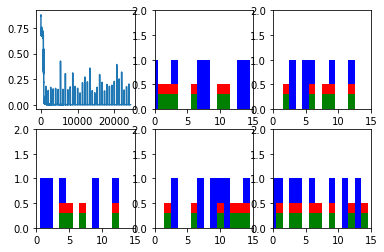

Step 500 Loss 9.88774e-05


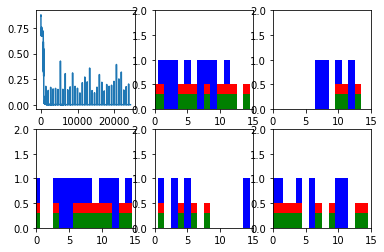

Step 600 Loss 8.69651e-05


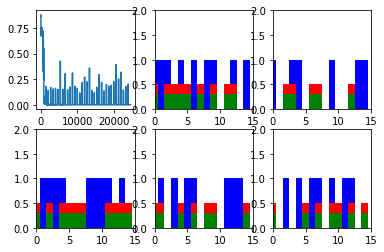

New data, epoch 37
Step 0 Loss 0.140575


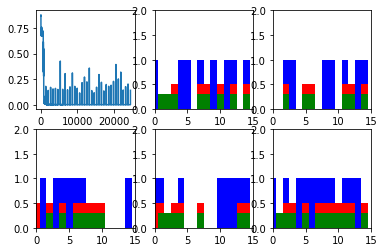

Step 100 Loss 0.00010374


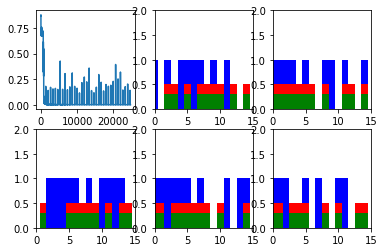

Step 200 Loss 0.000116228


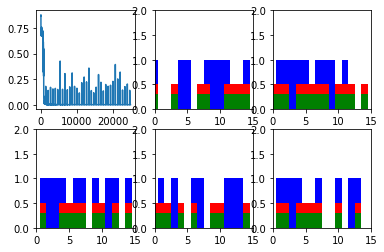

Step 300 Loss 9.8445e-05


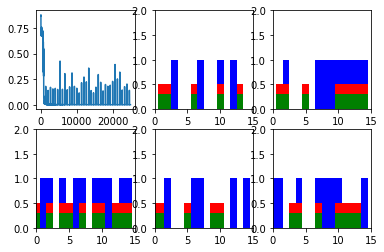

Step 400 Loss 7.86141e-05


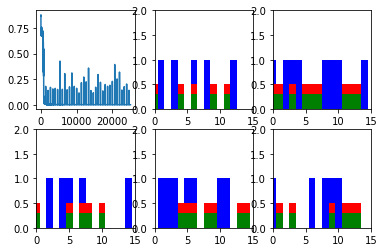

Step 500 Loss 0.000114012


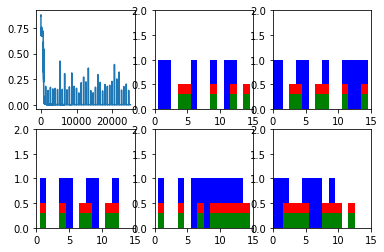

Step 600 Loss 0.000100193


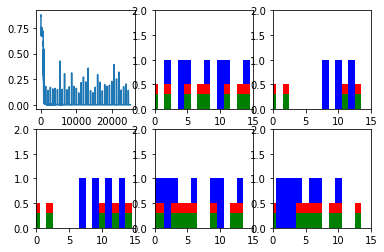

New data, epoch 38
Step 0 Loss 0.0992387


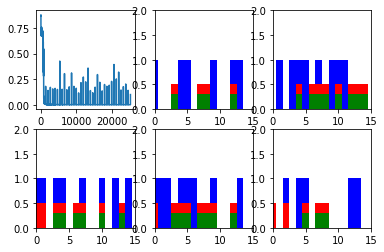

Step 100 Loss 9.43943e-05


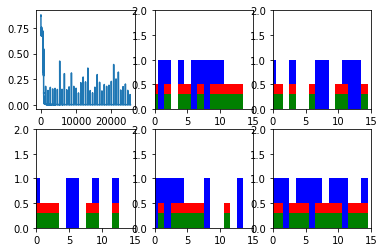

Step 200 Loss 9.97544e-05


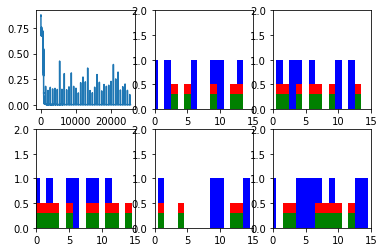

Step 300 Loss 9.9273e-05


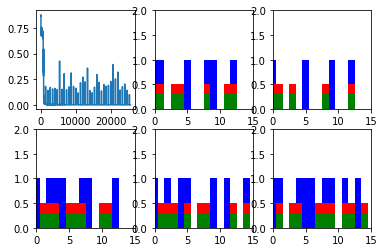

Step 400 Loss 8.38715e-05


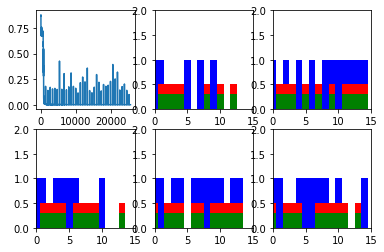

Step 500 Loss 9.50949e-05


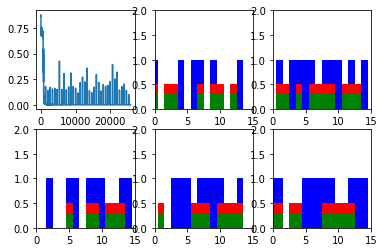

Step 600 Loss 9.77415e-05


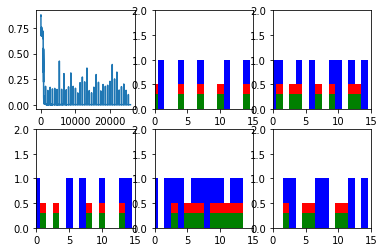

New data, epoch 39
Step 0 Loss 0.193325


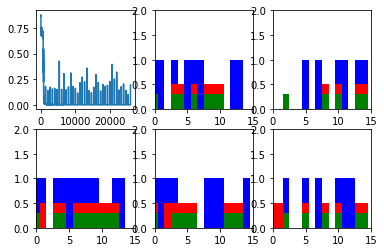

Step 100 Loss 8.84454e-05


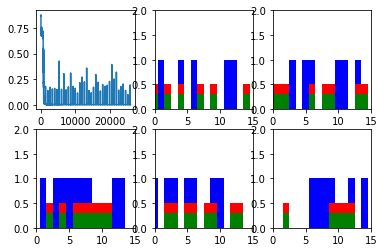

Step 200 Loss 9.20805e-05


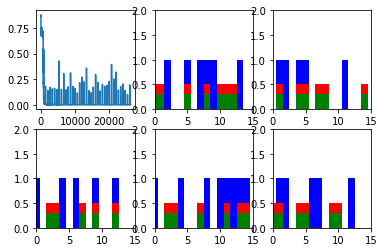

Step 300 Loss 9.29398e-05


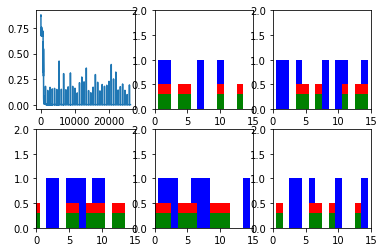

Step 400 Loss 7.36034e-05


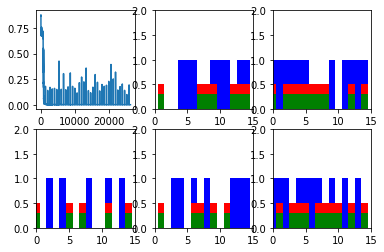

Step 500 Loss 0.000100657


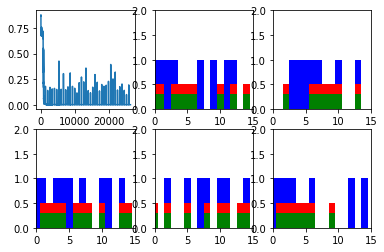

Step 600 Loss 8.87745e-05


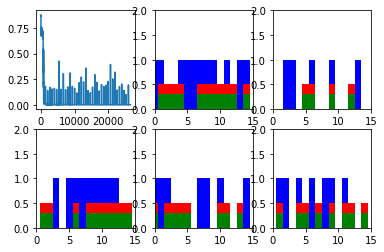

New data, epoch 40
Step 0 Loss 0.11518


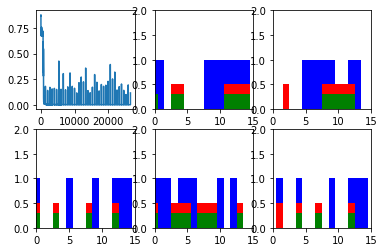

Step 100 Loss 9.27191e-05


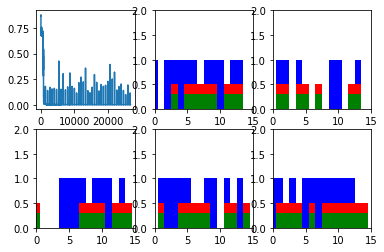

Step 200 Loss 9.83936e-05


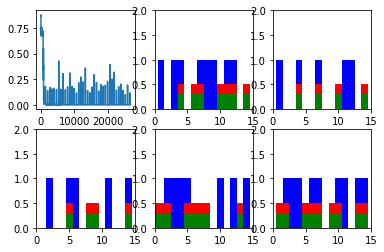

Step 300 Loss 8.2408e-05


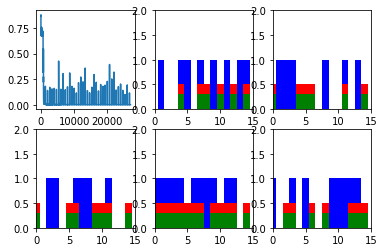

Step 400 Loss 7.80107e-05


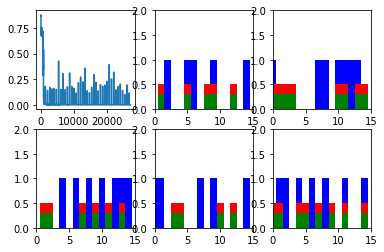

Step 500 Loss 8.68663e-05


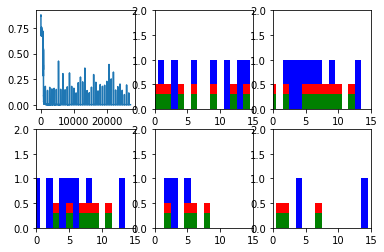

Step 600 Loss 8.85778e-05


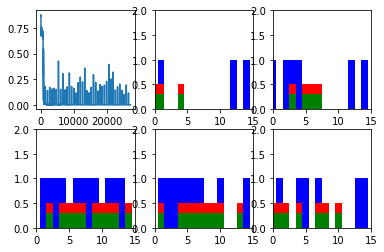

New data, epoch 41
Step 0 Loss 0.181149


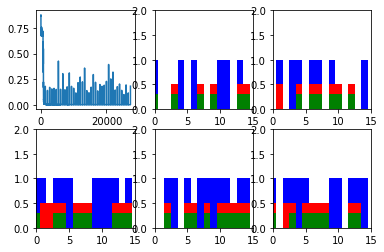

Step 100 Loss 8.60533e-05


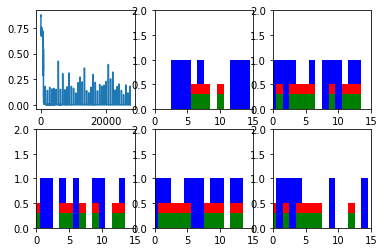

Step 200 Loss 9.08446e-05


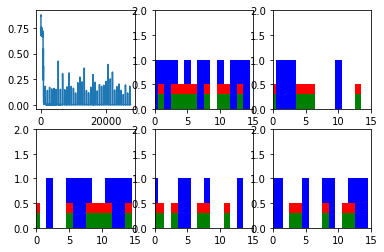

Step 300 Loss 0.000111925


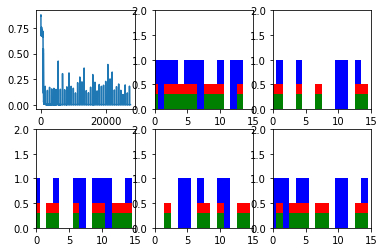

Step 400 Loss 0.000120278


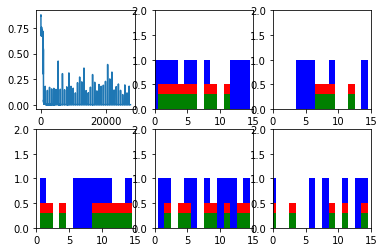

Step 500 Loss 9.429e-05


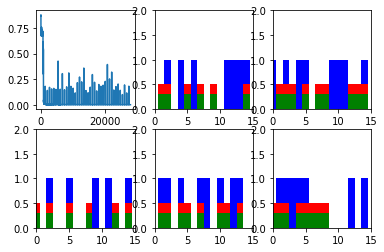

Step 600 Loss 7.3899e-05


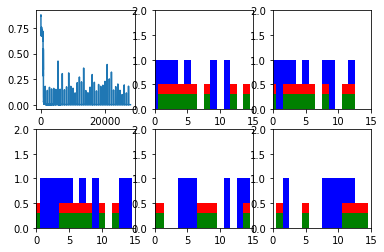

New data, epoch 42
Step 0 Loss 0.244861


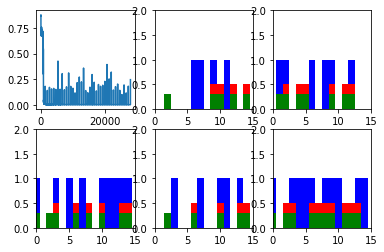

Step 100 Loss 9.17601e-05


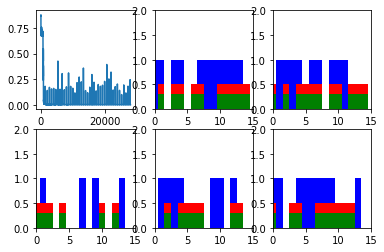

Step 200 Loss 9.54016e-05


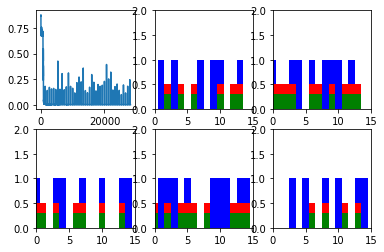

Step 300 Loss 8.57124e-05


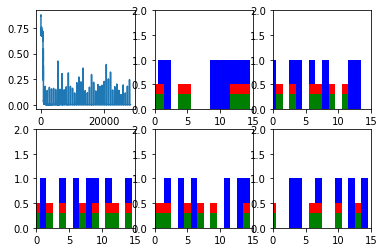

Step 400 Loss 9.91161e-05


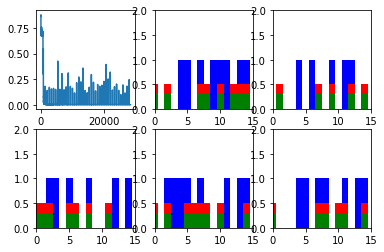

Step 500 Loss 0.000130938


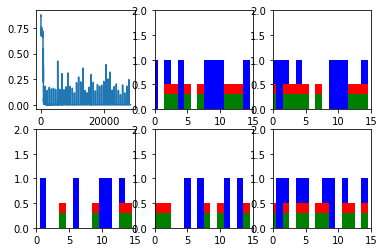

Step 600 Loss 7.74253e-05


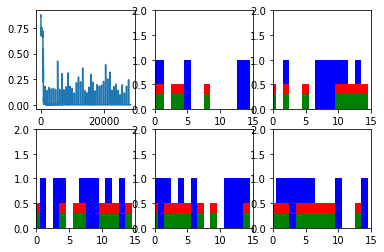

New data, epoch 43
Step 0 Loss 0.309169


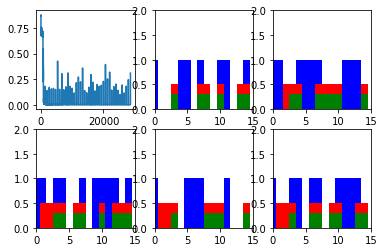

Step 100 Loss 0.00011971


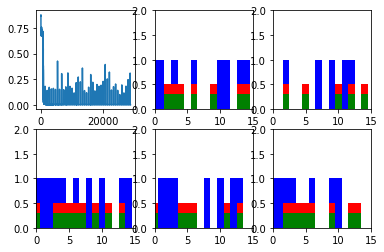

Step 200 Loss 0.000136531


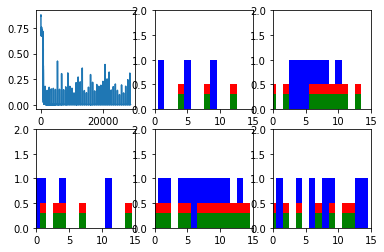

Step 300 Loss 8.63014e-05


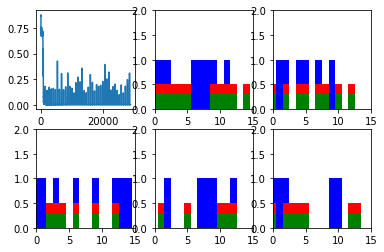

Step 400 Loss 9.24128e-05


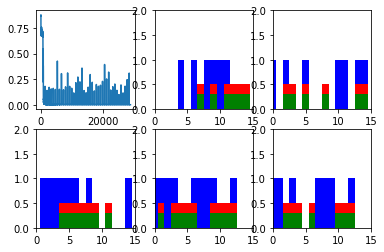

Step 500 Loss 0.000100579


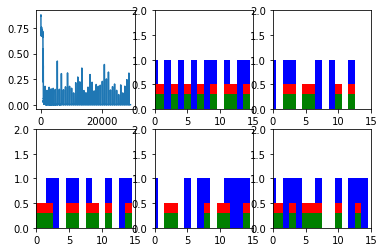

Step 600 Loss 9.7169e-05


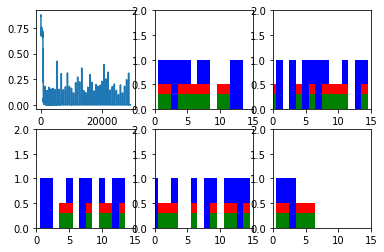

New data, epoch 44
Step 0 Loss 0.230042


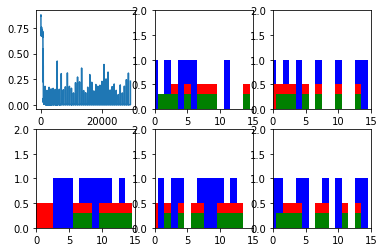

Step 100 Loss 9.61474e-05


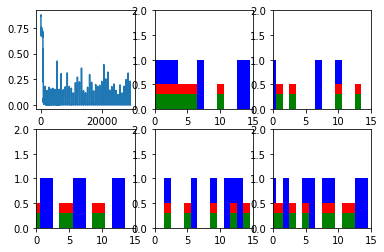

Step 200 Loss 0.000107987


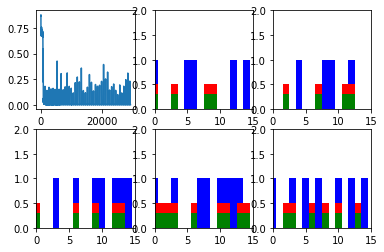

Step 300 Loss 0.000120762


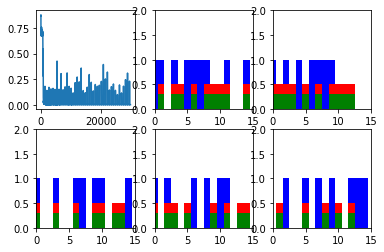

Step 400 Loss 8.72559e-05


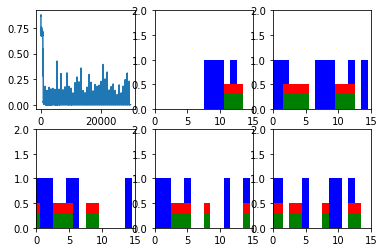

Step 500 Loss 8.17297e-05


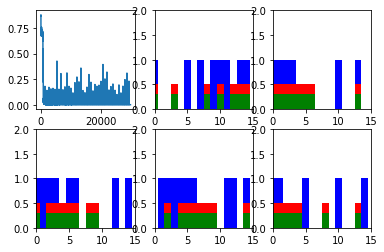

Step 600 Loss 7.34612e-05


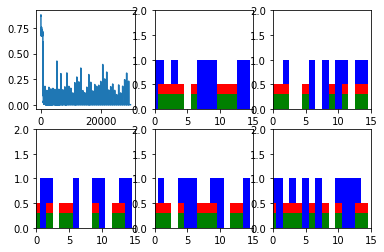

New data, epoch 45
Step 0 Loss 0.219458


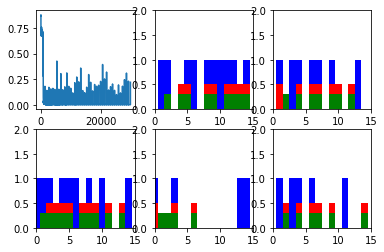

Step 100 Loss 8.18151e-05


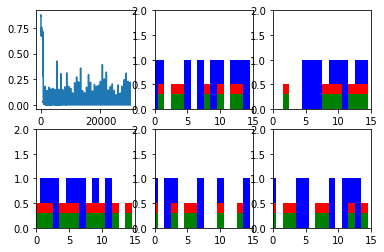

Step 200 Loss 9.52868e-05


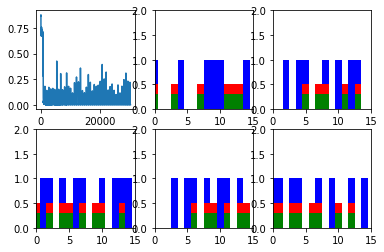

Step 300 Loss 8.18896e-05


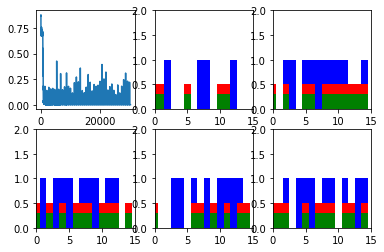

Step 400 Loss 8.10232e-05


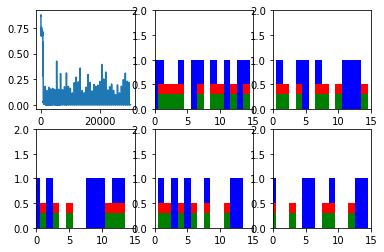

Step 500 Loss 9.05051e-05


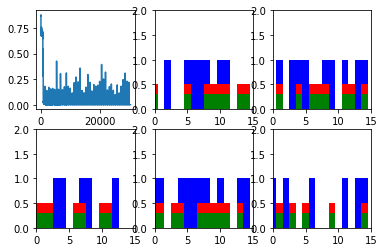

Step 600 Loss 9.98029e-05


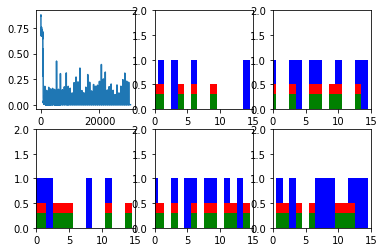

New data, epoch 46
Step 0 Loss 0.214881


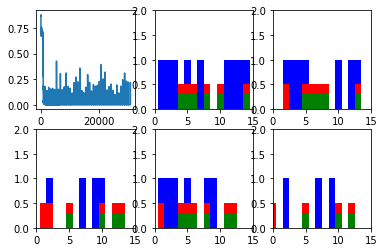

Step 100 Loss 8.42608e-05


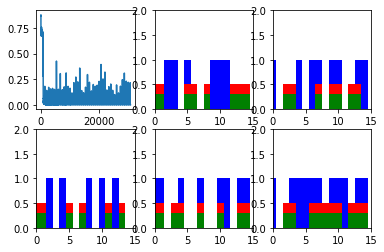

Step 200 Loss 8.27853e-05


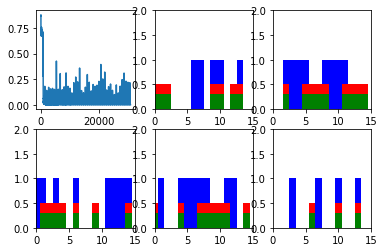

Step 300 Loss 8.48529e-05


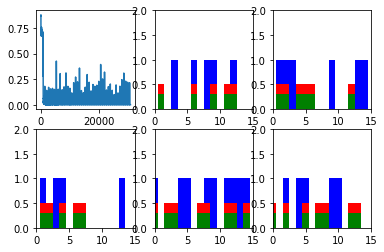

Step 400 Loss 8.67677e-05


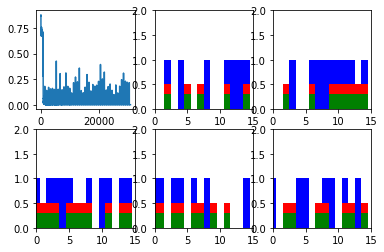

Step 500 Loss 8.24514e-05


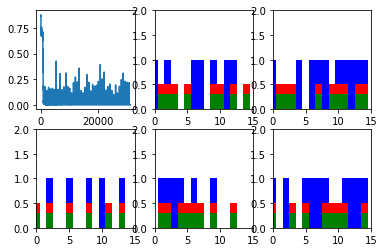

Step 600 Loss 7.55774e-05


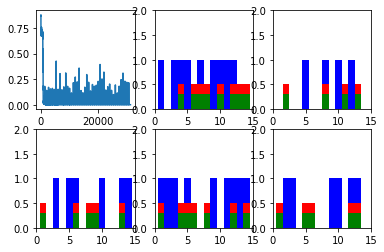

New data, epoch 47
Step 0 Loss 0.177109


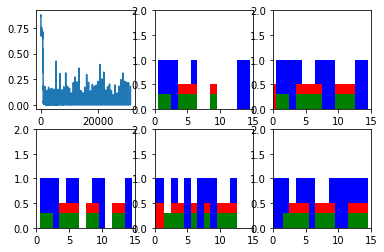

Step 100 Loss 8.83121e-05


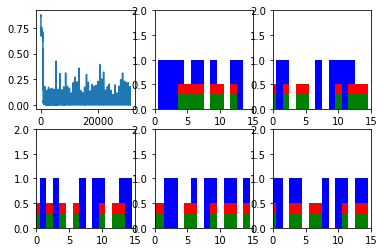

Step 200 Loss 7.80501e-05


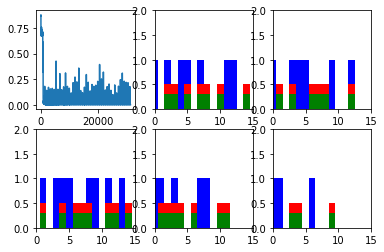

Step 300 Loss 9.54168e-05


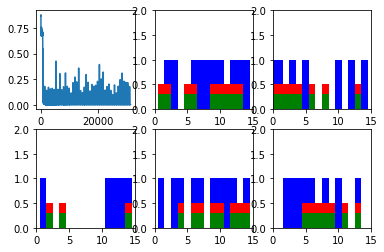

Step 400 Loss 8.61053e-05


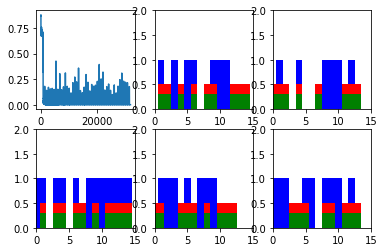

Step 500 Loss 0.00010388


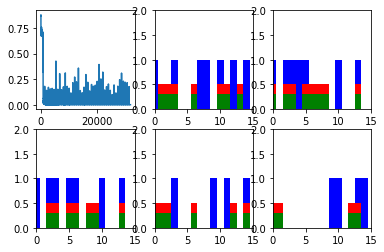

Step 600 Loss 8.61792e-05


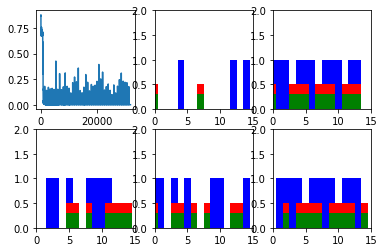

New data, epoch 48
Step 0 Loss 0.441369


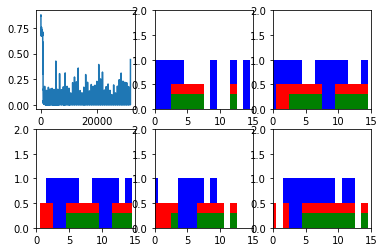

Step 100 Loss 8.73305e-05


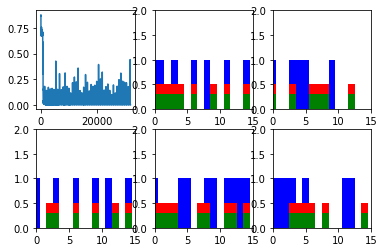

Step 200 Loss 8.55954e-05


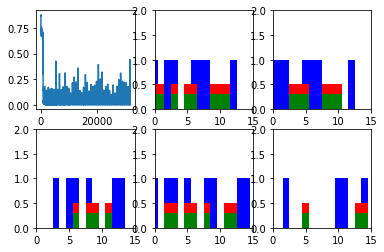

Step 300 Loss 8.13496e-05


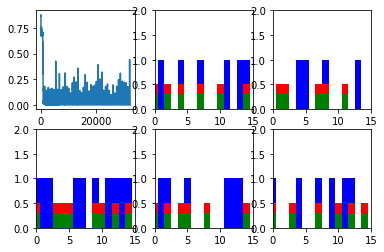

Step 400 Loss 8.45158e-05


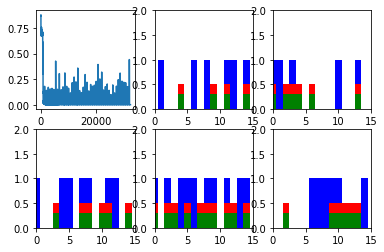

Step 500 Loss 7.52263e-05


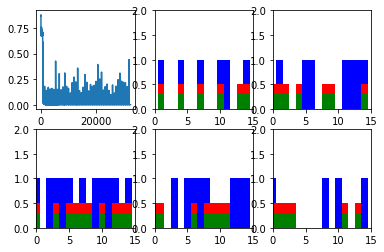

Step 600 Loss 7.71524e-05


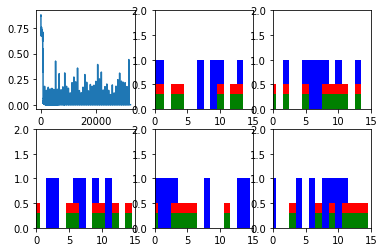

New data, epoch 49
Step 0 Loss 0.22549


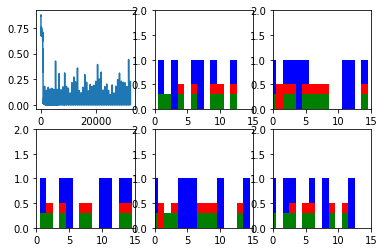

Step 100 Loss 8.11125e-05


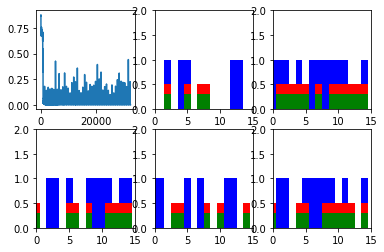

Step 200 Loss 0.000107918


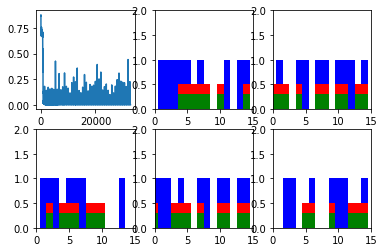

Step 300 Loss 7.07619e-05


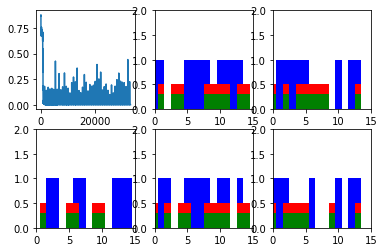

Step 400 Loss 8.77944e-05


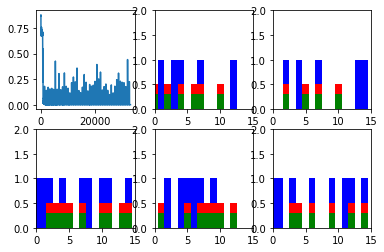

Step 500 Loss 7.30773e-05


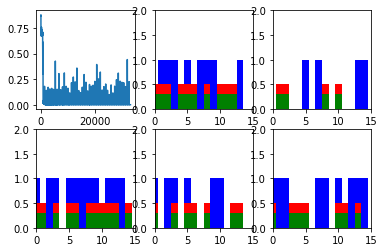

Step 600 Loss 6.27216e-05


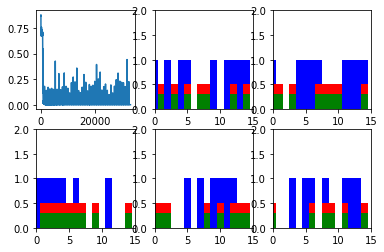

New data, epoch 50
Step 0 Loss 0.122825


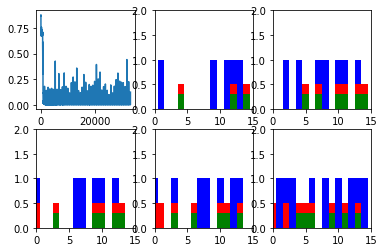

Step 100 Loss 7.52625e-05


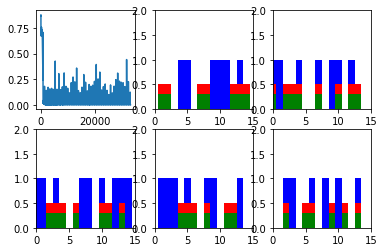

Step 200 Loss 8.78356e-05


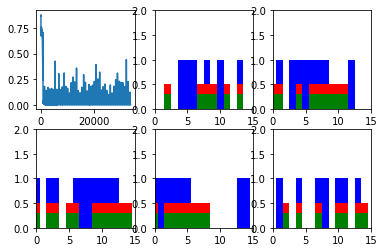

Step 300 Loss 7.01771e-05


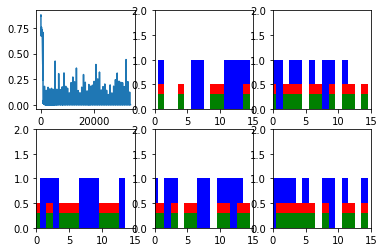

Step 400 Loss 8.23497e-05


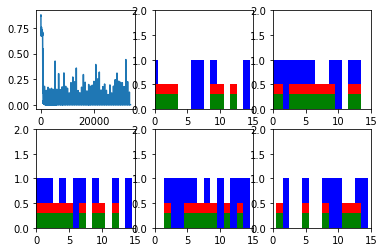

Step 500 Loss 6.88213e-05


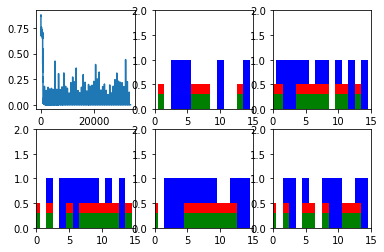

Step 600 Loss 7.69492e-05


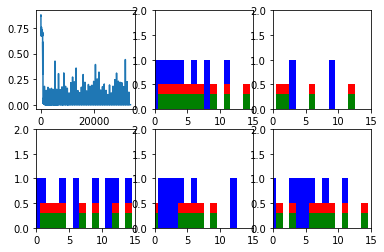

New data, epoch 51
Step 0 Loss 0.181718


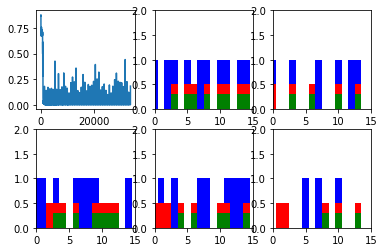

Step 100 Loss 7.64247e-05


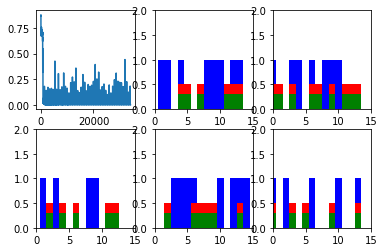

Step 200 Loss 7.78297e-05


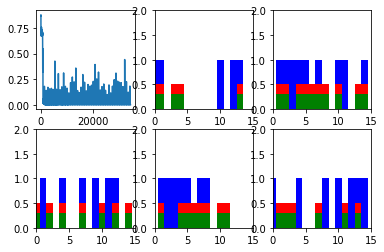

Step 300 Loss 7.64198e-05


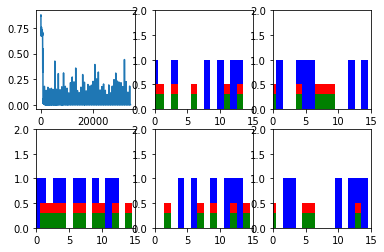

Step 400 Loss 7.7905e-05


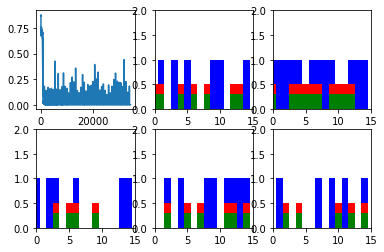

Step 500 Loss 7.63832e-05


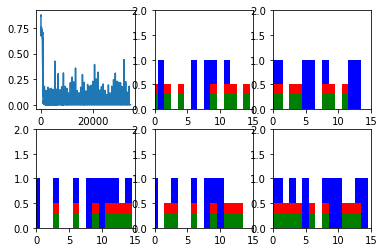

Step 600 Loss 6.33351e-05


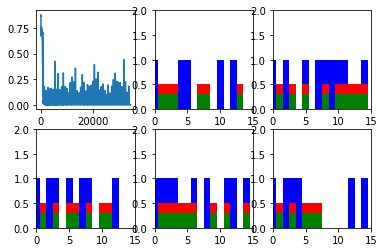

New data, epoch 52
Step 0 Loss 0.24747


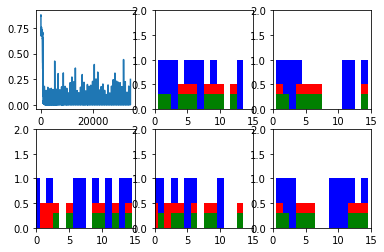

Step 100 Loss 6.42456e-05


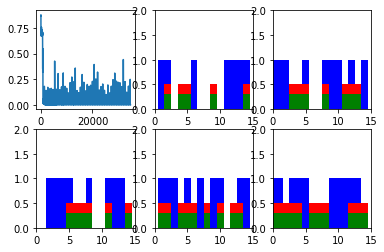

Step 200 Loss 6.56444e-05


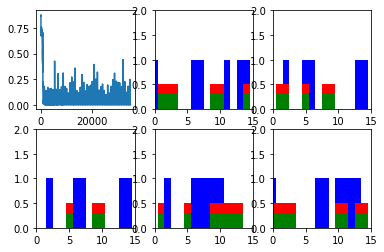

Step 300 Loss 7.68408e-05


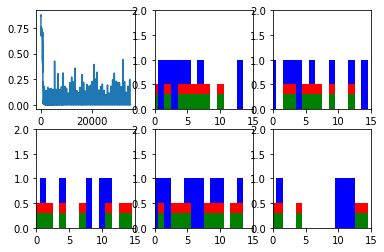

Step 400 Loss 6.64801e-05


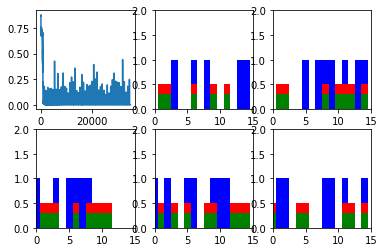

Step 500 Loss 7.57046e-05


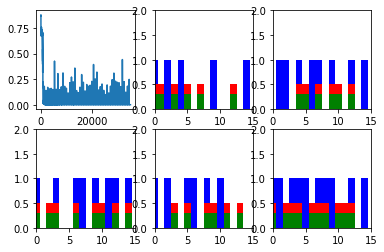

Step 600 Loss 7.00434e-05


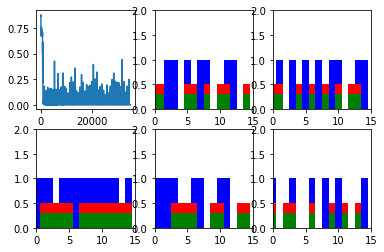

New data, epoch 53
Step 0 Loss 0.183347


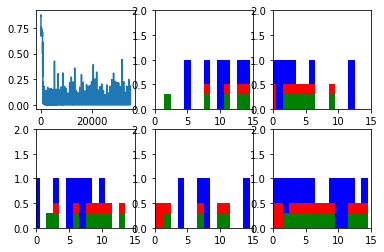

Step 100 Loss 6.94843e-05


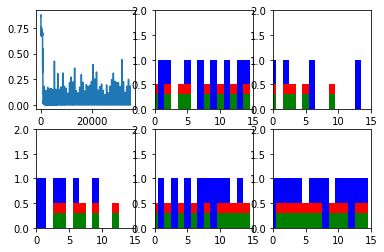

Step 200 Loss 6.54154e-05


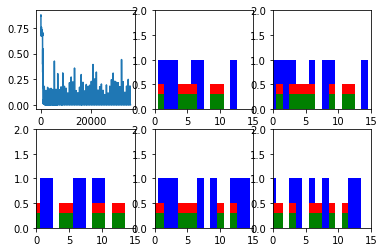

Step 300 Loss 6.52407e-05


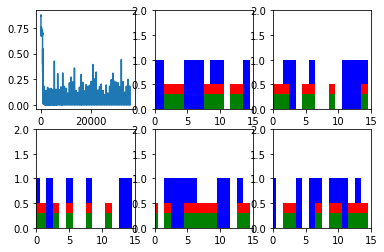

Step 400 Loss 6.12611e-05


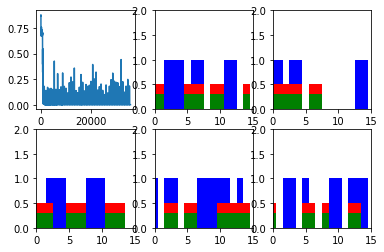

Step 500 Loss 7.08303e-05


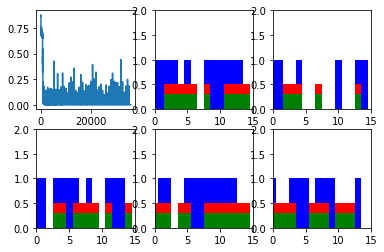

Step 600 Loss 5.97324e-05


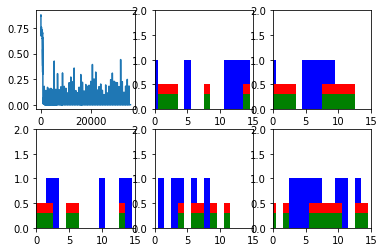

New data, epoch 54
Step 0 Loss 0.221453


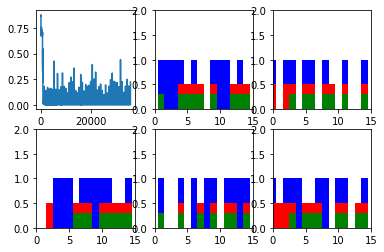

Step 100 Loss 6.95362e-05


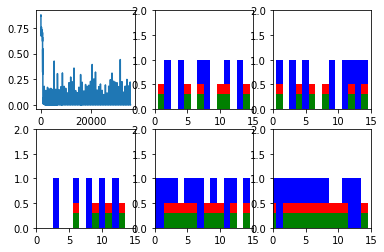

Step 200 Loss 8.37732e-05


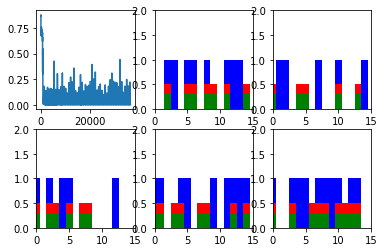

Step 300 Loss 7.26926e-05


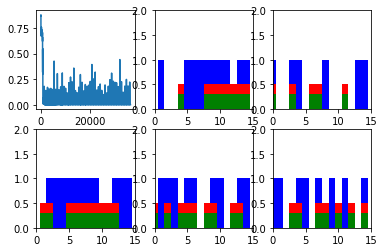

Step 400 Loss 6.74818e-05


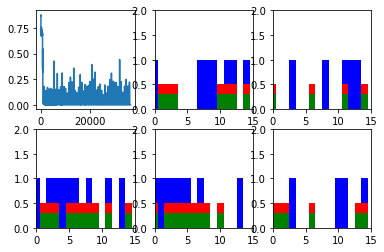

Step 500 Loss 7.20241e-05


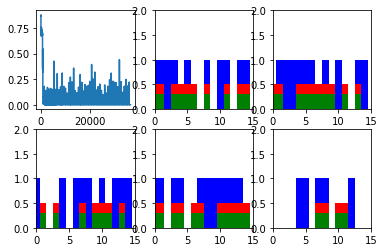

Step 600 Loss 6.12787e-05


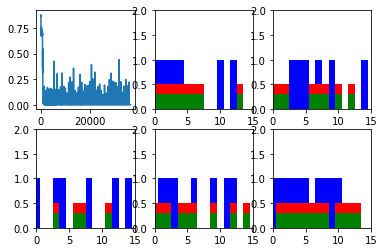

New data, epoch 55
Step 0 Loss 0.272353


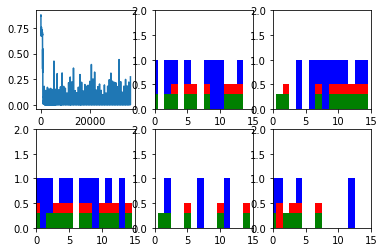

Step 100 Loss 6.46002e-05


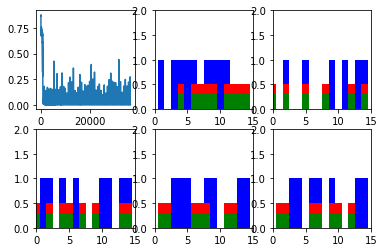

Step 200 Loss 8.05519e-05


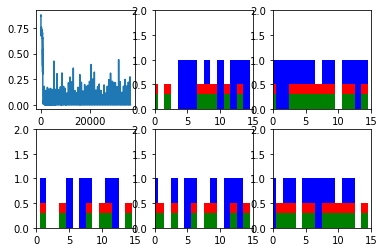

Step 300 Loss 0.00011786


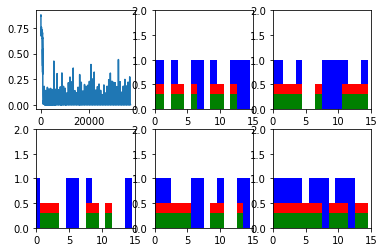

Step 400 Loss 6.73396e-05


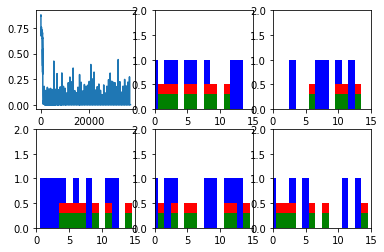

Step 500 Loss 6.31506e-05


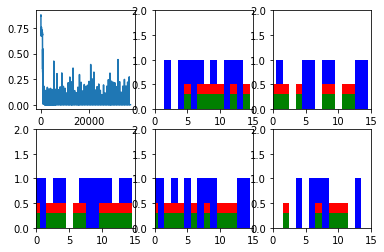

Step 600 Loss 7.10562e-05


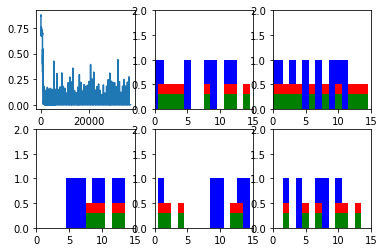

New data, epoch 56
Step 0 Loss 0.241461


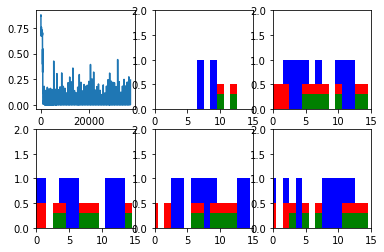

Step 100 Loss 6.75659e-05


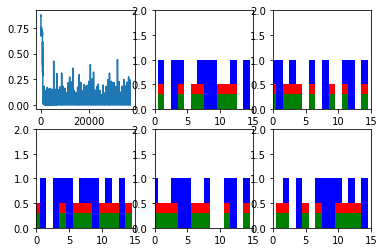

Step 200 Loss 6.2677e-05


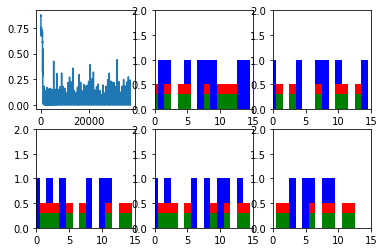

Step 300 Loss 7.19446e-05


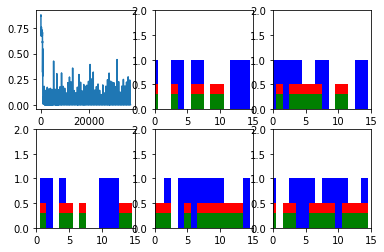

Step 400 Loss 5.14963e-05


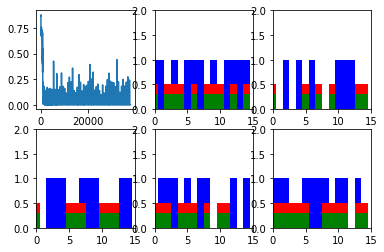

Step 500 Loss 7.04729e-05


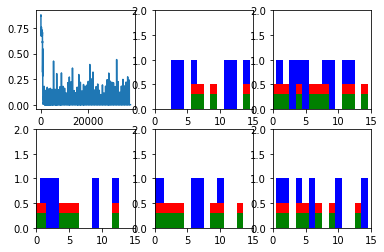

Step 600 Loss 6.78951e-05


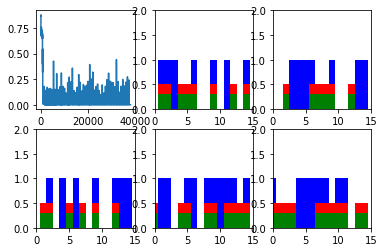

New data, epoch 57
Step 0 Loss 0.219272


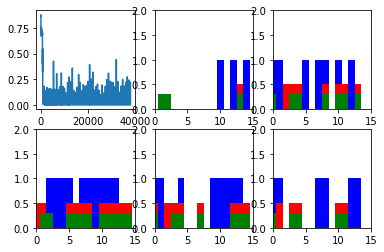

Step 100 Loss 6.42455e-05


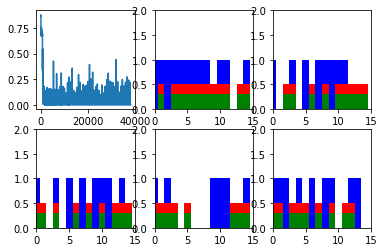

Step 200 Loss 5.99958e-05


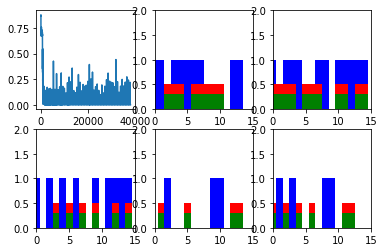

Step 300 Loss 6.67726e-05


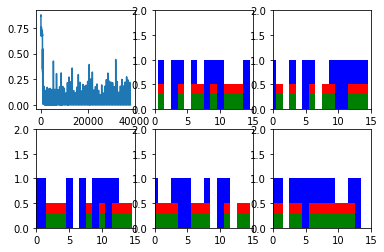

Step 400 Loss 6.72417e-05


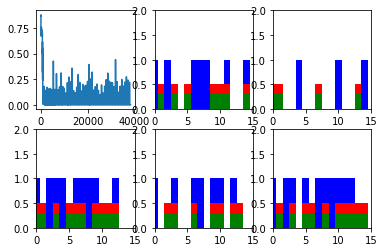

Step 500 Loss 6.52726e-05


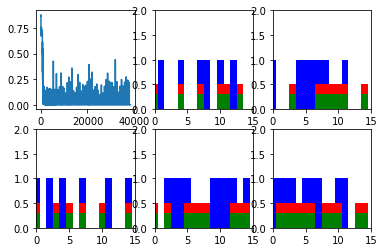

Step 600 Loss 6.72333e-05


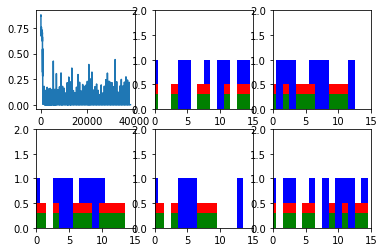

New data, epoch 58
Step 0 Loss 0.189318


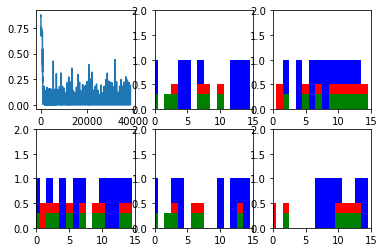

Step 100 Loss 6.14453e-05


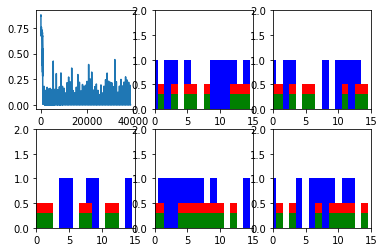

Step 200 Loss 9.40825e-05


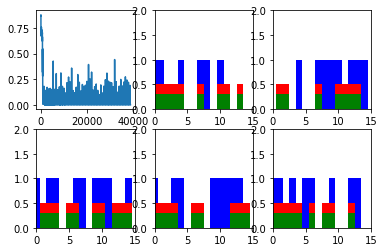

Step 300 Loss 8.17964e-05


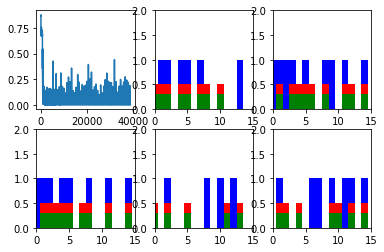

Step 400 Loss 7.19548e-05


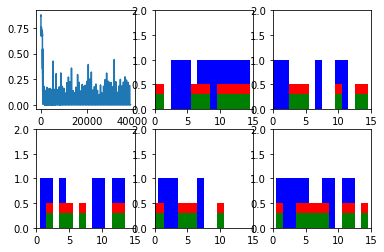

Step 500 Loss 7.2415e-05


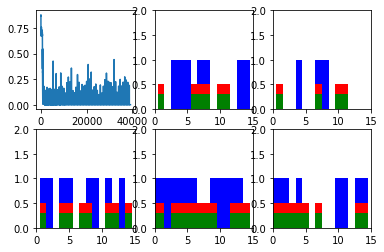

Step 600 Loss 7.16102e-05


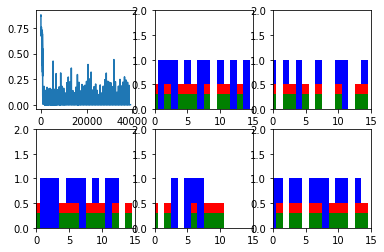

New data, epoch 59
Step 0 Loss 0.23289


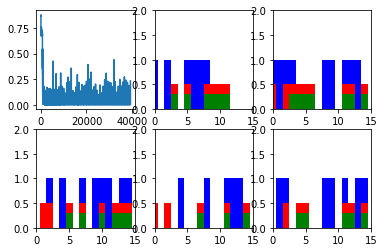

Step 100 Loss 6.36651e-05


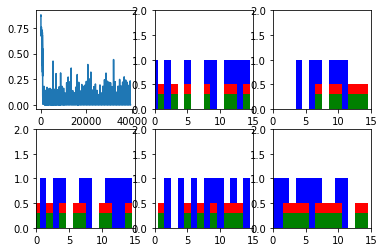

Step 200 Loss 5.37182e-05


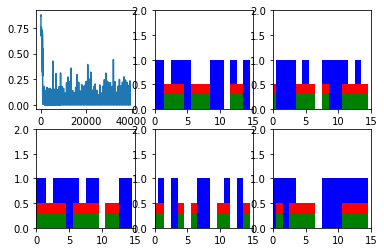

Step 300 Loss 7.44728e-05


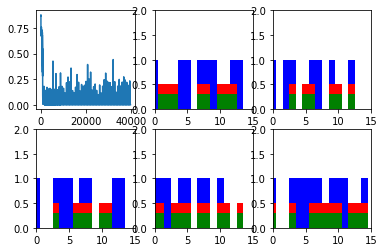

Step 400 Loss 7.26708e-05


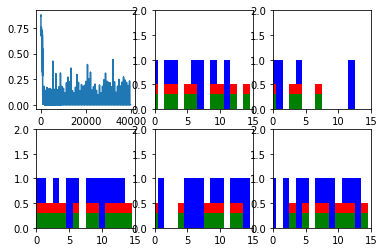

Step 500 Loss 6.17157e-05


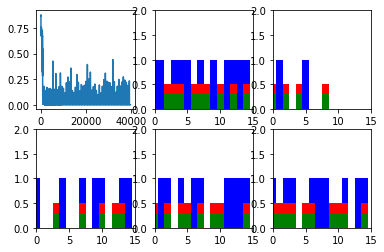

Step 600 Loss 6.42206e-05


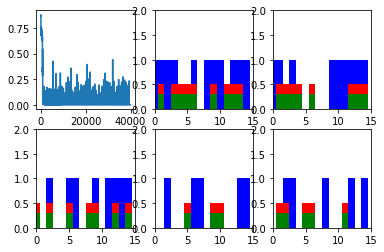

New data, epoch 60
Step 0 Loss 0.15406


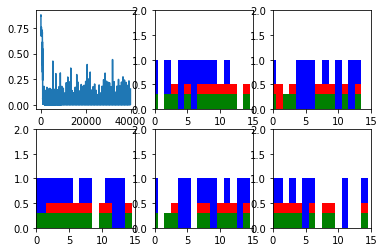

Step 100 Loss 6.75507e-05


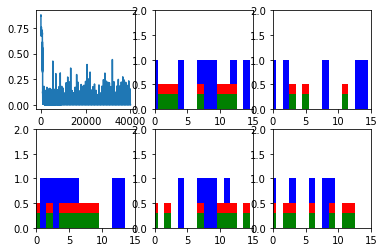

Step 200 Loss 6.42949e-05


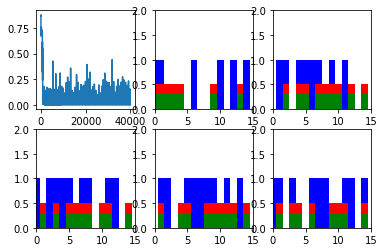

Step 300 Loss 6.02216e-05


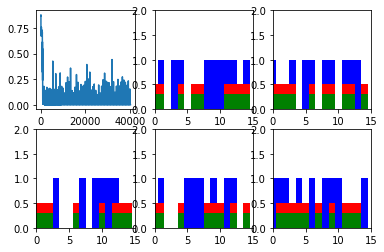

Step 400 Loss 6.17309e-05


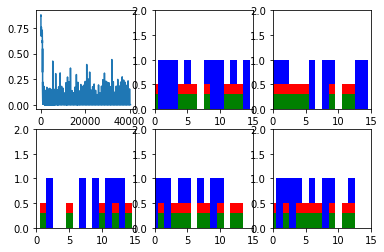

Step 500 Loss 5.67249e-05


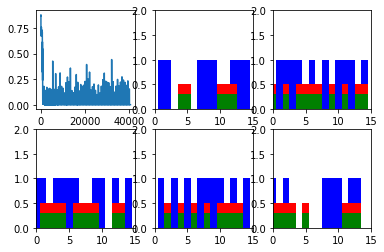

Step 600 Loss 7.00781e-05


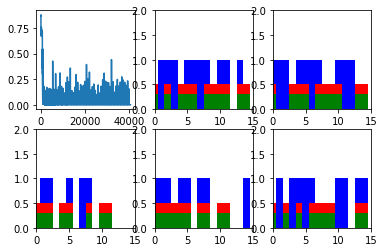

New data, epoch 61
Step 0 Loss 0.169499


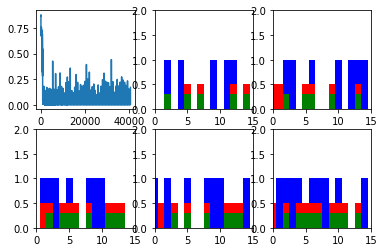

Step 100 Loss 6.98435e-05


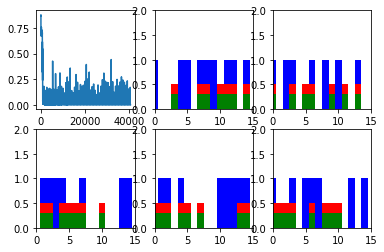

Step 200 Loss 7.76993e-05


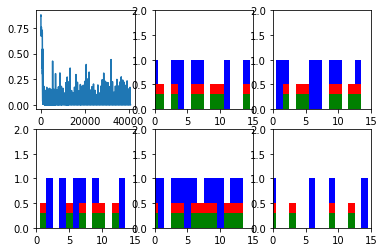

Step 300 Loss 6.59097e-05


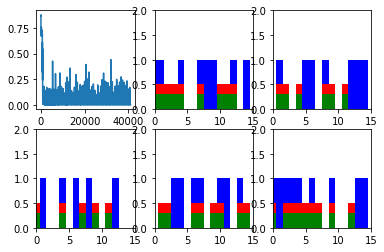

Step 400 Loss 6.41586e-05


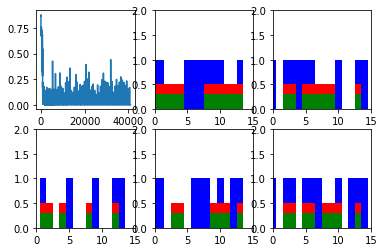

Step 500 Loss 6.61088e-05


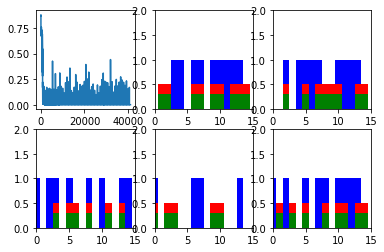

Step 600 Loss 6.80455e-05


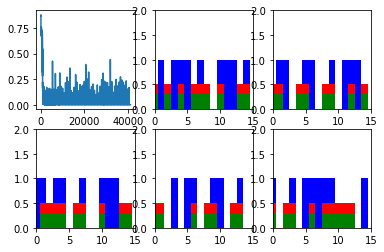

New data, epoch 62
Step 0 Loss 0.317753


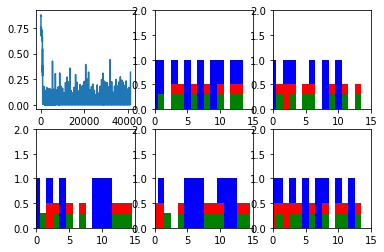

Step 100 Loss 5.88165e-05


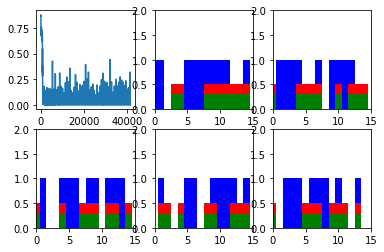

Step 200 Loss 5.22606e-05


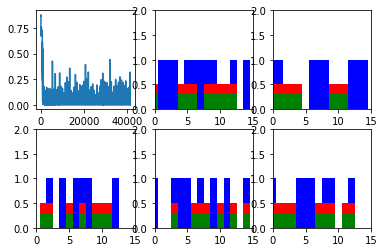

Step 300 Loss 5.32684e-05


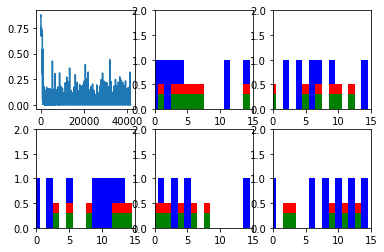

Step 400 Loss 5.8394e-05


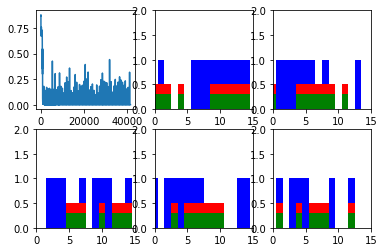

Step 500 Loss 6.50279e-05


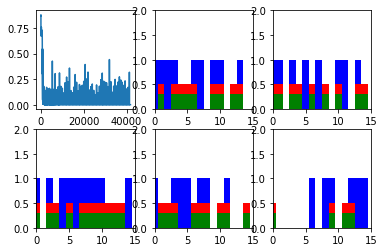

Step 600 Loss 6.34434e-05


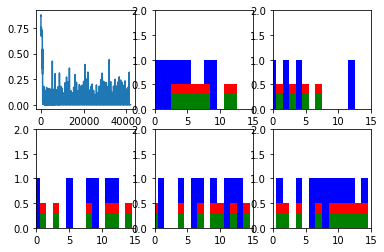

New data, epoch 63
Step 0 Loss 0.182924


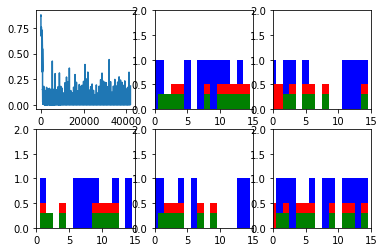

Step 100 Loss 6.22512e-05


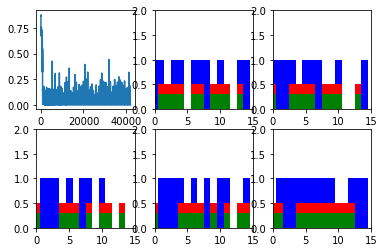

Step 200 Loss 7.18689e-05


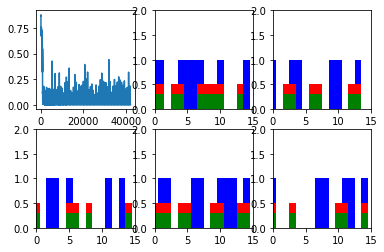

Step 300 Loss 7.15328e-05


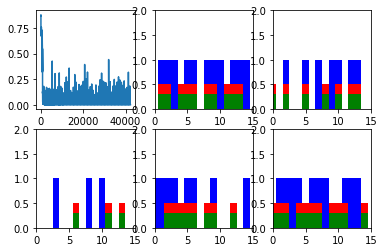

Step 400 Loss 6.3421e-05


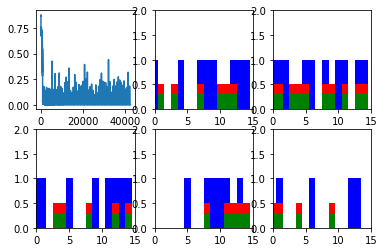

Step 500 Loss 5.94064e-05


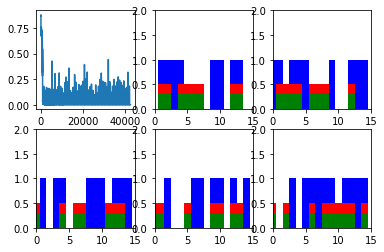

Step 600 Loss 6.37227e-05


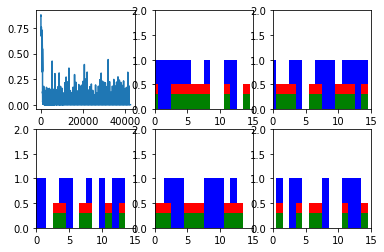

New data, epoch 64
Step 0 Loss 0.171795


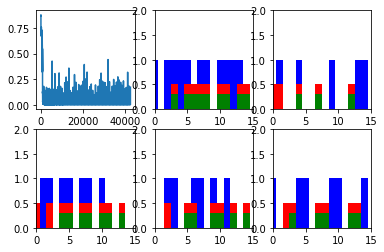

Step 100 Loss 6.64052e-05


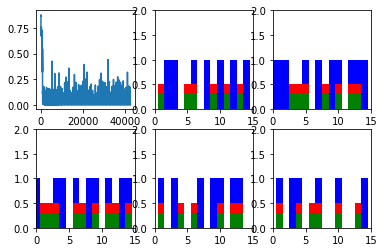

Step 200 Loss 5.10464e-05


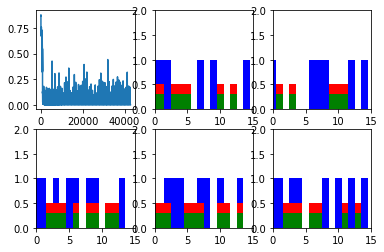

Step 300 Loss 5.58861e-05


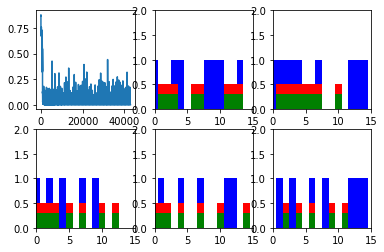

Step 400 Loss 6.02026e-05


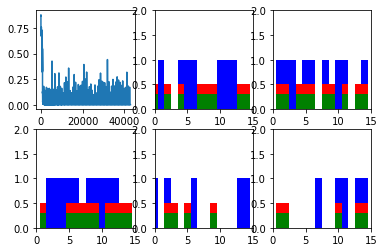

Step 500 Loss 5.55333e-05


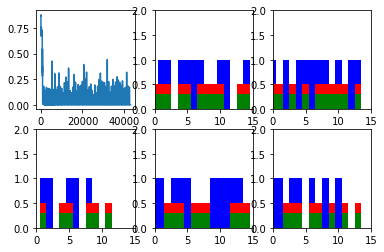

Step 600 Loss 6.50327e-05


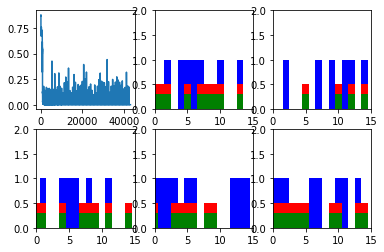

New data, epoch 65
Step 0 Loss 0.141051


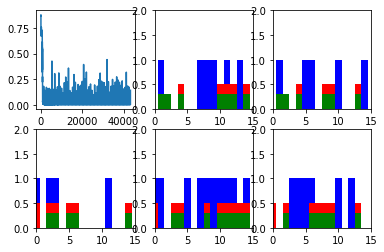

Step 100 Loss 6.08857e-05


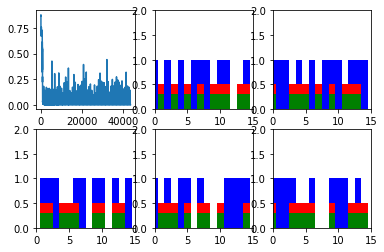

Step 200 Loss 6.09975e-05


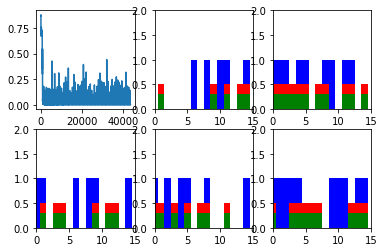

Step 300 Loss 7.29405e-05


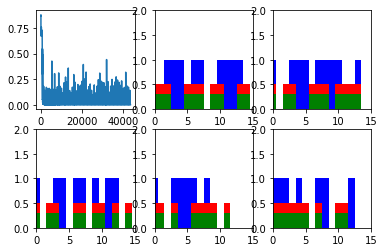

Step 400 Loss 5.48053e-05


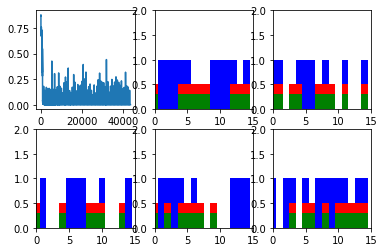

Step 500 Loss 5.49214e-05


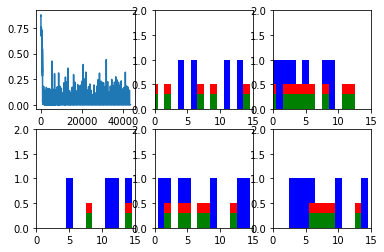

Step 600 Loss 6.58303e-05


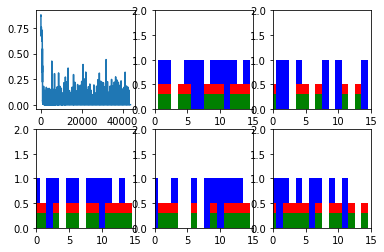

New data, epoch 66
Step 0 Loss 0.242629


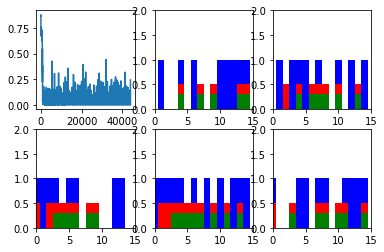

Step 100 Loss 6.36733e-05


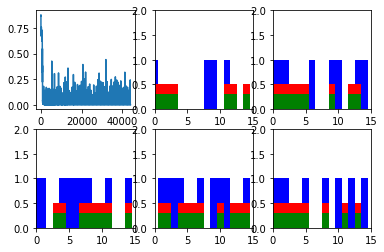

Step 200 Loss 5.79948e-05


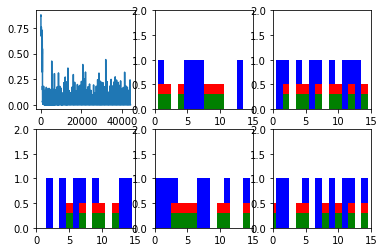

Step 300 Loss 5.7278e-05


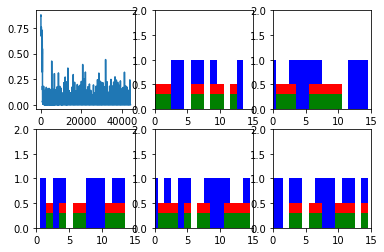

Step 400 Loss 5.63118e-05


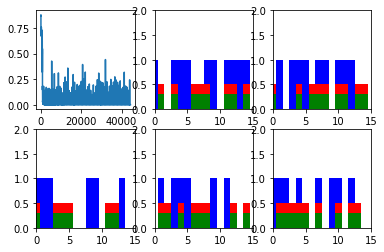

Step 500 Loss 5.96932e-05


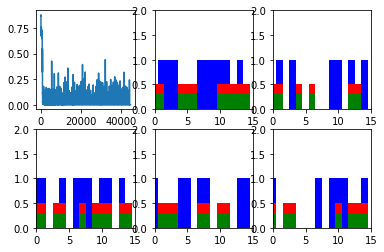

Step 600 Loss 6.24698e-05


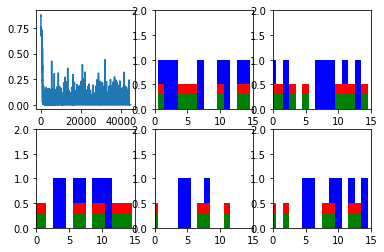

New data, epoch 67
Step 0 Loss 0.177224


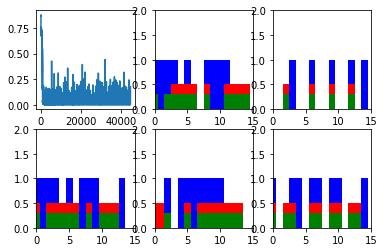

Step 100 Loss 5.8785e-05


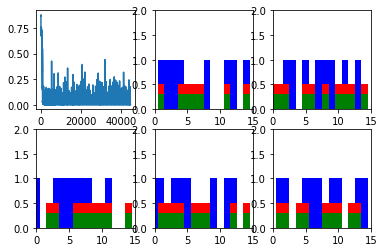

Step 200 Loss 6.30334e-05


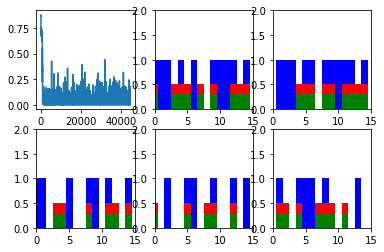

Step 300 Loss 5.17268e-05


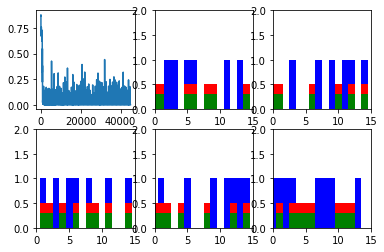

Step 400 Loss 5.30285e-05


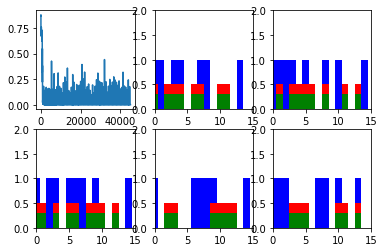

Step 500 Loss 5.86229e-05


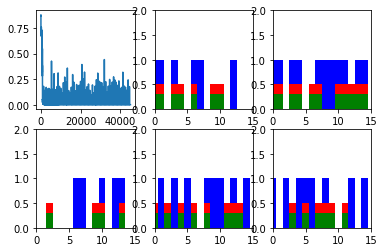

Step 600 Loss 5.98117e-05


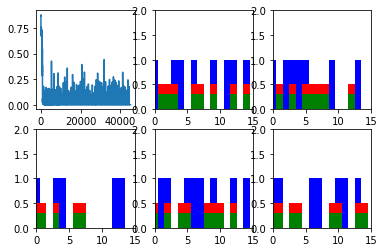

New data, epoch 68
Step 0 Loss 0.181811


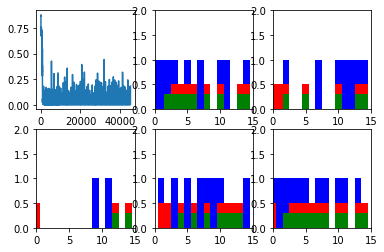

Step 100 Loss 5.72022e-05


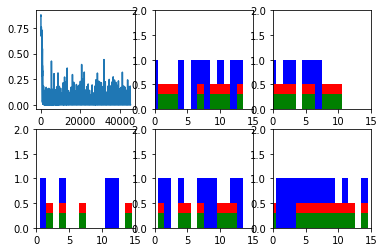

Step 200 Loss 4.66981e-05


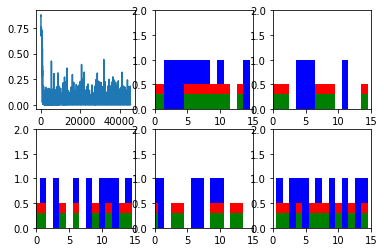

Step 300 Loss 6.83195e-05


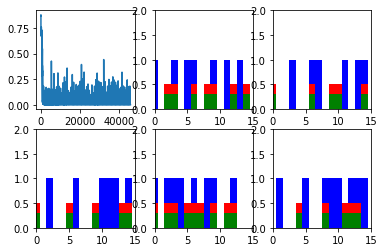

Step 400 Loss 5.42063e-05


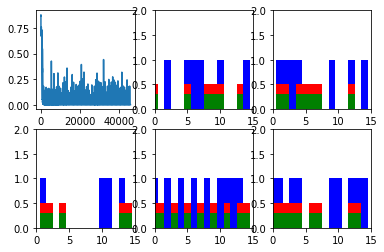

Step 500 Loss 6.61342e-05


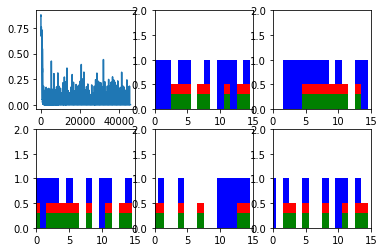

Step 600 Loss 5.53744e-05


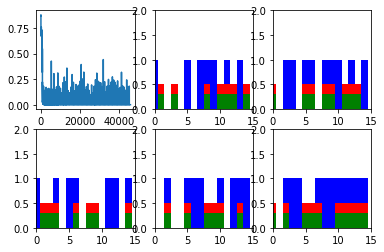

New data, epoch 69
Step 0 Loss 0.162587


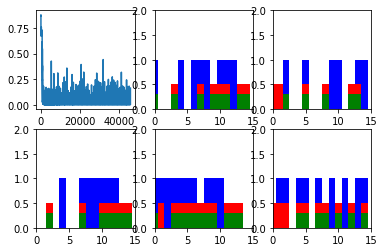

Step 100 Loss 5.13057e-05


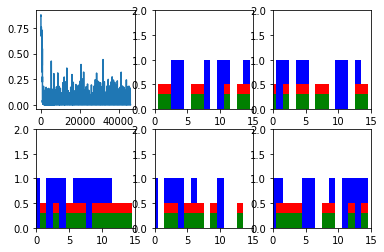

Step 200 Loss 6.05985e-05


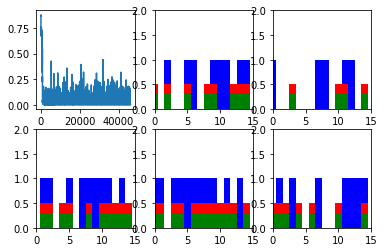

Step 300 Loss 5.17188e-05


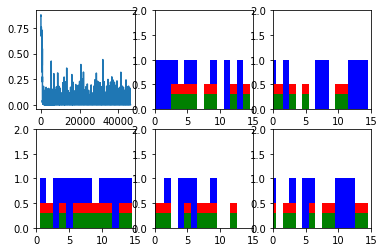

Step 400 Loss 5.76598e-05


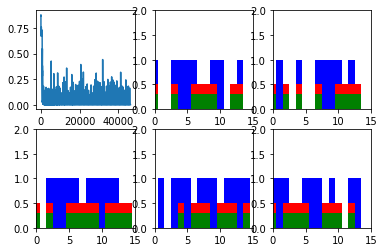

Step 500 Loss 6.39392e-05


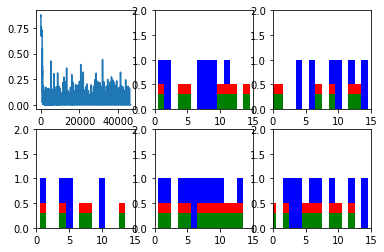

Step 600 Loss 5.78103e-05


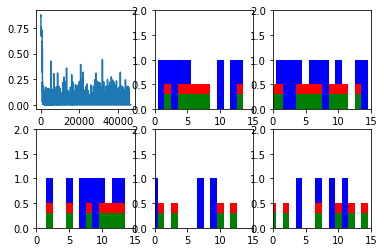

New data, epoch 70
Step 0 Loss 0.152598


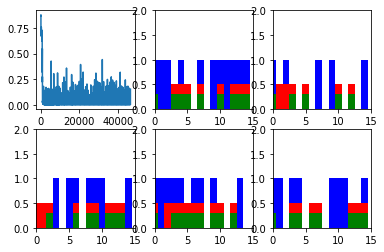

Step 100 Loss 5.82316e-05


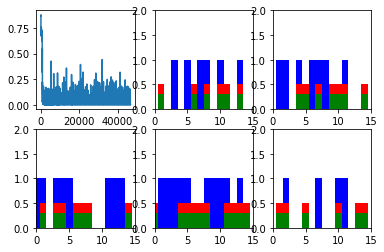

Step 200 Loss 5.67999e-05


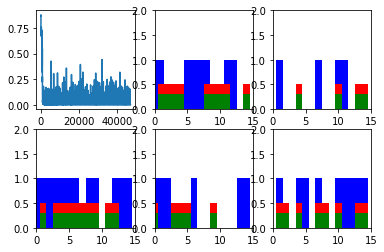

Step 300 Loss 5.69144e-05


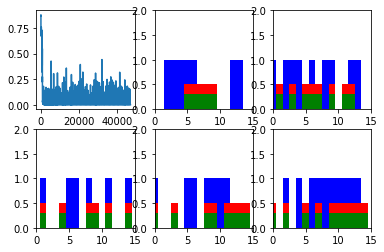

Step 400 Loss 5.77519e-05


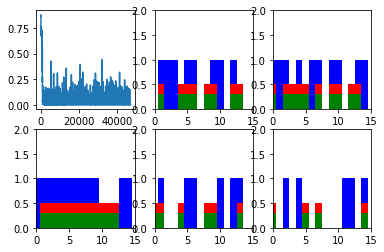

Step 500 Loss 6.28314e-05


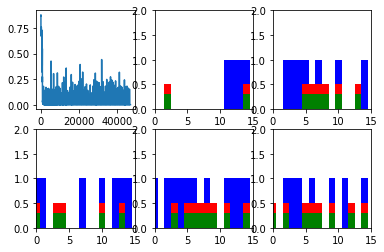

Step 600 Loss 5.33e-05


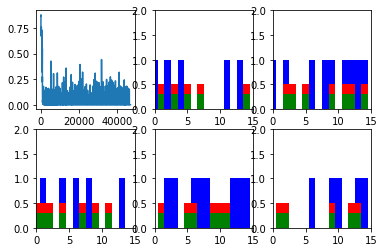

New data, epoch 71
Step 0 Loss 0.181314


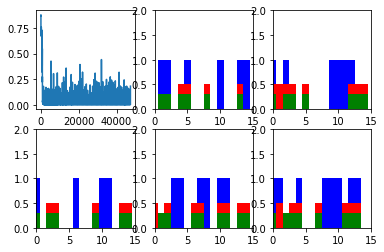

Step 100 Loss 5.86799e-05


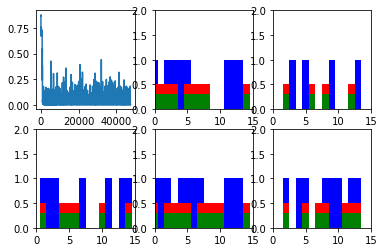

Step 200 Loss 6.97234e-05


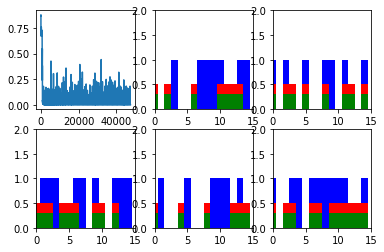

Step 300 Loss 7.03265e-05


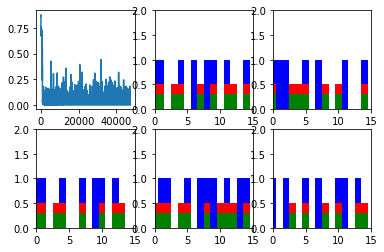

Step 400 Loss 5.61054e-05


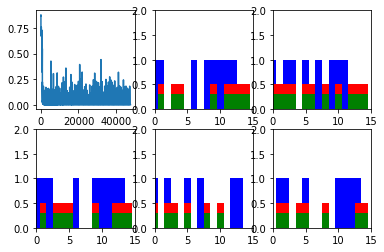

Step 500 Loss 5.75086e-05


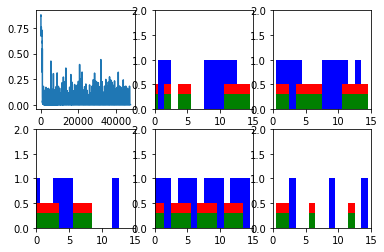

Step 600 Loss 6.00974e-05


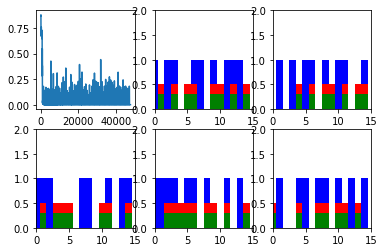

New data, epoch 72
Step 0 Loss 0.137125


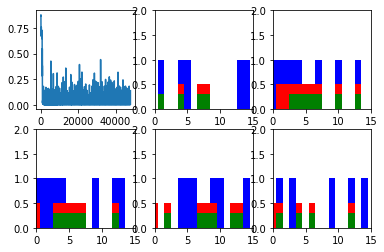

Step 100 Loss 5.52435e-05


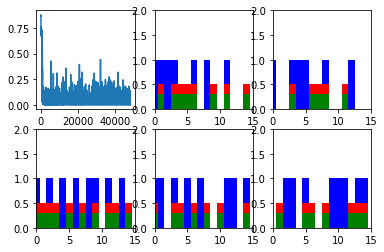

Step 200 Loss 6.37881e-05


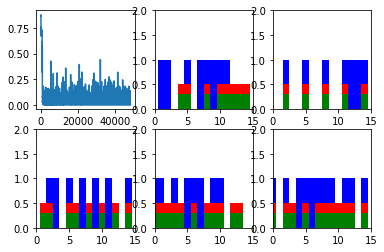

Step 300 Loss 5.33558e-05


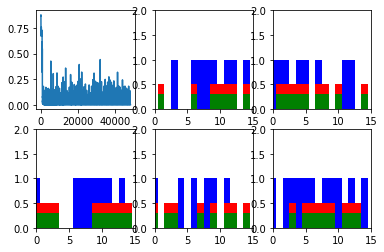

Step 400 Loss 5.85287e-05


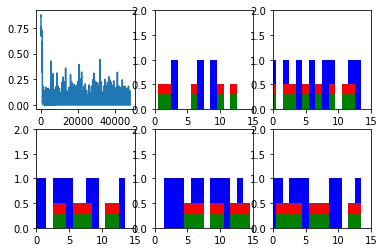

Step 500 Loss 5.25801e-05


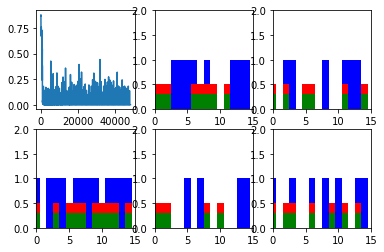

Step 600 Loss 5.8397e-05


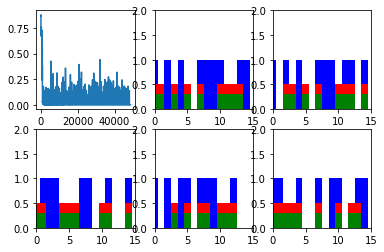

New data, epoch 73
Step 0 Loss 0.155523


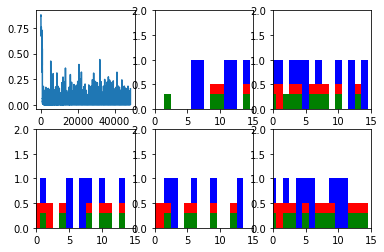

Step 100 Loss 5.77138e-05


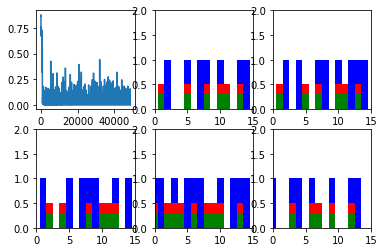

Step 200 Loss 5.49914e-05


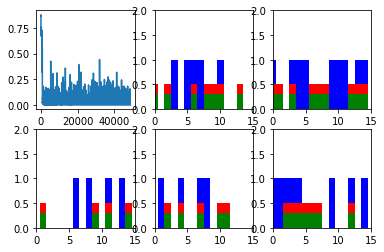

Step 300 Loss 6.12095e-05


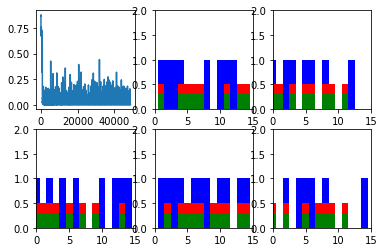

Step 400 Loss 5.39534e-05


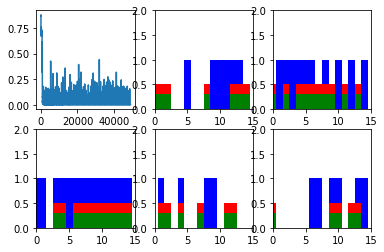

Step 500 Loss 5.22148e-05


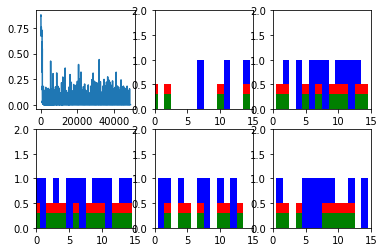

Step 600 Loss 5.78918e-05


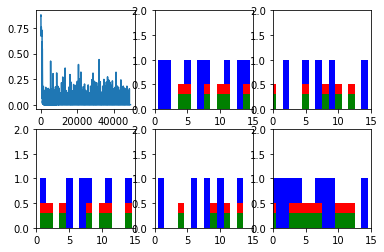

New data, epoch 74
Step 0 Loss 0.159781


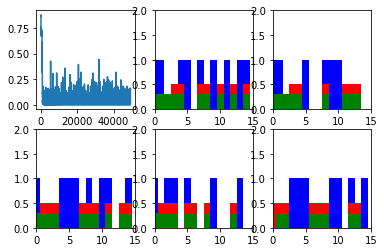

Step 100 Loss 5.36467e-05


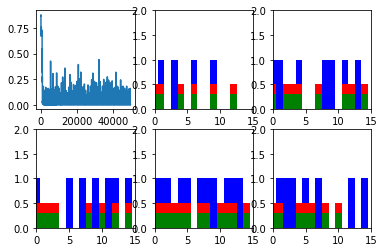

Step 200 Loss 4.77281e-05


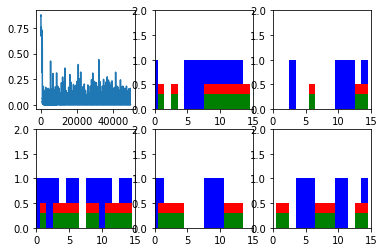

Step 300 Loss 5.22067e-05


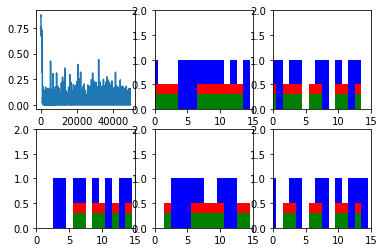

Step 400 Loss 6.14648e-05


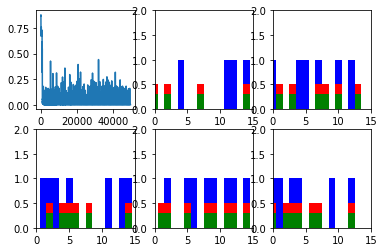

Step 500 Loss 5.99358e-05


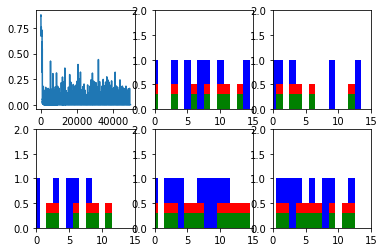

Step 600 Loss 4.96353e-05


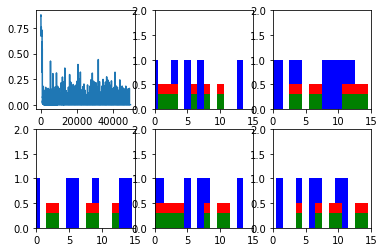

New data, epoch 75
Step 0 Loss 0.122218


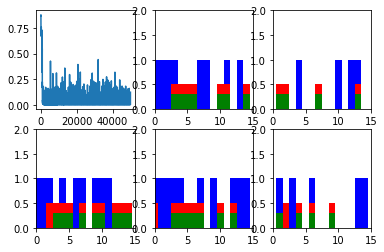

Step 100 Loss 5.18555e-05


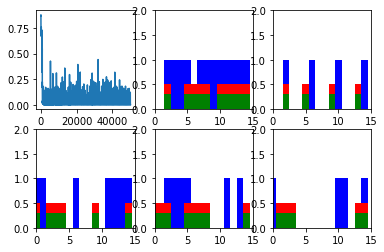

Step 200 Loss 5.52293e-05


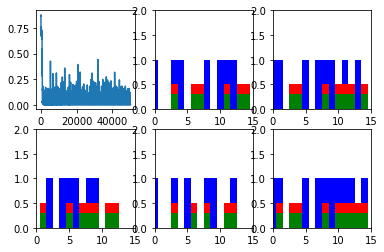

Step 300 Loss 5.27551e-05


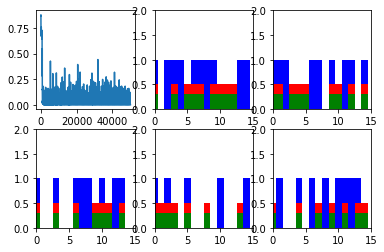

Step 400 Loss 5.56254e-05


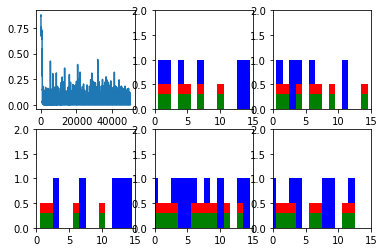

Step 500 Loss 4.79296e-05


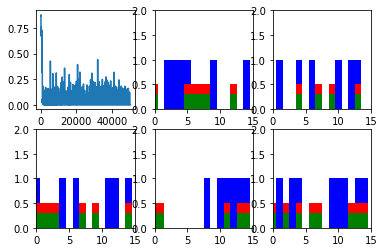

Step 600 Loss 5.32128e-05


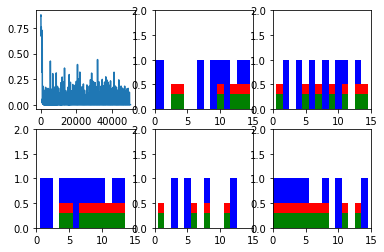

New data, epoch 76
Step 0 Loss 0.229329


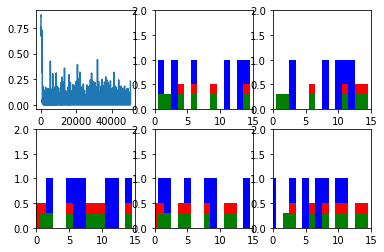

Step 100 Loss 5.10624e-05


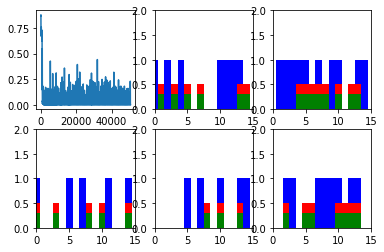

Step 200 Loss 7.53546e-05


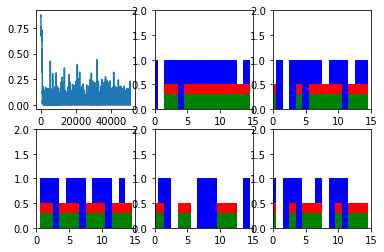

Step 300 Loss 6.11762e-05


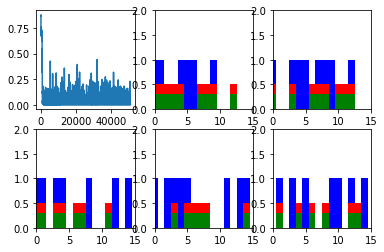

Step 400 Loss 8.41734e-05


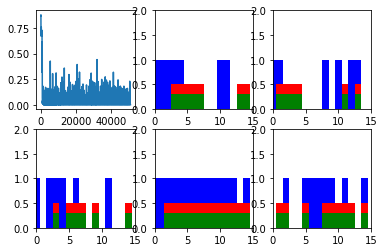

Step 500 Loss 6.44041e-05


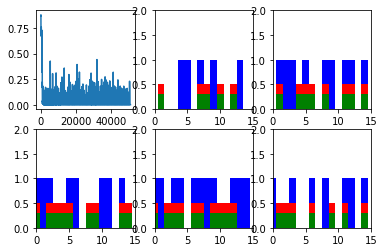

Step 600 Loss 5.41694e-05


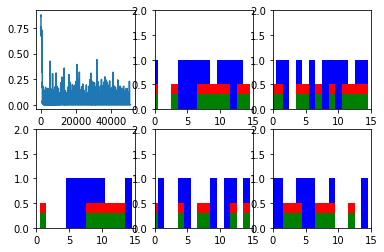

New data, epoch 77
Step 0 Loss 0.215556


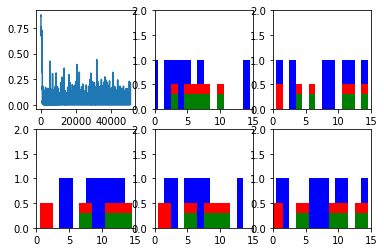

Step 100 Loss 4.85274e-05


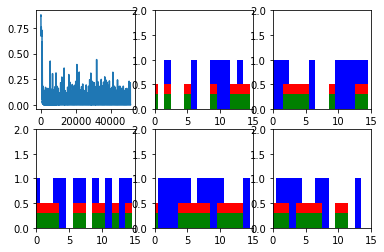

Step 200 Loss 5.10911e-05


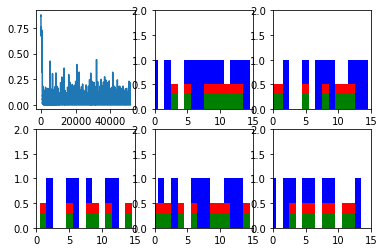

Step 300 Loss 5.17078e-05


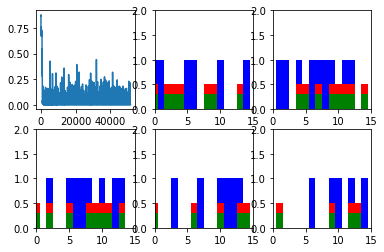

Step 400 Loss 4.1512e-05


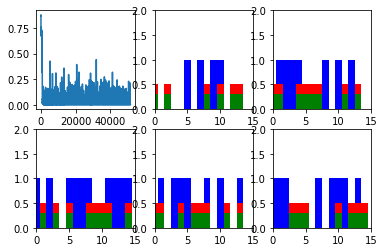

Step 500 Loss 6.12867e-05


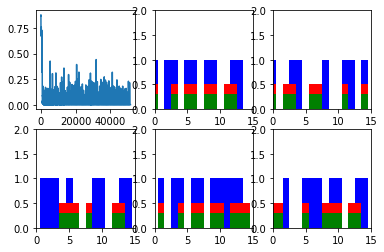

Step 600 Loss 6.21527e-05


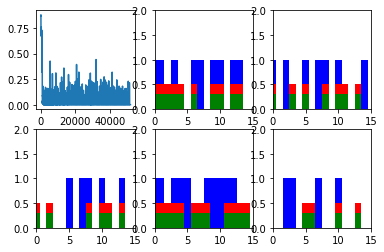

New data, epoch 78
Step 0 Loss 0.113159


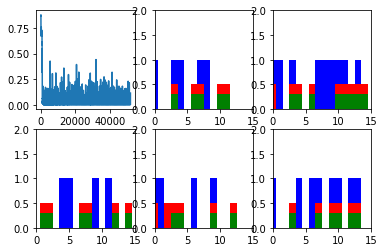

Step 100 Loss 4.78139e-05


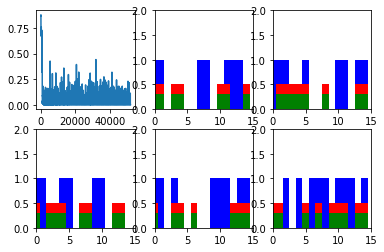

Step 200 Loss 4.76947e-05


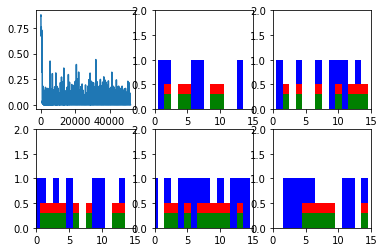

Step 300 Loss 5.28886e-05


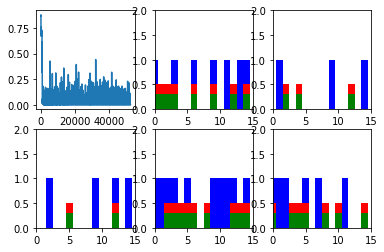

Step 400 Loss 5.29347e-05


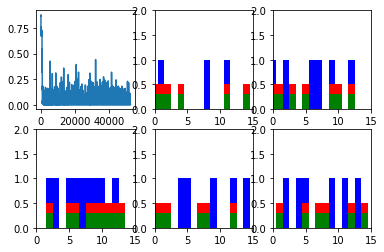

Step 500 Loss 4.77821e-05


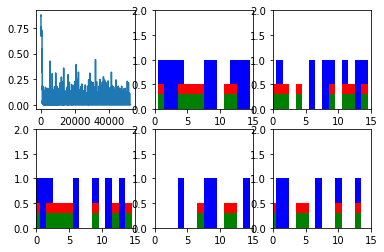

Step 600 Loss 4.84688e-05


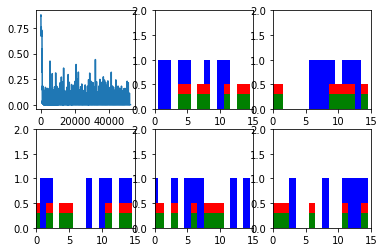

New data, epoch 79
Step 0 Loss 0.214013


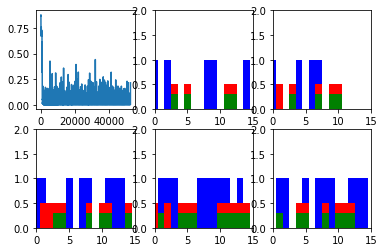

Step 100 Loss 4.08191e-05


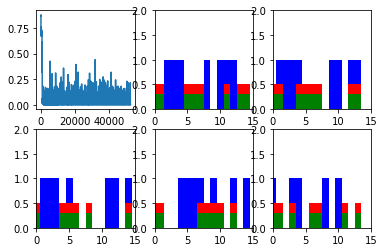

Step 200 Loss 5.01089e-05


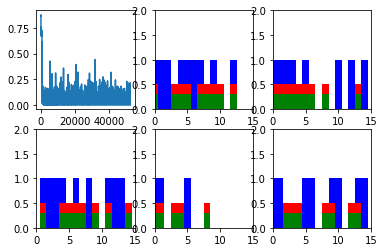

Step 300 Loss 5.63933e-05


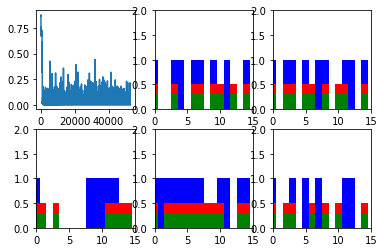

Step 400 Loss 4.35258e-05


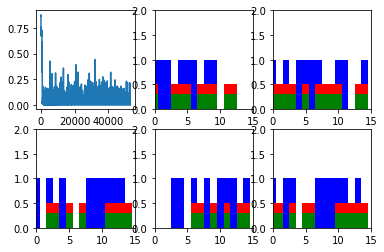

Step 500 Loss 4.8893e-05


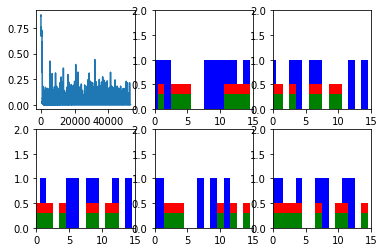

Step 600 Loss 5.26724e-05


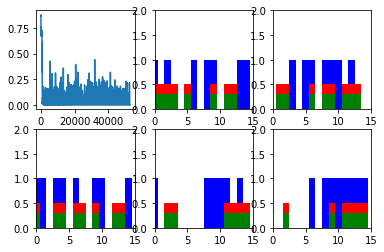

New data, epoch 80
Step 0 Loss 0.158547


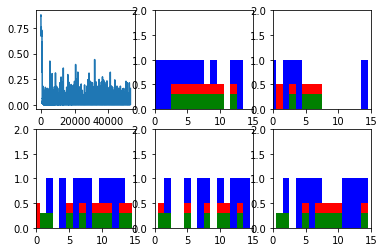

Step 100 Loss 6.54035e-05


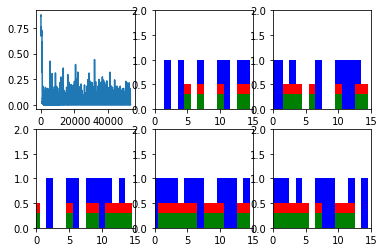

Step 200 Loss 4.98765e-05


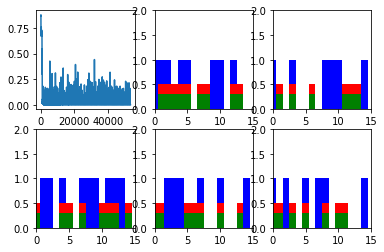

Step 300 Loss 4.81952e-05


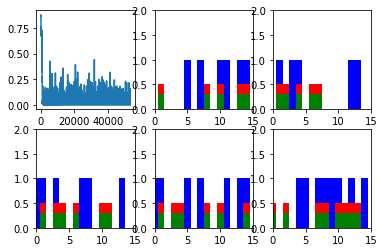

Step 400 Loss 4.59775e-05


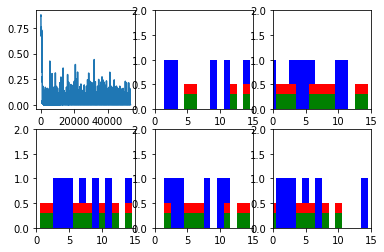

Step 500 Loss 5.39492e-05


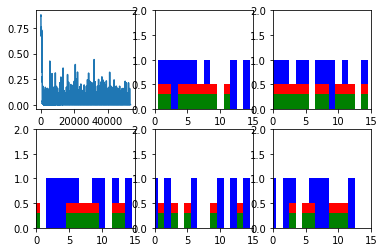

Step 600 Loss 5.46474e-05


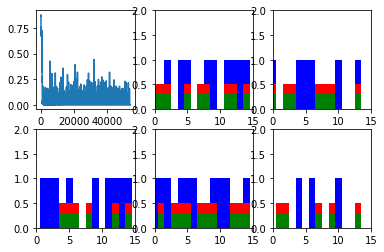

New data, epoch 81
Step 0 Loss 0.170667


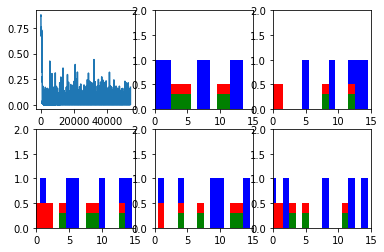

Step 100 Loss 5.01804e-05


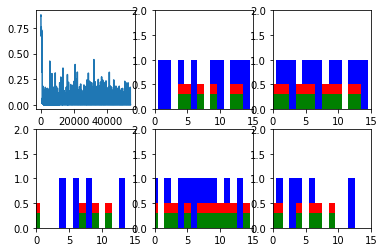

Step 200 Loss 5.51865e-05


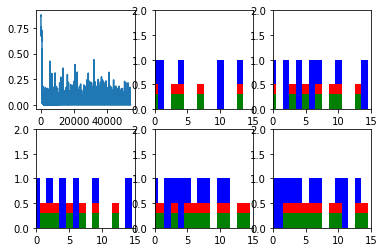

Step 300 Loss 4.34684e-05


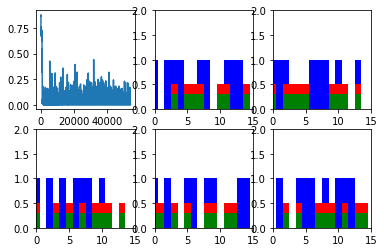

Step 400 Loss 4.8847e-05


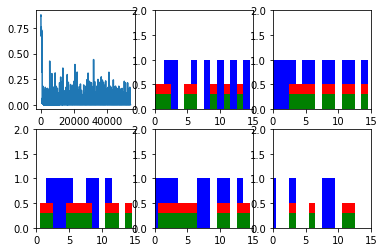

Step 500 Loss 4.99421e-05


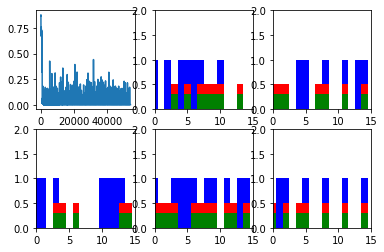

Step 600 Loss 4.30155e-05


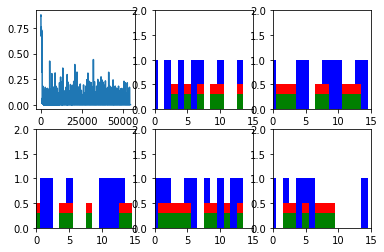

New data, epoch 82
Step 0 Loss 0.132532


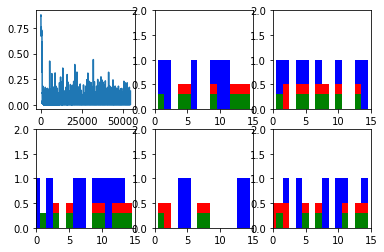

Step 100 Loss 4.93014e-05


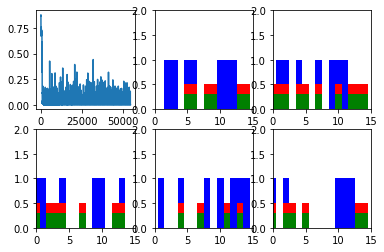

Step 200 Loss 5.05858e-05


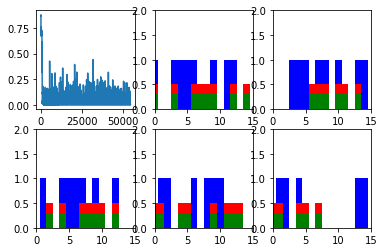

Step 300 Loss 4.14134e-05


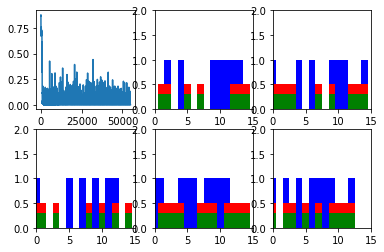

Step 400 Loss 4.98801e-05


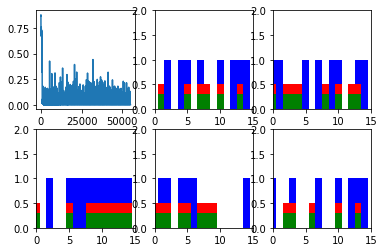

Step 500 Loss 5.1716e-05


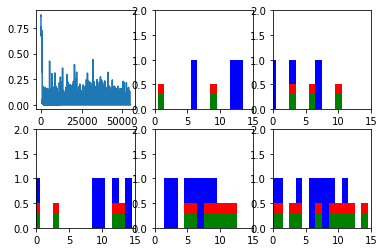

Step 600 Loss 5.08367e-05


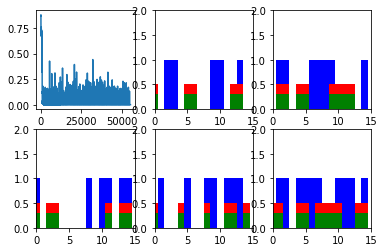

New data, epoch 83
Step 0 Loss 0.159949


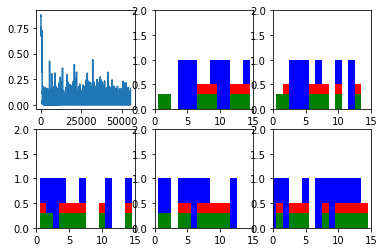

Step 100 Loss 5.22763e-05


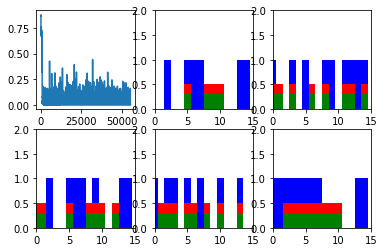

Step 200 Loss 5.10957e-05


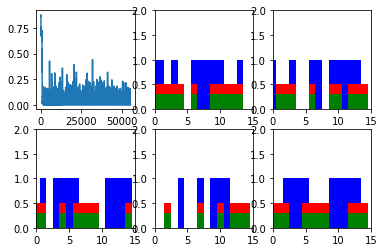

Step 300 Loss 5.73846e-05


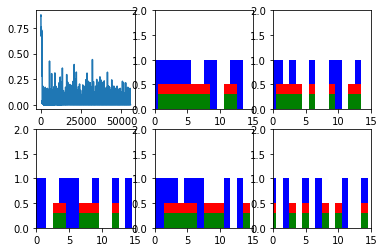

Step 400 Loss 4.96115e-05


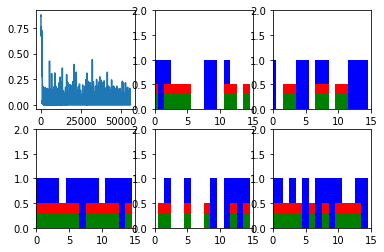

Step 500 Loss 5.31826e-05


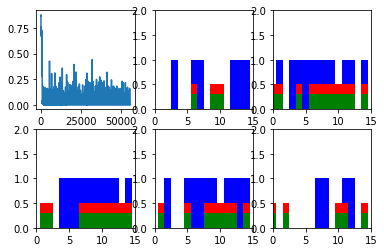

Step 600 Loss 4.44759e-05


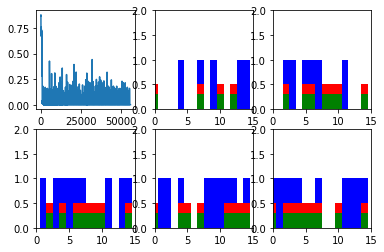

New data, epoch 84
Step 0 Loss 0.192934


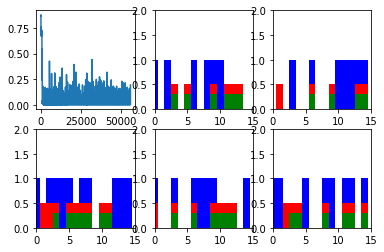

Step 100 Loss 4.32238e-05


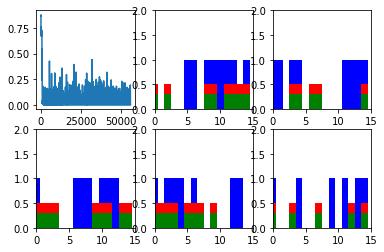

Step 200 Loss 3.61938e-05


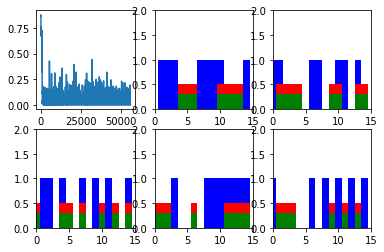

Step 300 Loss 4.98324e-05


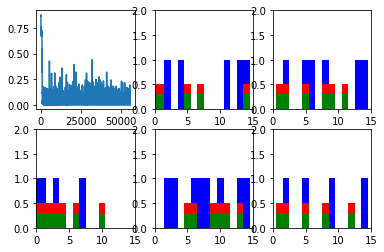

Step 400 Loss 5.34938e-05


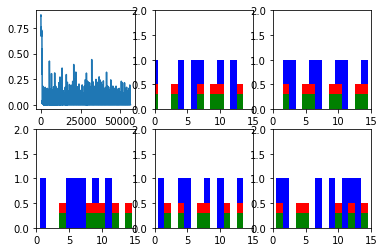

Step 500 Loss 4.77708e-05


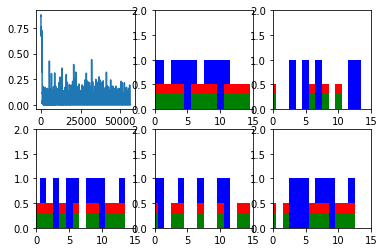

Step 600 Loss 4.62148e-05


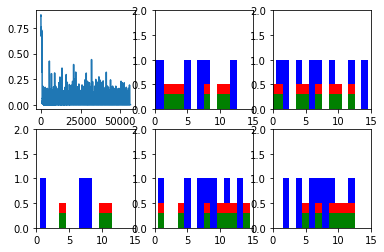

New data, epoch 85
Step 0 Loss 0.137991


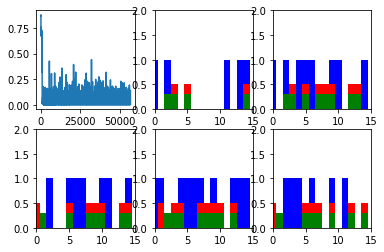

Step 100 Loss 5.79121e-05


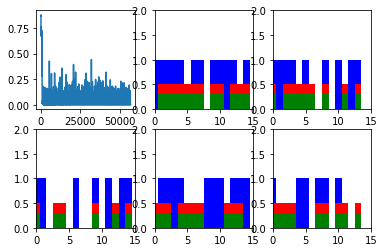

Step 200 Loss 4.76159e-05


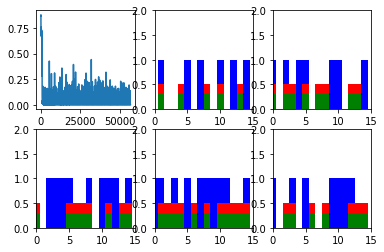

Step 300 Loss 6.32287e-05


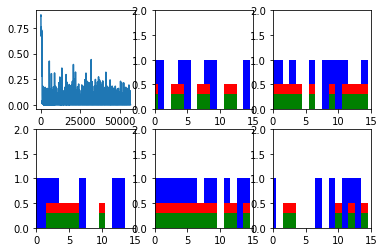

Step 400 Loss 5.35836e-05


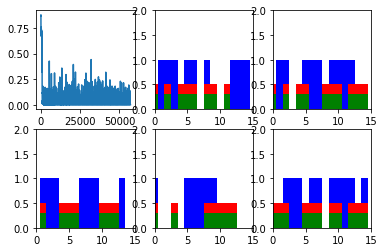

Step 500 Loss 6.62668e-05


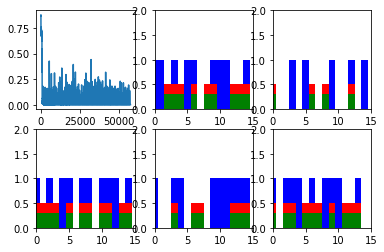

Step 600 Loss 3.93487e-05


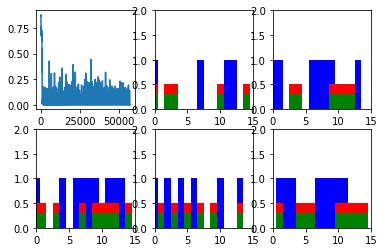

New data, epoch 86
Step 0 Loss 0.245654


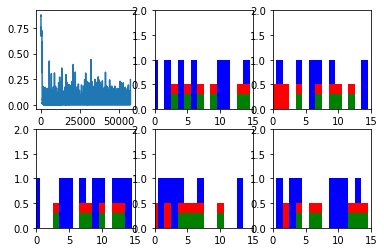

Step 100 Loss 5.10414e-05


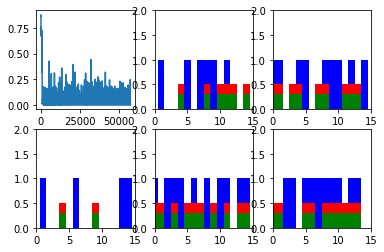

Step 200 Loss 4.61355e-05


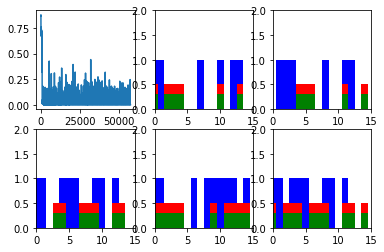

Step 300 Loss 4.49674e-05


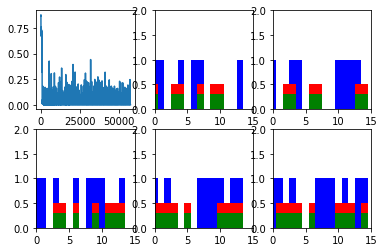

Step 400 Loss 4.7677e-05


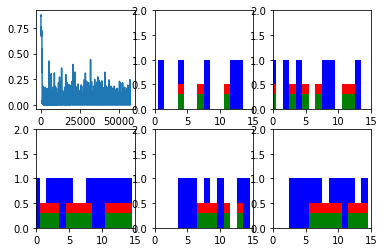

Step 500 Loss 4.54425e-05


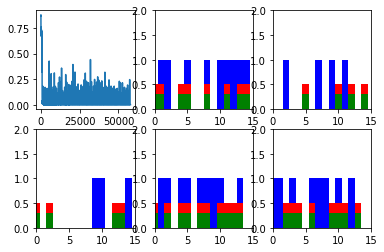

Step 600 Loss 4.72895e-05


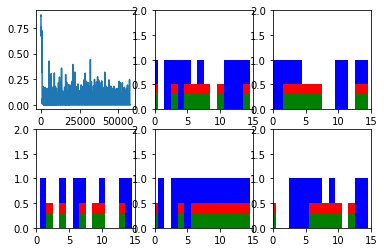

New data, epoch 87
Step 0 Loss 0.176447


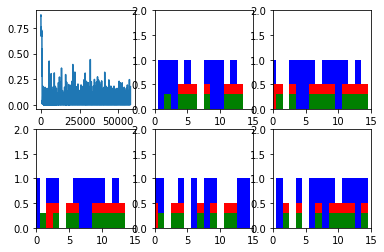

Step 100 Loss 3.94125e-05


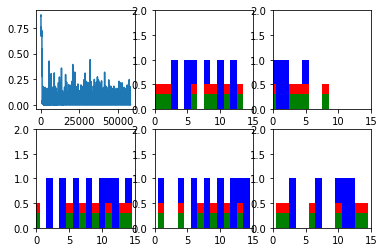

Step 200 Loss 4.54935e-05


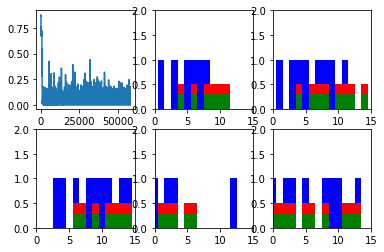

Step 300 Loss 4.16615e-05


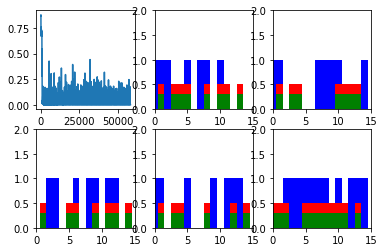

Step 400 Loss 4.55665e-05


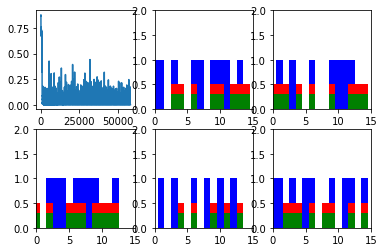

Step 500 Loss 4.62308e-05


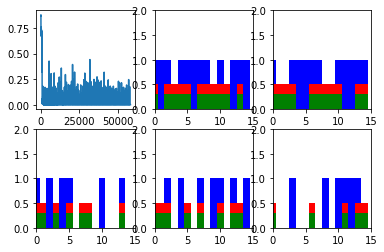

Step 600 Loss 4.00514e-05


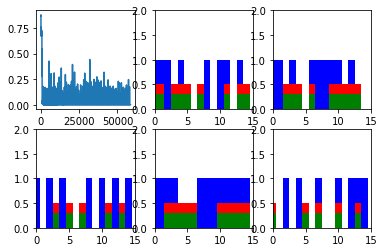

New data, epoch 88
Step 0 Loss 0.168869


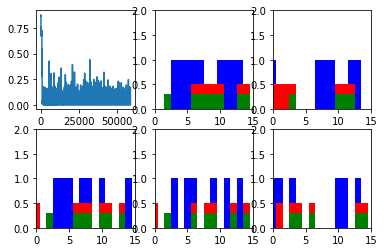

Step 100 Loss 4.52978e-05


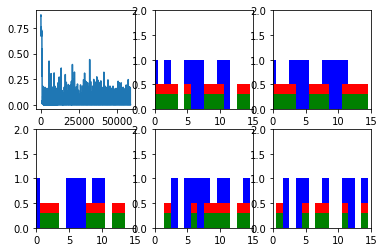

Step 200 Loss 4.20761e-05


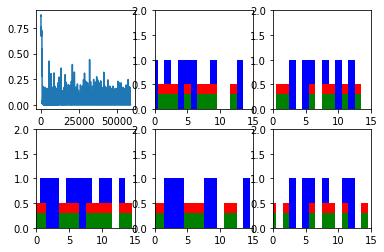

Step 300 Loss 4.30854e-05


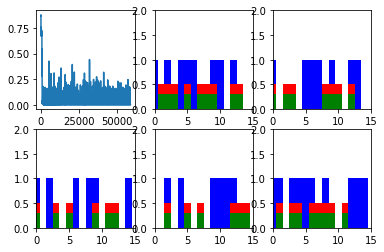

Step 400 Loss 4.62404e-05


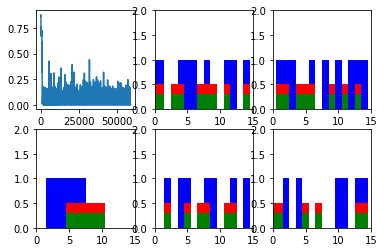

Step 500 Loss 3.87149e-05


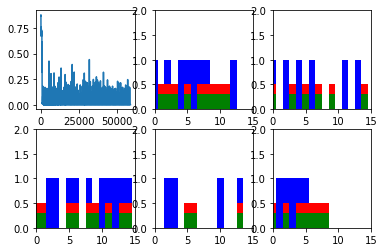

Step 600 Loss 4.17519e-05


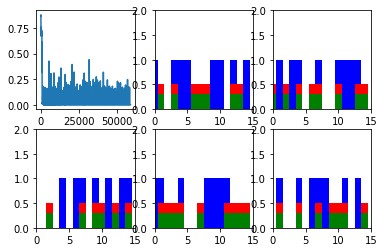

New data, epoch 89
Step 0 Loss 0.156847


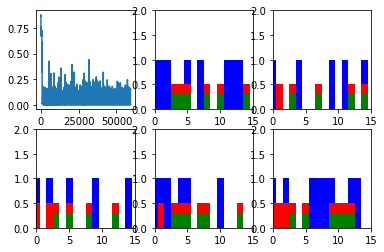

Step 100 Loss 5.46373e-05


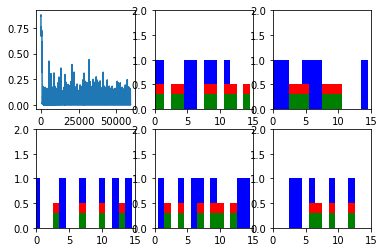

Step 200 Loss 4.08126e-05


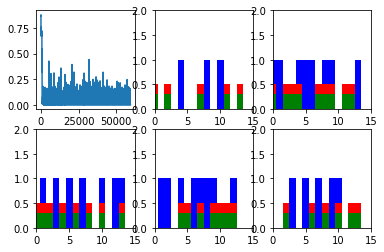

Step 300 Loss 4.89913e-05


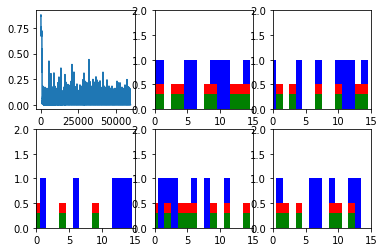

Step 400 Loss 4.19444e-05


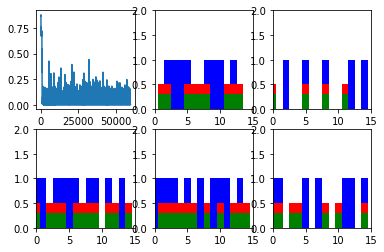

Step 500 Loss 4.64611e-05


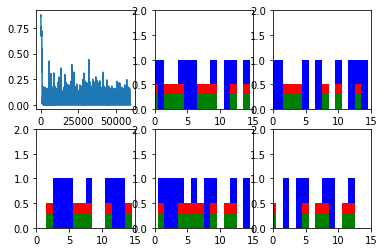

Step 600 Loss 4.30456e-05


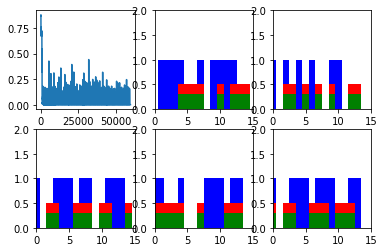

New data, epoch 90
Step 0 Loss 0.177555


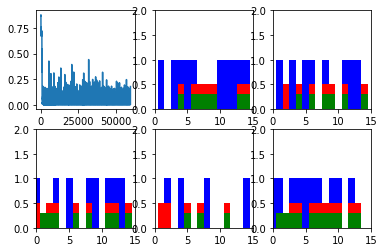

Step 100 Loss 3.96732e-05


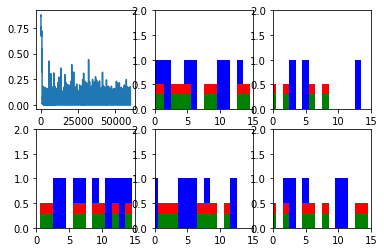

Step 200 Loss 4.11258e-05


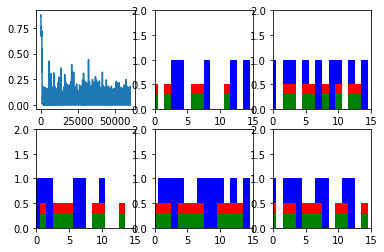

Step 300 Loss 4.25117e-05


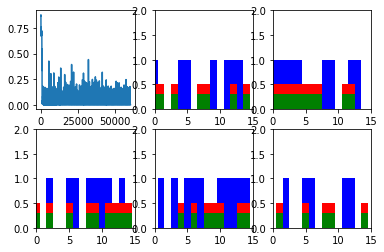

Step 400 Loss 3.76468e-05


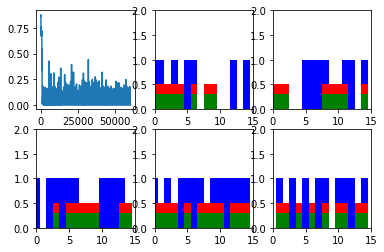

Step 500 Loss 3.84796e-05


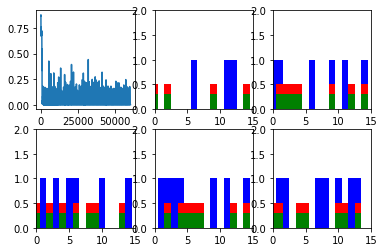

Step 600 Loss 4.50322e-05


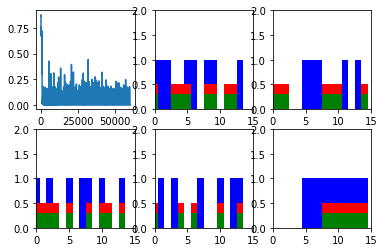

New data, epoch 91
Step 0 Loss 0.145964


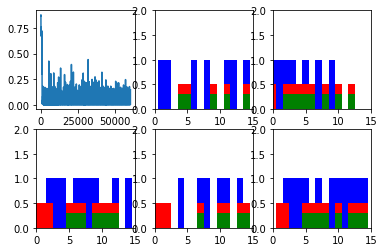

Step 100 Loss 4.32921e-05


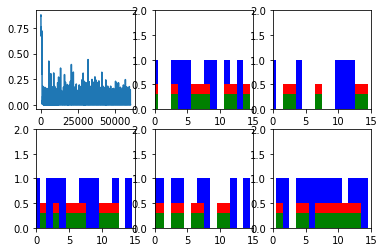

Step 200 Loss 4.10751e-05


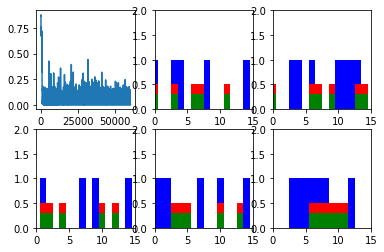

Step 300 Loss 4.33365e-05


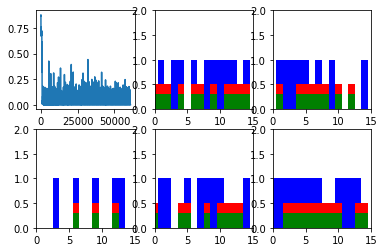

Step 400 Loss 3.79584e-05


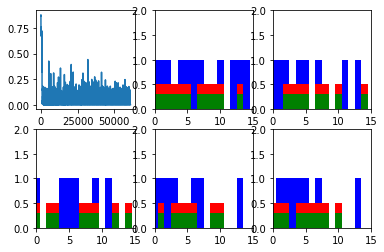

Step 500 Loss 4.93246e-05


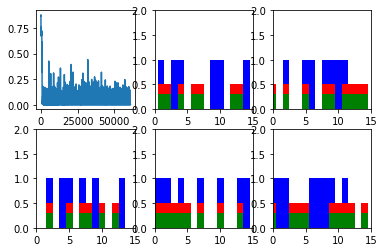

Step 600 Loss 4.6096e-05


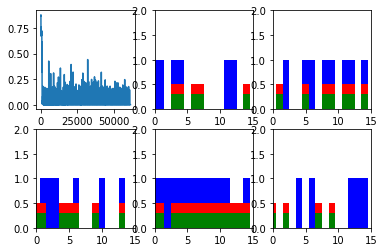

New data, epoch 92
Step 0 Loss 0.202699


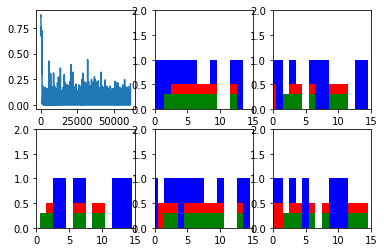

Step 100 Loss 4.32795e-05


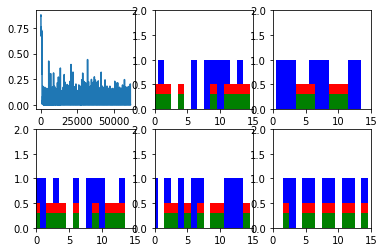

Step 200 Loss 5.99746e-05


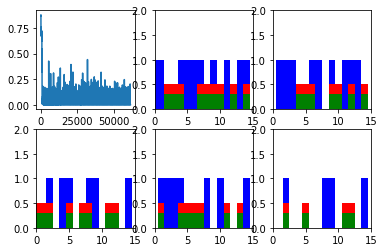

Step 300 Loss 4.08889e-05


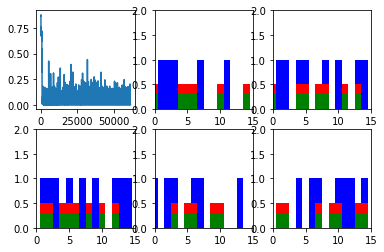

Step 400 Loss 4.53504e-05


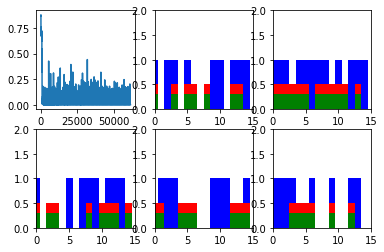

Step 500 Loss 4.28534e-05


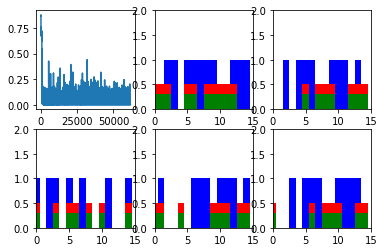

Step 600 Loss 4.34319e-05


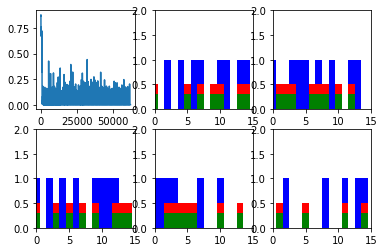

New data, epoch 93
Step 0 Loss 0.213539


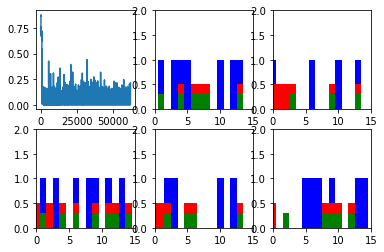

Step 100 Loss 4.05474e-05


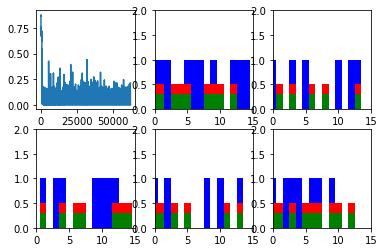

Step 200 Loss 4.21352e-05


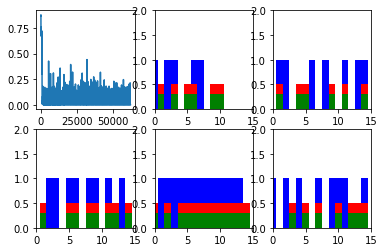

Step 300 Loss 3.94412e-05


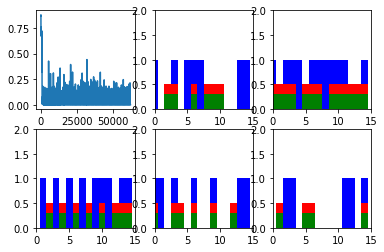

Step 400 Loss 4.48975e-05


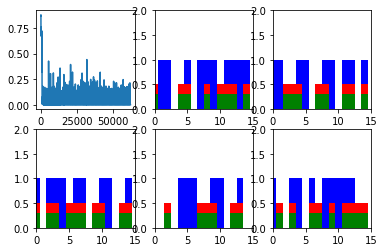

Step 500 Loss 3.92663e-05


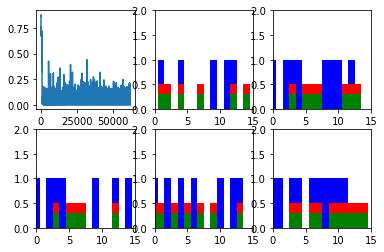

Step 600 Loss 4.06538e-05


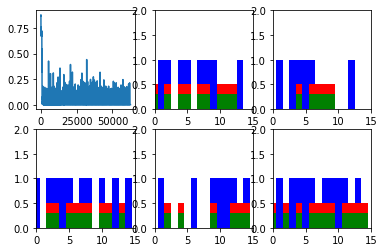

New data, epoch 94
Step 0 Loss 0.218116


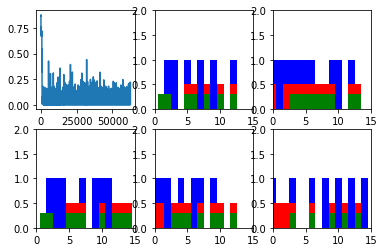

Step 100 Loss 4.04901e-05


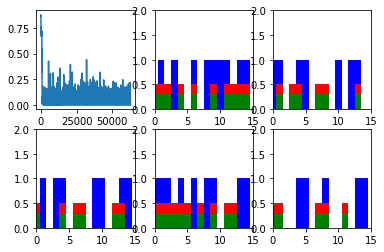

Step 200 Loss 4.6884e-05


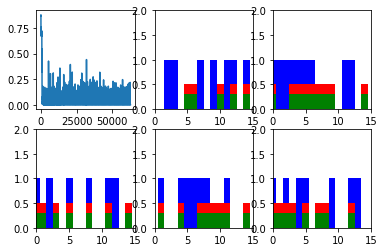

Step 300 Loss 4.3923e-05


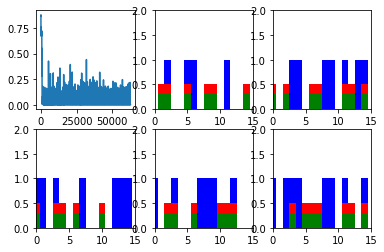

Step 400 Loss 3.61066e-05


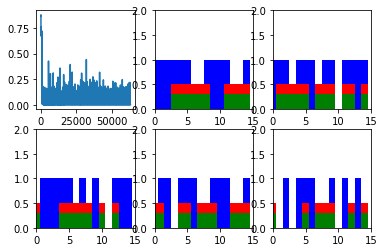

Step 500 Loss 3.7812e-05


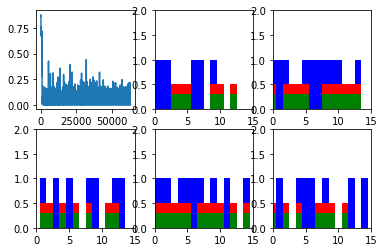

Step 600 Loss 3.68995e-05


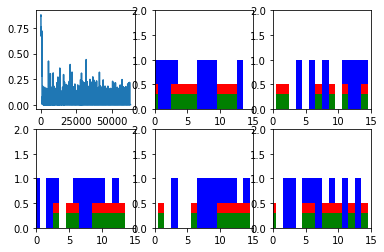

New data, epoch 95
Step 0 Loss 0.176206


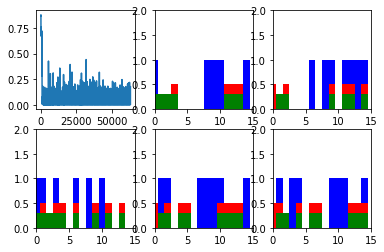

Step 100 Loss 3.67853e-05


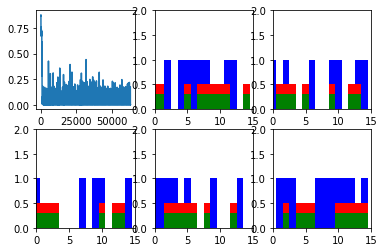

Step 200 Loss 4.39074e-05


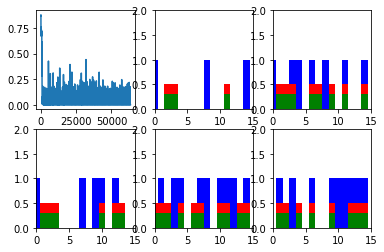

Step 300 Loss 4.13803e-05


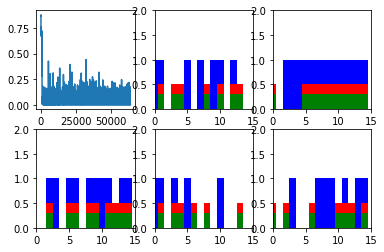

Step 400 Loss 4.12198e-05


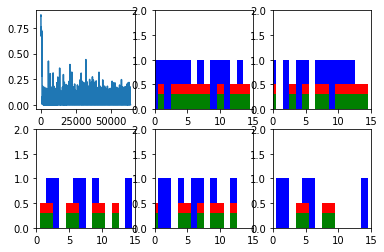

Step 500 Loss 4.06682e-05


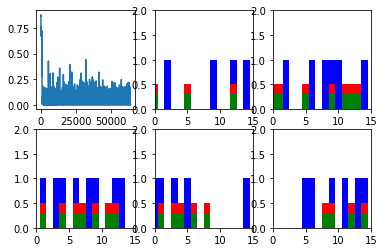

Step 600 Loss 4.01946e-05


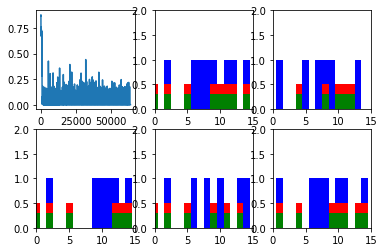

New data, epoch 96
Step 0 Loss 0.163192


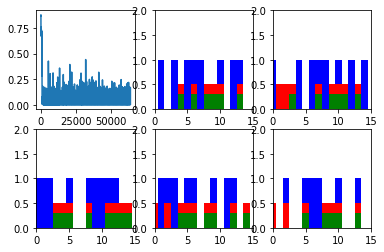

Step 100 Loss 3.82459e-05


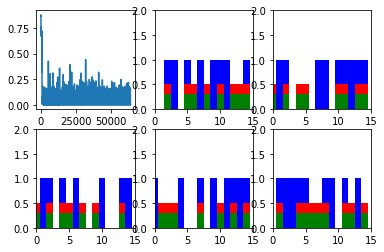

Step 200 Loss 4.24229e-05


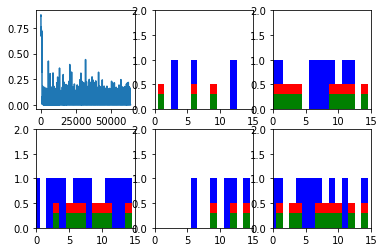

Step 300 Loss 3.68934e-05


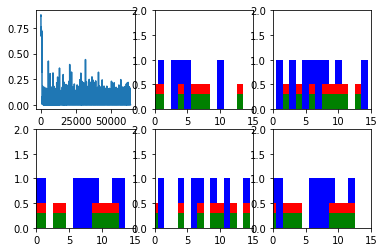

Step 400 Loss 4.32653e-05


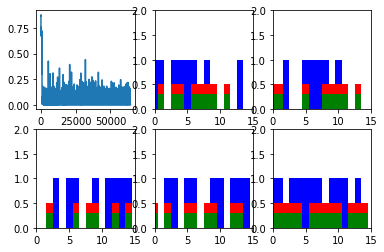

Step 500 Loss 3.93776e-05


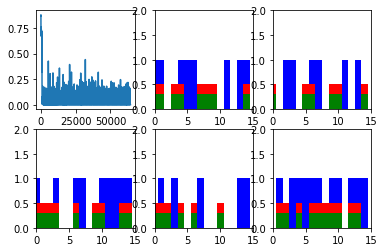

Step 600 Loss 4.11498e-05


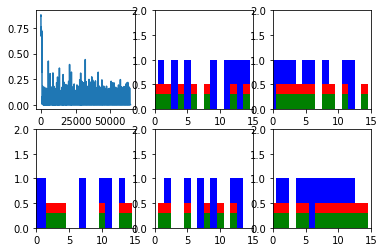

New data, epoch 97
Step 0 Loss 0.173187


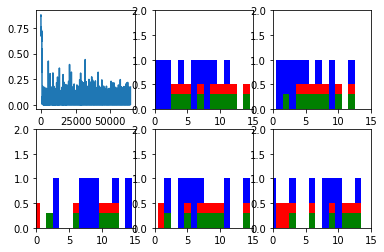

Step 100 Loss 3.76101e-05


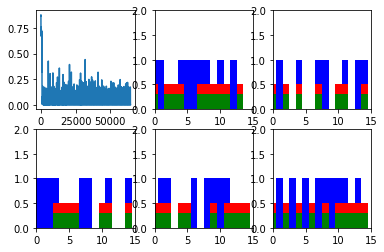

Step 200 Loss 3.79787e-05


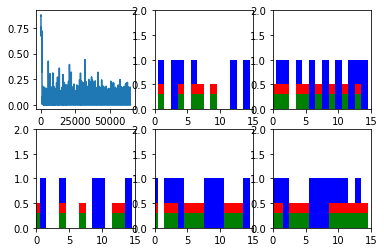

Step 300 Loss 4.20633e-05


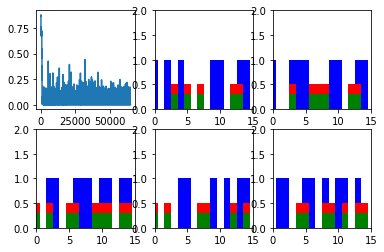

Step 400 Loss 4.34177e-05


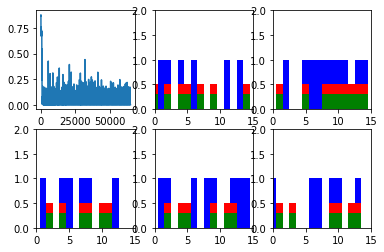

Step 500 Loss 4.15884e-05


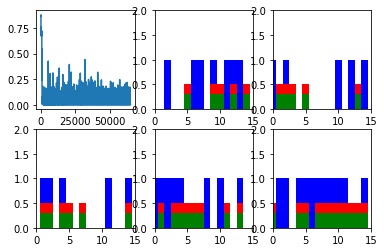

Step 600 Loss 4.3087e-05


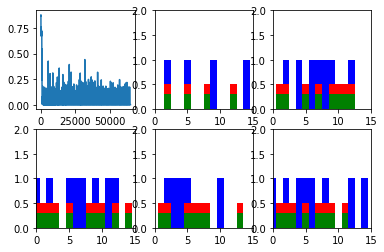

New data, epoch 98
Step 0 Loss 0.124792


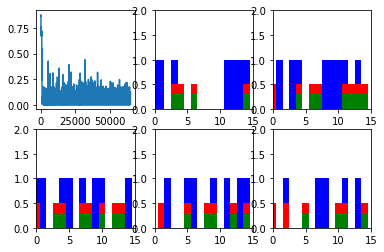

Step 100 Loss 3.90375e-05


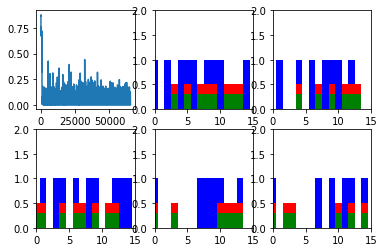

Step 200 Loss 4.0851e-05


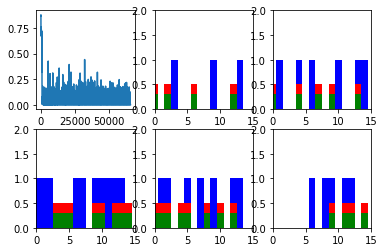

Step 300 Loss 4.37166e-05


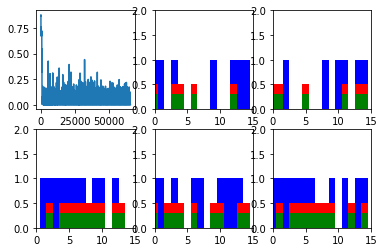

Step 400 Loss 3.60492e-05


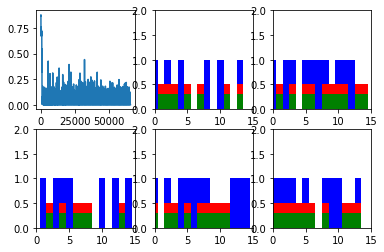

Step 500 Loss 3.87051e-05


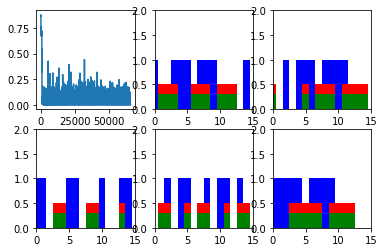

Step 600 Loss 4.52361e-05


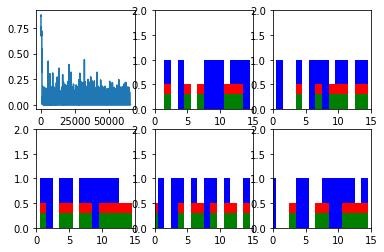

New data, epoch 99
Step 0 Loss 0.0854621


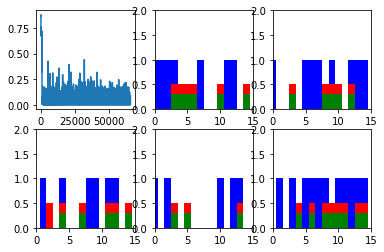

Step 100 Loss 4.37609e-05


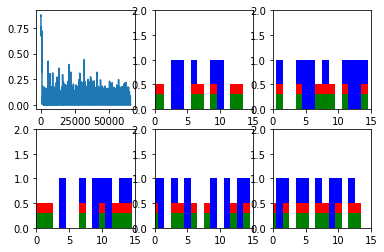

Step 200 Loss 3.66709e-05


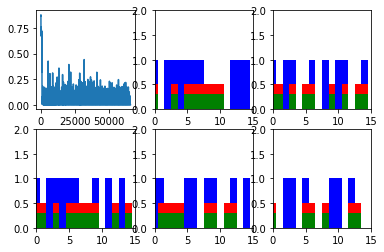

Step 300 Loss 3.95078e-05


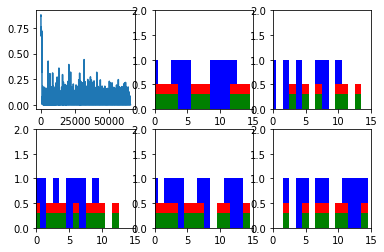

Step 400 Loss 4.65933e-05


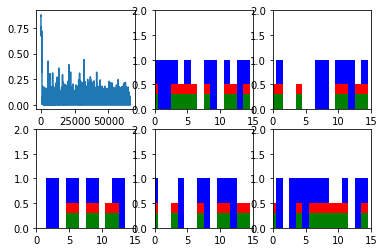

Step 500 Loss 3.88627e-05


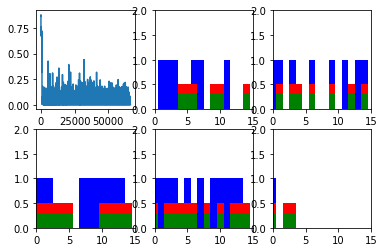

Step 600 Loss 4.13945e-05


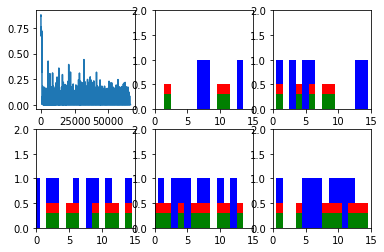

In [8]:
num_epochs = 100
total_series_length = 50000
truncated_backprop_length = 15
state_size = 4
num_classes = 2
echo_step = 3
batch_size = 5
num_batches = total_series_length//batch_size//truncated_backprop_length

def generateData():
    x = np.array(np.random.choice(2, total_series_length, p=[0.5, 0.5]))
    y = np.roll(x, echo_step)
    y[0:echo_step] = 0

    x = x.reshape((batch_size, -1))  # The first index changing slowest, subseries as rows
    y = y.reshape((batch_size, -1))

    return (x, y)

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.int32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
current_state = init_state
states_series = []
for current_input in inputs_series:
    current_input = tf.reshape(current_input, [batch_size, 1])
    input_and_state_concatenated = tf.concat([current_input, current_state], 1)  # Increasing number of columns

    next_state = tf.tanh(tf.matmul(input_and_state_concatenated, W) + b)  # Broadcasted addition
    states_series.append(next_state)
    current_state = next_state

logits_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits, labels=labels) for logits, labels in zip(logits_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdagradOptimizer(0.3).minimize(total_loss)

def plot(loss_list, predictions_series, batchX, batchY):
    plt.subplot(2, 3, 1)
    plt.cla()
    plt.plot(loss_list)

    for batch_series_idx in range(5):
        one_hot_output_series = np.array(predictions_series)[:, batch_series_idx, :]
        single_output_series = np.array([(1 if out[0] < 0.5 else 0) for out in one_hot_output_series])

        plt.subplot(2, 3, batch_series_idx + 2)
        plt.cla()
        plt.axis([0, truncated_backprop_length, 0, 2])
        left_offset = range(truncated_backprop_length)
        plt.bar(left_offset, batchX[batch_series_idx, :], width=1, color="blue")
        plt.bar(left_offset, batchY[batch_series_idx, :] * 0.5, width=1, color="red")
        plt.bar(left_offset, single_output_series * 0.3, width=1, color="green")

    plt.draw()
    plt.pause(0.0001)


with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData()
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx)

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x[:,start_idx:end_idx]
            batchY = y[:,start_idx:end_idx]

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if batch_idx%100 == 0:
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)

plt.ioff()
plt.show()


# Just positive VS negative change

In [7]:
def generateData(data, batch_size):
    x = data.iloc[np.random.choice(data.shape[0], size=(batch_size,)), :]
    x[x > 0] = 1
    x[x <= 0] = 0
    y = x.T.shift(-1).T
    return (x, y)

In [8]:
def plot(loss_list, predictions_series, batchX, batchY):
    plt.subplot(2, 3, 1)
    plt.cla()
    plt.plot(loss_list)

    for batch_series_idx in range(5):
        one_hot_output_series = np.array(predictions_series)[:, batch_series_idx, :]
        single_output_series = np.array([(1 if out[0] < 0.5 else 0) for out in one_hot_output_series])

        plt.subplot(2, 3, batch_series_idx + 2)
        plt.cla()
        plt.axis([0, truncated_backprop_length, 0, 2])
        left_offset = range(truncated_backprop_length)
        plt.bar(left_offset, batchX[batch_series_idx, :], width=1, color="blue")
        plt.bar(left_offset, batchY[batch_series_idx, :] * 0.5, width=1, color="red")
        plt.bar(left_offset, single_output_series * 0.3, width=1, color="green")

    plt.draw()
    plt.pause(0.0001)

## Simple RNN

/usr/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/lib/python3.6/site-packages/pandas/core/frame.py:2554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._where(-key, value, inplace=True)
/usr/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pand

Step 16 Loss 0.706922


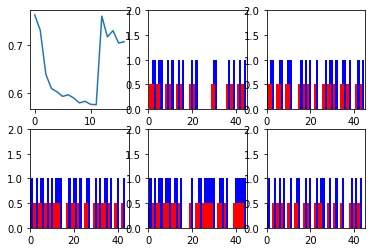

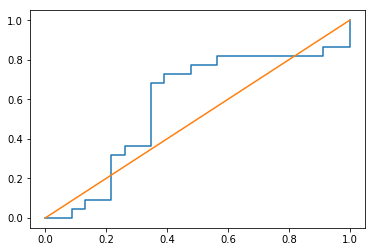

In [11]:
num_epochs = 100
total_series_length = trn.shape[1]
truncated_backprop_length = 45
state_size = 4
num_classes = 2
echo_step = 3
batch_size = 5
num_batches = total_series_length//truncated_backprop_length

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.int32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
current_state = init_state
states_series = []
for current_input in inputs_series:
    current_input = tf.reshape(current_input, [batch_size, 1])
    input_and_state_concatenated = tf.concat([current_input, current_state], 1)  # Increasing number of columns

    next_state = tf.tanh(tf.matmul(input_and_state_concatenated, W) + b)  # Broadcasted addition
    states_series.append(next_state)
    current_state = next_state

logits_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits, labels=labels) for logits, labels in zip(logits_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdagradOptimizer(0.3).minimize(total_loss)

with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx, end='\r')

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if (epoch_idx % 100 == 0) and (batch_idx == num_batches - 1):
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)
    fpr, tpr, threshs = roc_curve(batchY[-1, :], np.array(_predictions_series)[:, -1, 0])
    plt.plot(fpr, tpr)
    plt.plot([0,1],[0,1])
plt.ioff()
plt.show()


## LSTM

/usr/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/lib/python3.6/site-packages/pandas/core/frame.py:2554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._where(-key, value, inplace=True)
/usr/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pand

Step 51 Loss 0.681739


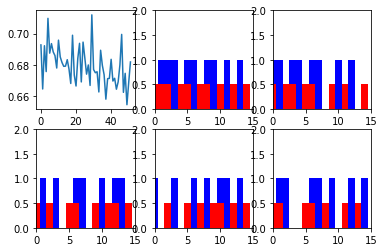

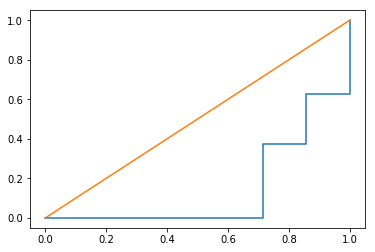

In [12]:
num_epochs = 100
total_series_length = trn.shape[1]
truncated_backprop_length = 15
state_size = 4
num_classes = 2
echo_step = 3
batch_size = 5
num_batches = total_series_length//truncated_backprop_length

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.int32, [batch_size, truncated_backprop_length])

cell_state = tf.placeholder(tf.float32, [batch_size, state_size])
hidden_state = tf.placeholder(tf.float32, [batch_size, state_size])
init_state = tf.contrib.rnn.LSTMStateTuple(cell_state, hidden_state)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.split(batchX_placeholder, truncated_backprop_length, 1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward passes
cell = tf.contrib.rnn.BasicLSTMCell(state_size, state_is_tuple=True)
states_series, current_state = tf.contrib.rnn.static_rnn(cell, inputs_series, init_state)

logits_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits, labels=labels) for logits, labels in zip(logits_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdagradOptimizer(0.3).minimize(total_loss)

with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_cell_state = np.zeros((batch_size, state_size))
        _current_hidden_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx, end='\r')

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder: batchX,
                    batchY_placeholder: batchY,
                    cell_state: _current_cell_state,
                    hidden_state: _current_hidden_state

                })

            _current_cell_state, _current_hidden_state = _current_state

            loss_list.append(_total_loss)

            if (epoch_idx % 100 == 0) and (batch_idx == num_batches - 1):
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)
    
    fpr, tpr, threshs = roc_curve(batchY[-1, :], np.array(_predictions_series)[:, -1, 0])
    plt.plot(fpr, tpr)
    plt.plot([0,1],[0,1])

plt.ioff()
plt.show()

Instructions for updating:
Use `tf.global_variables_initializer` instead.


/usr/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/lib/python3.6/site-packages/pandas/core/frame.py:2554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._where(-key, value, inplace=True)
/usr/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pand

Step 16 Loss 0.695348


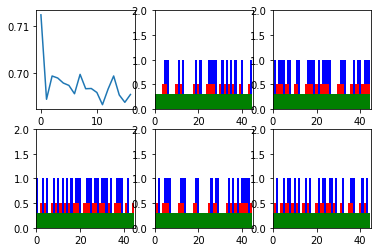

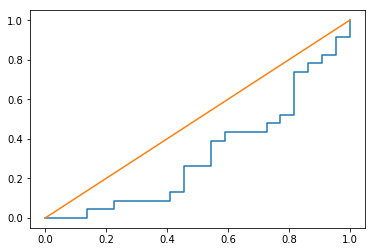

In [9]:
num_epochs = 100
total_series_length = trn.shape[1]
truncated_backprop_length = 45
state_size = 4
num_classes = 2
echo_step = 3
batch_size = 5
num_batches = total_series_length//truncated_backprop_length

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.int32, [batch_size, truncated_backprop_length])

cell_state = tf.placeholder(tf.float32, [batch_size, state_size])
hidden_state = tf.placeholder(tf.float32, [batch_size, state_size])
init_state = tf.contrib.rnn.LSTMStateTuple(cell_state, hidden_state)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.split(batchX_placeholder, truncated_backprop_length, 1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward passes
cell = tf.contrib.rnn.BasicLSTMCell(state_size, state_is_tuple=True)
states_series, current_state = tf.contrib.rnn.static_rnn(cell, inputs_series, init_state)

logits_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits, labels=labels) for logits, labels in zip(logits_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdagradOptimizer(0.3).minimize(total_loss)

with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_cell_state = np.zeros((batch_size, state_size))
        _current_hidden_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx, end='\r')

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder: batchX,
                    batchY_placeholder: batchY,
                    cell_state: _current_cell_state,
                    hidden_state: _current_hidden_state

                })

            _current_cell_state, _current_hidden_state = _current_state

            loss_list.append(_total_loss)

            if (epoch_idx % 100 == 0) and (batch_idx == num_batches - 1):
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)
    
    fpr, tpr, threshs = roc_curve(batchY[-1, :], np.array(_predictions_series)[:, -1, 0])
    plt.plot(fpr, tpr)
    plt.plot([0,1],[0,1])

plt.ioff()
plt.show()

Instructions for updating:
Use `tf.global_variables_initializer` instead.


/usr/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/lib/python3.6/site-packages/pandas/core/frame.py:2554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._where(-key, value, inplace=True)
/usr/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pand

Step 16 Loss 0.687547


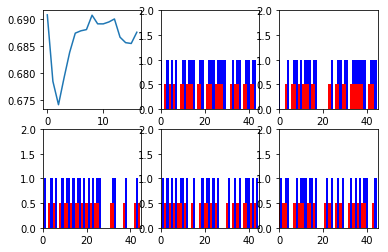

Step 16 Loss 0.658143


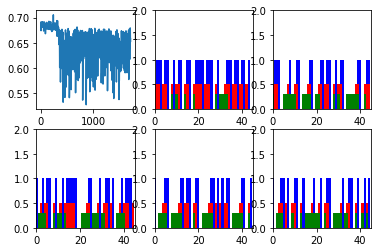

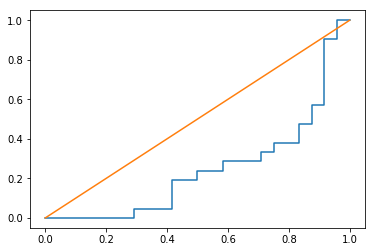

In [9]:
num_epochs = 200
total_series_length = trn.shape[1]
truncated_backprop_length = 45
state_size = 4
num_classes = 2
echo_step = 3
batch_size = 50
num_batches = total_series_length//truncated_backprop_length

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.int32, [batch_size, truncated_backprop_length])

cell_state = tf.placeholder(tf.float32, [batch_size, state_size])
hidden_state = tf.placeholder(tf.float32, [batch_size, state_size])
init_state = tf.contrib.rnn.LSTMStateTuple(cell_state, hidden_state)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.split(batchX_placeholder, truncated_backprop_length, 1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward passes
cell = tf.contrib.rnn.BasicLSTMCell(state_size, state_is_tuple=True)
states_series, current_state = tf.contrib.rnn.static_rnn(cell, inputs_series, init_state)

logits_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits, labels=labels) for logits, labels in zip(logits_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdagradOptimizer(0.3).minimize(total_loss)

with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_cell_state = np.zeros((batch_size, state_size))
        _current_hidden_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx, end='\r')

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder: batchX,
                    batchY_placeholder: batchY,
                    cell_state: _current_cell_state,
                    hidden_state: _current_hidden_state

                })

            _current_cell_state, _current_hidden_state = _current_state

            loss_list.append(_total_loss)

            if (epoch_idx % 100 == 0) and (batch_idx == num_batches - 1):
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)
    
    fpr, tpr, threshs = roc_curve(batchY[-1, :], np.array(_predictions_series)[:, -1, 0])
    plt.plot(fpr, tpr)
    plt.plot([0,1],[0,1])

plt.ioff()
plt.show()

### Changing optimizer

Instructions for updating:
Use `tf.global_variables_initializer` instead.


/usr/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/lib/python3.6/site-packages/pandas/core/frame.py:2554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._where(-key, value, inplace=True)
/usr/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pand

Step 16 Loss 0.691059


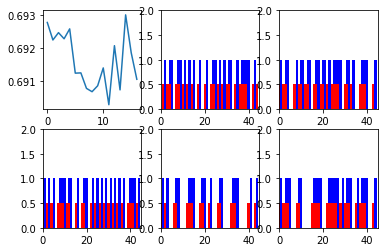

Step 16 Loss 0.620103


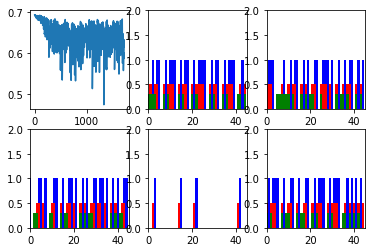

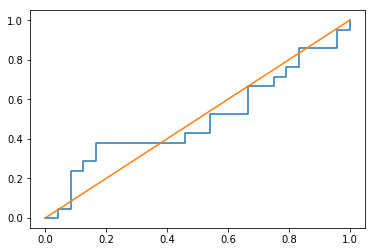

In [9]:
num_epochs = 200
total_series_length = trn.shape[1]
truncated_backprop_length = 45
state_size = 4
num_classes = 2
echo_step = 3
batch_size = 50
num_batches = total_series_length//truncated_backprop_length

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.int32, [batch_size, truncated_backprop_length])

cell_state = tf.placeholder(tf.float32, [batch_size, state_size])
hidden_state = tf.placeholder(tf.float32, [batch_size, state_size])
init_state = tf.contrib.rnn.LSTMStateTuple(cell_state, hidden_state)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.split(batchX_placeholder, truncated_backprop_length, 1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward passes
cell = tf.contrib.rnn.BasicLSTMCell(state_size, state_is_tuple=True)
states_series, current_state = tf.contrib.rnn.static_rnn(cell, inputs_series, init_state)

logits_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits, labels=labels) for logits, labels in zip(logits_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdamOptimizer().minimize(total_loss)

with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_cell_state = np.zeros((batch_size, state_size))
        _current_hidden_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx, end='\r')

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder: batchX,
                    batchY_placeholder: batchY,
                    cell_state: _current_cell_state,
                    hidden_state: _current_hidden_state

                })

            _current_cell_state, _current_hidden_state = _current_state

            loss_list.append(_total_loss)

            if (epoch_idx % 100 == 0) and (batch_idx == num_batches - 1):
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)
    
    fpr, tpr, threshs = roc_curve(batchY[-1, :], np.array(_predictions_series)[:, -1, 0])
    plt.plot(fpr, tpr)
    plt.plot([0,1],[0,1])

plt.ioff()
plt.show()

# Here be dragons
## and some serious yak shaving

### 30 day trunc backprop len

In [39]:
num_epochs = 10
total_series_length = trn.shape[1]
truncated_backprop_length = 15
state_size = 4
num_classes = 2
echo_step = 3
batch_size = 2000
num_batches = total_series_length//truncated_backprop_length

def generateData(data, batch_size):
    x = data.iloc[np.random.choice(df.shape[0], size=(batch_size,)), :]
    x[x > 0] = 1
    x[x <= 0] = 0
    y = x.T.shift(-1).T
    return (x, y)

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
current_state = init_state
states_series = []
for current_input in inputs_series:
    current_input = tf.reshape(current_input, [batch_size, 1])
    input_and_state_concatenated = tf.concat([current_input, current_state], 1)  # Increasing number of columns

    next_state = tf.matmul(input_and_state_concatenated, W) + b  # Broadcasted addition
    states_series.append(next_state)
    current_state = next_state

predictions_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
## predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.l2_loss(x - x_hat) for x_hat, x in zip(predictions_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdamOptimizer(0.001).minimize(total_loss)

def plot(loss_list, predictions_series, batchX, batchY):
    plt.subplot(2, 3, 1)
    plt.cla()
    plt.plot(loss_list)

    for batch_series_idx in range(5):
        one_hot_output_series = np.array(predictions_series)[:, batch_series_idx, :]
        single_output_series = np.array([(1 if out[0] < 0.5 else 0) for out in one_hot_output_series])

        plt.subplot(2, 3, batch_series_idx + 2)
        plt.cla()
        plt.axis([0, truncated_backprop_length, 0, 2])
        left_offset = range(truncated_backprop_length)
        plt.bar(left_offset, batchX[batch_series_idx, :], width=1, color="blue")
        plt.bar(left_offset, batchY[batch_series_idx, :] * 0.5, width=1, color="red")
        plt.bar(left_offset, single_output_series * 0.3, width=1, color="green")

    plt.draw()
    plt.pause(0.0001)


with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx)

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if batch_idx%100 == 0:
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)

plt.ioff()
plt.show()

ValueError: Dimensions must be equal, but are 2000 and 2 for 'sub_790' (op: 'Sub') with input shapes: [2000], [2000,2].

Step 16 Loss nan0


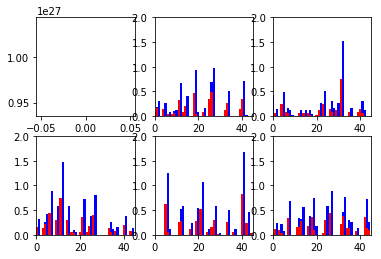

ValueError: continuous format is not supported

In [10]:
num_epochs = 10
total_series_length = trn.shape[1]
truncated_backprop_length = 45
state_size = 4
num_classes = 1
echo_step = 3
batch_size = 2000
num_batches = total_series_length//truncated_backprop_length

def generateData(data, batch_size):
    x = data.iloc[np.random.choice(df.shape[0], size=(batch_size,)), :].copy()
    y = x.T.shift(-1).T
    return (x, y)

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
current_state = init_state
states_series = []
for current_input in inputs_series:
    current_input = tf.reshape(current_input, [batch_size, 1])
    input_and_state_concatenated = tf.concat([current_input, current_state], 1)  # Increasing number of columns

    next_state = tf.matmul(input_and_state_concatenated, W) + b  # Broadcasted addition
    states_series.append(next_state)
    current_state = next_state

predictions_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
## predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.l2_loss(x - x_hat) for x_hat, x in zip(predictions_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdamOptimizer(0.001).minimize(total_loss)

with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx, end='\r')

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if (epoch_idx % 100 == 0) and (batch_idx == num_batches - 1):
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)
    
    fpr, tpr, threshs = roc_curve(batchY[-1, :], np.array(_predictions_series)[:, -1, 0])
    plt.plot(fpr, tpr)
    plt.plot([0,1],[0,1])

plt.ioff()
plt.show()